In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [6]:
# datasets = ["hatexplain"]
datasets = ['SemEval', 'SST-2', 'hatexplain', 'esnli']

grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']

if len(datasets) == 1:
    df_output = pd.read_csv(f"Results-Saliency_{datasets[0]}.csv", index_col=0)
    df_output.shape
else:
    dfs = []
    for d in datasets:
        dfs.append(pd.read_csv(f"Results-Saliency_{d}.csv", index_col=0))
    df_output=pd.concat(dfs)
    df_output.shape

In [7]:
df_output['data'].unique()

array(['SemEval', 'SST-2', 'hatexplain', 'esnli'], dtype=object)

In [8]:
df_output[df_output['model'] == 'opt'].data.unique()

array(['SST-2', 'hatexplain'], dtype=object)

In [9]:
# #replace row with issue for SEMEVAL

# from evaluation_utils import *
# import warnings
# warnings.filterwarnings('ignore')
# out = collect_stats('bert', 'SemEval', 'human', nk='wordswap', lvl='90', pt='R', temp_fix=True)

# out[5] = int(out[5]) ## Save as int

# for i in range(len(out)):
#     df_output.at[626,str(i)] = out[i]
# df_output.loc[626]

# df_output = df_output.iloc[:,:-4]
# df_output.columns = ['pattern', 'pattern_type', 'model', 'data', 'perturbation', 'lvl', 'accuracy', 'softmax_prob', 'softmax_entropy', 'certainty_mean', 'certainty_variance', 'entropy', 'mutual_info'] + [k+"_og_corr" for k in grads] + [k+"_noise_corr" for k in grads] + [k+"_anno_corr" for k in grads] + [k+"_noise_MAP" for k in grads] + [k+"_all_anno_MAP" for k in grads]+ [k+"_majo_anno_MAP" for k in grads] + [k+"_entropy" for k in grads]

# df_output.to_csv("Results-Saliency_SemEval.csv")

In [10]:
columns = [k+"_all_anno_MAP" for k in grads]

grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']

In [11]:
ex = df_output[df_output['pattern'] == 'Clean'].groupby(['model', 'data'])[columns].mean()
ex = ex.reset_index()

table = pd.pivot_table(ex, values=columns, index=['model'],
                       columns=['data'], aggfunc="sum")
table

GuidedBP_all_anno_MAP                                 \
data                        SST-2   SemEval     esnli hatexplain   
model                                                              
bert                     0.458219  0.035515  0.294087   0.253190   
electra                  0.413863  0.026782  0.283271   0.259459   
gpt2-medium              0.425218  0.039438  0.280871   0.260092   
opt                      0.503200       NaN       NaN   0.228110   
roberta                  0.407229  0.036129  0.292280   0.275291   

            InputXGrad_all_anno_MAP                                 \
data                          SST-2   SemEval     esnli hatexplain   
model                                                                
bert                       0.459506  0.033348  0.268271   0.253095   
electra                    0.394500  0.027976  0.272220   0.247011   
gpt2-medium                0.378379  0.037302  0.241154   0.258162   
opt                        0.406973       NaN       NaN   0.256270   
roberta                    0.402424  0.034432  0.272985   0.261085   

            IntegGrad_all_anno_MAP                                 \
data                         SST-2   SemEval     esnli hatexplain   
model                                                               
bert                      0.603456  0.030873  0.402436   0.315766   
electra                   0.624991  0.026206  0.389766   0.316075   
gpt2-medium               0.517621  0.044017  0.344612   0.274210   
opt                       0.518818       NaN       NaN   0.284018   
roberta                   0.609103  0.035255  0.335456   0.308990   

            SmoothGrad_all_anno_MAP                                 
data                          SST-2   SemEval     esnli hatexplain  
model                                                               
bert                       0.609258  0.073895  0.439855   0.370285  
electra                    0.434086  0.021561  0.250249   0.239580  
gpt2-medium                0.439169  0.031218  0.231363   0.223807  
opt                        0.407520       NaN       NaN   0.218889  
roberta                    0.496127  0.039450  0.313367   0.294060

In [11]:
ex = df_output[df_output['pattern'] == 'Clean'].groupby(['model', 'data'])['accuracy'].mean()
ex = ex.reset_index()

table = pd.pivot_table(ex, values='accuracy', index=['model'],
                       columns=['data'], aggfunc="sum")
table

data,SST-2,SemEval,hatexplain
model,,,
bert,0.968254,0.918626,0.489492
electra,0.952381,0.916817,0.492119
gpt2-medium,0.873016,0.854129,0.429072
opt,0.952381,NaN,NaN
roberta,0.968254,0.941531,0.496497


In [12]:
ex = df_output[df_output['lvl'] == 50].groupby(['model', 'data'])['accuracy'].mean()
ex = ex.reset_index()

table = pd.pivot_table(ex, values='accuracy', index=['model'],
                       columns=['data'], aggfunc="sum")
table

data,SST-2,SemEval,hatexplain
model,,,
bert,0.812500,0.801481,0.194150
electra,0.798611,0.772905,0.227561
gpt2-medium,0.737213,0.705564,0.199650
opt,0.781746,NaN,NaN
roberta,0.833333,0.814327,0.183040


In [13]:
ex = df_output[df_output['lvl'] == 90].groupby(['model', 'data'])['accuracy'].mean()
ex = ex.reset_index()

table = pd.pivot_table(ex, values='accuracy', index=['model'],
                       columns=['data'], aggfunc="sum")
table

data,SST-2,SemEval,hatexplain
model,,,
bert,0.625992,0.723064,0.093859
electra,0.660714,0.675972,0.114383
gpt2-medium,0.649030,0.647566,0.135754
opt,0.680556,NaN,NaN
roberta,0.711310,0.744876,0.099414


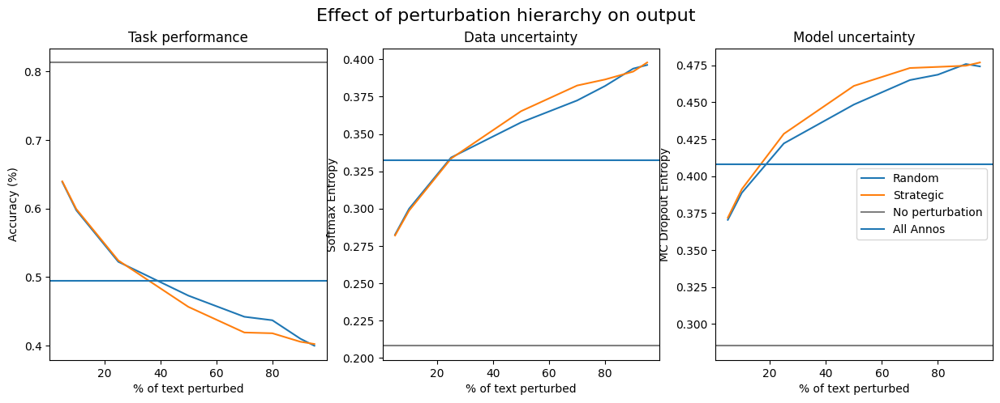

In [35]:
fig, ax = plt.subplots(1,3, figsize=(15, 5))
fig.suptitle("Effect of perturbation hierarchy on output", size= 16)

pVa = df_output.groupby(['pattern_type','lvl'])['accuracy'].mean()


ax[0].set_title("Task performance")
ax[0].plot(pVa['R'], label = "Random")
ax[0].plot(pVa['S'], label = "Strategic")
ax[0].axhline(df_output[df_output['pattern']=='Clean']['accuracy'].mean(), color='grey', label = "No perturbation")
ax[0].axhline(df_output[df_output['pattern_type']=='A']['accuracy'].mean(), label = "All Annos")
# ax[0].legend()
ax[0].set_xlabel("% of text perturbed")
ax[0].set_ylabel("Accuracy (%)")

pVc1 = df_output.groupby(['pattern_type','lvl'])['softmax_entropy'].mean()

ax[1].set_title("Data uncertainty")
ax[1].plot(pVc1['R'], label = "Random")
ax[1].plot(pVc1['S'], label = "Strategic")
ax[1].axhline(df_output[df_output['pattern']=='Clean']['softmax_entropy'].mean(), color='grey', label = "No perturbation")
ax[1].axhline(df_output[df_output['pattern_type']=='A']['softmax_entropy'].mean(), label = "All Annos")
# ax[1].legend()
ax[1].set_xlabel("% of text perturbed")
ax[1].set_ylabel("Softmax Entropy")

pVc2 = df_output.groupby(['pattern_type','lvl'])['entropy'].mean()


ax[2].set_title("Model uncertainty")
ax[2].plot(pVc2['R'], label = "Random")
ax[2].plot(pVc2['S'], label = "Strategic")
ax[2].axhline(df_output[df_output['pattern']=='Clean']['entropy'].mean(), color='grey', label = "No perturbation")
ax[2].axhline(df_output[df_output['pattern_type']=='A']['entropy'].mean(), label = "All Annos")
ax[2].legend()
ax[2].set_xlabel("% of text perturbed")
ax[2].set_ylabel("MC Dropout Entropy")


plt.show()
# plt.savefig("Figures/PatternvsOutput.png")

In [145]:
from datasets import load_from_disk
for ds in datasets:
    data = load_from_disk(f"./Data/Noise/{ds}")

    prop_adj = []
    prop_adv = []
    prop_noun = []
    prop_verb = []
    prop_other = []
    prop_anno = []
    
    if 'annotations' not in data.features:
        annos = [ i + [0.0] + j for i, j in zip(data['annotation_1'], data['annotation_2']) ]
    else:
        annos = data['annotations']

    for tags, annos in zip(data['pos_tags'], annos):
        if type(annos) != list:
            annos = [ bool(float(x)) for x in annos.split()]
        adj = 0
        adv = 0
        ver = 0
        noun = 0
        other = 0
        is_anno = 0
        total = 0
        for tag, anno in zip (tags, annos):
            if anno:
                is_anno += 1
            else:
                if tag.startswith('J'): # ADJECTIVE
                    adj += 1
                elif tag.startswith('R'): # ADVERB
                    adv += 1
                elif tag.startswith('V'): # VERB
                    ver += 1
                elif tag.startswith('N'): # NOUN
                    noun += 1
                else:
                    other += 1
            total += 1
        prop_adj.append(adj/total)
        prop_adv.append(adv/total)
        prop_noun.append(noun/total)
        prop_verb.append(ver/total)
        prop_other.append(other/total)
        prop_anno.append(is_anno/total)
        
        
lvl_order = ["Annotations", "Adjectives", "Adverbs", "Verbs", "Nouns", "Other"]

In [146]:
pVa.mean()

pattern_type  lvl 
S             5.0     0.639454
              10.0    0.599132
              25.0    0.524212
              50.0    0.456626
              70.0    0.419243
              80.0    0.418130
              90.0    0.405767
              95.0    0.402465
Name: accuracy, dtype: float64

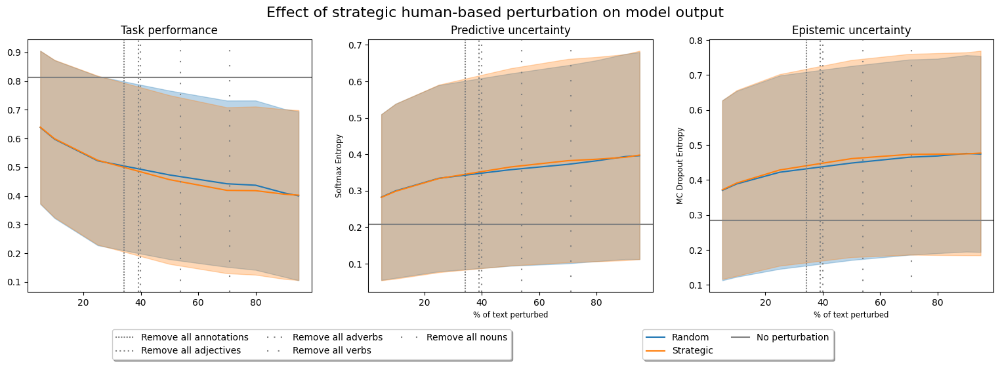

In [155]:
fig, ax = plt.subplots(1,3, figsize=(19, 5))
fig.suptitle("Effect of strategic human-based perturbation on model output", size= 16)

lvl0 = np.mean(prop_anno)*100
lvl1 = np.mean(prop_anno)*100 + np.mean(prop_adj)*100
lvl2 = lvl1 + + np.mean(prop_adv)*100
lvl3 = lvl2 + np.mean(prop_verb)*100
lvl4 = lvl3 + np.mean(prop_noun)*100

pVa = df_output.groupby(['pattern_type','lvl'])['accuracy'] #.mean()


ax[0].set_title("Task performance", fontsize=12)
ax[0].plot(pVa.mean().T['R'], color='C0')
ax[0].fill_between(pVa.mean().T['R'].index, pVa.mean().T['R'] - pVa.std().T['R'], pVa.mean().T['R'] + pVa.std().T['R'], color='C0', alpha=0.3)
ax[0].plot(pVa.mean().T['S'], color='C1')
ax[0].fill_between(pVa.mean().T['S'].index, pVa.mean().T['S'] - pVa.std().T['S'], pVa.mean().T['S'] + pVa.std().T['S'], color='C1', alpha=0.3)

# # ax[0].plot(pVa['S'], label = "Strategic")
ax[0].axhline(df_output[df_output['pattern']=='Clean']['accuracy'].mean(), color='grey', label = "No perturbation")
ax[0].axvline(lvl0, color='grey', linestyle='--', dashes=(1, 1), label = "Remove Annotations")
ax[0].axvline(lvl1, color='grey', linestyle='--', dashes=(1, 2), label = "Remove all adjectives")
ax[0].axvline(lvl2, color='grey', linestyle='--', dashes=(1, 4), label = "Remove all adverbs")
ax[0].axvline(lvl3, color='grey', linestyle='--', dashes=(1, 7), label = "Remove all verbs")
ax[0].axvline(lvl4, color='grey', linestyle='--', dashes=(1, 10), label = "Remove all nouns")

# # ax[0].legend()
# ax[0].set_xlabel("% of text perturbed")
# ax[0].set_ylabel("Accuracy (%)")

pVa = df_output.groupby(['pattern_type','lvl'])['softmax_entropy'] #.mean()

ax[1].set_title("Predictive uncertainty", fontsize=12)
ax[1].plot(pVa.mean()['R'], color='C0')
ax[1].fill_between(pVa.mean().T['R'].index, pVa.mean().T['R'] - pVa.std().T['R'], pVa.mean().T['R'] + pVa.std().T['R'], color='C0', alpha=0.3)
ax[1].plot(pVa.mean()['S'], color='C1')
ax[1].fill_between(pVa.mean().T['S'].index, pVa.mean().T['S'] - pVa.std().T['S'], pVa.mean().T['S'] + pVa.std().T['S'], color='C1', alpha=0.3)

ax[1].axhline(df_output[df_output['pattern']=='Clean']['softmax_entropy'].mean(), color='grey')
# ax[1].axvline(np.mean(prop_anno)*100, color='grey', linestyle=":")
ax[1].axvline(lvl0, color='grey', linestyle='--', dashes=(1, 1), label = "Remove all annotations")
ax[1].axvline(lvl1, color='grey', linestyle='--', dashes=(1, 2), label = "Remove all adjectives")
ax[1].axvline(lvl2, color='grey', linestyle='--', dashes=(1, 4), label = "Remove all adverbs")
ax[1].axvline(lvl3, color='grey', linestyle='--', dashes=(1, 7), label = "Remove all verbs")
ax[1].axvline(lvl4, color='grey', linestyle='--', dashes=(1, 10), label = "Remove all nouns")

ax[1].set_xlabel("% of text perturbed")
ax[1].set_ylabel("Softmax Entropy")
ax[1].legend(loc='upper center', bbox_to_anchor=(-0.2, -0.13), ncol=3, fancybox=True, shadow=True)
# (loc='upper center', bbox_to_anchor=(0.5, 1.05),
#           ncol=3, fancybox=True, shadow=True)
pVa = df_output.groupby(['pattern_type','lvl'])['entropy'] #.mean()


ax[2].set_title("Epistemic uncertainty", fontsize=12)
# ax[2].plot(pVc2['R'], label = "Random")
# ax[2].plot(pVc2['S'], label = "Strategic")

ax[2].plot(pVa.mean()['R'], color='C0', label = "Random")
ax[2].fill_between(pVa.mean().T['R'].index, pVa.mean().T['R'] - pVa.std().T['R'], pVa.mean().T['R'] + pVa.std().T['R'], color='C0', alpha=0.3)
ax[2].plot(pVa.mean()['S'], color='C1', label = "Strategic")
ax[2].fill_between(pVa.mean().T['S'].index, pVa.mean().T['S'] - pVa.std().T['S'], pVa.mean().T['S'] + pVa.std().T['S'], color='C1', alpha=0.3)


ax[2].axhline(df_output[df_output['pattern']=='Clean']['entropy'].mean(), color='grey', label = "No perturbation")
ax[2].axvline(lvl0, color='grey', linestyle='--', dashes=(1, 1))
ax[2].axvline(lvl1, color='grey', linestyle='--', dashes=(1, 2))
ax[2].axvline(lvl2, color='grey', linestyle='--', dashes=(1, 4))
ax[2].axvline(lvl3, color='grey', linestyle='--', dashes=(1, 7))
ax[2].axvline(lvl4, color='grey', linestyle='--', dashes=(1, 10))

ax[2].set_xlabel("% of text perturbed")
ax[2].set_ylabel("MC Dropout Entropy")

ax[2].legend(loc='upper center', bbox_to_anchor=(0.1, -0.13),ncols=2, fancybox=True, shadow=True)


# pVa = df_output.groupby(['pattern_type', 'lvl'])[columns]#.mean().mean(axis=1)

# ax[3].axhline(df_output[df_output['pattern'] == 'Clean'][columns].mean().mean(), label = "No perturbation", color='grey')

# ax[3].set_title("Explanation Plausibility")
# # ax[3].plot(pVa['R'], label = "Random")
# # ax[3].plot(pVa['S'], label = "Strategic")

# ax[3].plot(pVa.mean().mean(axis=1).T['R'], color='C0', label = "Random")
# ax[3].fill_between(pVa.mean().mean(axis=1).T['R'].index, pVa.mean().mean(axis=1).T['R'] - pVa.std().mean(axis=1).T['R'], pVa.mean().mean(axis=1).T['R'] +pVa.std().mean(axis=1).T['R'], color='C0', alpha=0.3)
# ax[3].plot(pVa.mean().mean(axis=1).T['S'], color='C1', label = "Strategic")
# ax[3].fill_between(pVa.mean().mean(axis=1).T['S'].index, pVa.mean().mean(axis=1).T['S'] - pVa.std().mean(axis=1).T['S'], pVa.mean().mean(axis=1).T['S'] + pVa.std().mean(axis=1).T['S'], color='C1', alpha=0.3)


# # ax[3].axhline(df_output[df_output['pattern']=='Clean'][columns].mean(), color='grey', label = "No perturbation")
# ax[3].axvline(lvl0, color='grey', linestyle='--', dashes=(1, 1))
# ax[3].axvline(lvl1, color='grey', linestyle='--', dashes=(1, 2))
# ax[3].axvline(lvl2, color='grey', linestyle='--', dashes=(1, 4))
# ax[3].axvline(lvl3, color='grey', linestyle='--', dashes=(1, 7))
# ax[3].axvline(lvl4, color='grey', linestyle='--', dashes=(1, 10))

# ax[3].set_xlabel("% of text perturbed")
# ax[3].set_ylabel("Mean Average Precision")


plt.show()
# plt.savefig("Figures/PatternvsOutput.png"

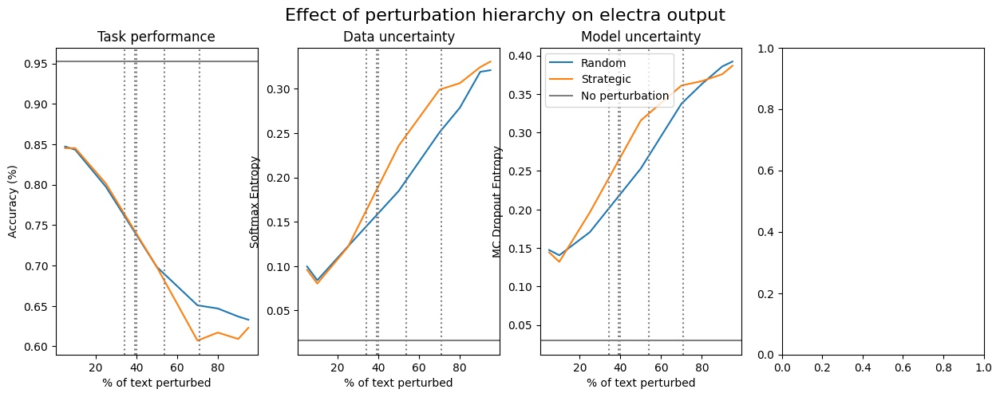

In [50]:
model = 'electra'
df_output_new = df_output[df_output['data'] == 'SST-2']
fig, ax = plt.subplots(1,4, figsize=(15, 5))
fig.suptitle(f"Effect of perturbation hierarchy on {model} output", size= 16)

pVa = df_output_new.groupby(['pattern_type', 'model','lvl'])['accuracy'].mean()


ax[0].set_title("Task performance")
ax[0].plot(pVa['R'][model], label = "Random")
ax[0].plot(pVa['S'][model], label = "Strategic")
ax[0].axhline(df_output_new[(df_output_new['pattern']=='Clean') & (df_output_new['model']==model)]['accuracy'].mean(), color='grey', label = "No perturbation")
ax[0].axvline(lvl0, color='grey', linestyle=":")
ax[0].axvline(lvl1, color='grey', linestyle=":")
ax[0].axvline(lvl2, color='grey', linestyle=":")
ax[0].axvline(lvl3, color='grey', linestyle=":")
ax[0].axvline(lvl4, color='grey', linestyle=":")
# ax[0].legend()
ax[0].set_xlabel("% of text perturbed")
ax[0].set_ylabel("Accuracy (%)")

pVc1 = df_output_new.groupby(['pattern_type','model','lvl'])['softmax_entropy'].mean()

ax[1].set_title("Data uncertainty")
ax[1].plot(pVc1['R'][model], label = "Random")
ax[1].plot(pVc1['S'][model], label = "Strategic")
ax[1].axhline(df_output_new[(df_output_new['pattern']=='Clean') & (df_output_new['model']==model)]['softmax_entropy'].mean(), color='grey', label = "No perturbation")
ax[1].axvline(lvl0, color='grey', linestyle=":")
ax[1].axvline(lvl1, color='grey', linestyle=":")
ax[1].axvline(lvl2, color='grey', linestyle=":")
ax[1].axvline(lvl3, color='grey', linestyle=":")
ax[1].axvline(lvl4, color='grey', linestyle=":")
# ax[1].legend()
ax[1].set_xlabel("% of text perturbed")
ax[1].set_ylabel("Softmax Entropy")

pVc2 = df_output_new.groupby(['pattern_type','model','lvl'])['entropy'].mean()


ax[2].set_title("Model uncertainty")
ax[2].plot(pVc2['R'][model], label = "Random")
ax[2].plot(pVc2['S'][model], label = "Strategic")
ax[2].axhline(df_output_new[(df_output_new['pattern']=='Clean') & (df_output_new['model']==model)]['entropy'].mean(), color='grey', label = "No perturbation")
ax[2].axvline(lvl0, color='grey', linestyle=":")
ax[2].axvline(lvl1, color='grey', linestyle=":")
ax[2].axvline(lvl2, color='grey', linestyle=":")
ax[2].axvline(lvl3, color='grey', linestyle=":")
ax[2].axvline(lvl4, color='grey', linestyle=":")
ax[2].legend()
ax[2].set_xlabel("% of text perturbed")
ax[2].set_ylabel("MC Dropout Entropy")





plt.show()
# plt.savefig("Figures/PatternvsOutput.png")

## RQ1

In [12]:
# Processing
df_output_full = df_output
df_output = df_output_full[~(df_output_full['pattern_type'].isin(['R','A']))] # & (df_output_full['model'] != 'opt')] #df_output#
df_output['lvl'].loc[df_output[df_output['pattern'] == 'Clean'].index.tolist()] = 0


/tmp/ipykernel_10692/1923246256.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_output['lvl'].loc[df_output[df_output['pattern'] == 'Clean'].index.tolist()] = 0


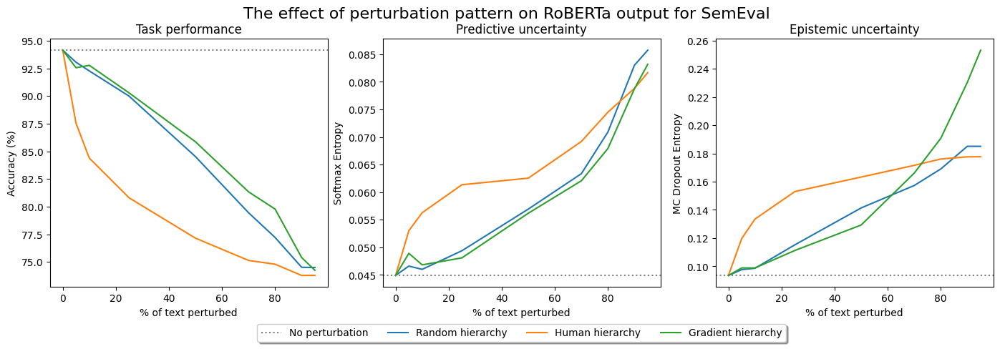

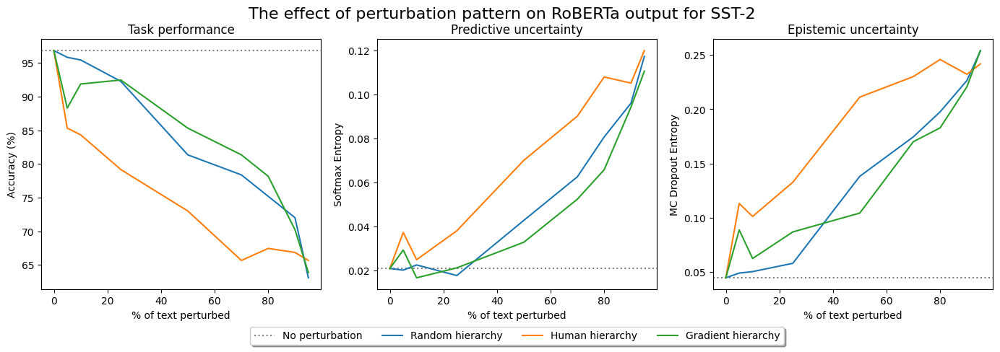

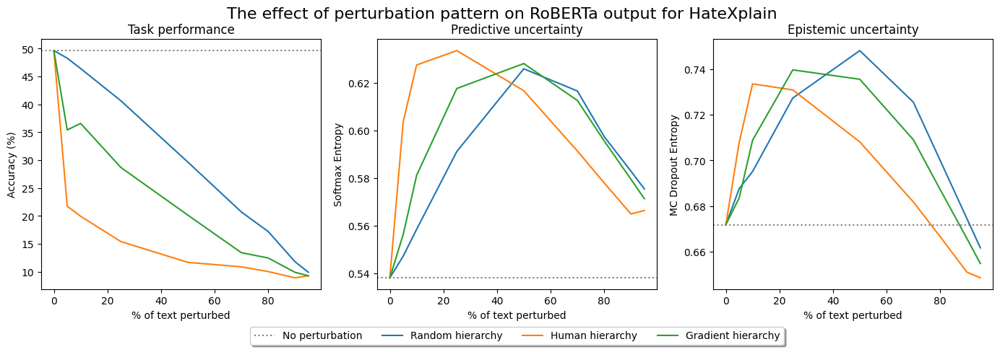

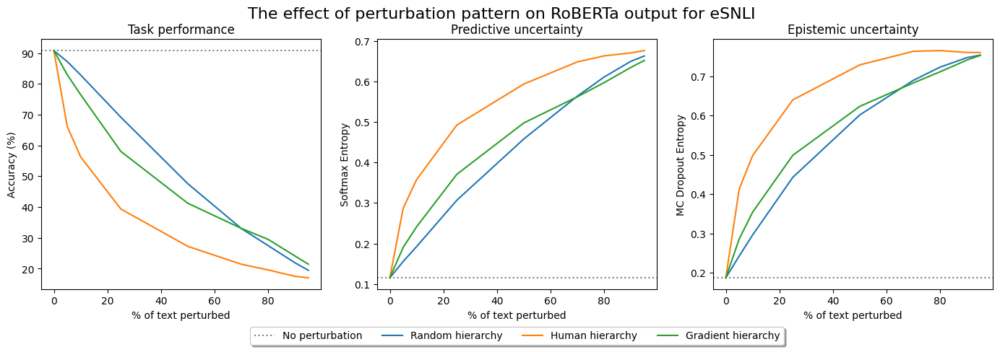

In [13]:

df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'Electra', 'gpt2-medium': 'GPT2-medium', 'opt': 'OPT'}

data_to_text = {'SST-2': 'SST-2', 'SemEval': 'SemEval', 'hatexplain': 'HateXplain', 'esnli': 'eSNLI'}


### SHOW LINE STYLE OF MODEL
### JUST INCLUDE THE BEST

for DOI in datasets:

    subset = df_output[(df_output['data'] == DOI) & ( df_output['model'] == 'roberta')] #df_output[df_output['data'] == 'hatexplain']

    fig, ax = plt.subplots(1,3, figsize=(17, 4.5))
    fig.suptitle(f"The effect of perturbation pattern on RoBERTa output for {data_to_text[DOI]}", size= 16)

    pVa = subset.groupby(['pattern','lvl'])['accuracy'].mean()

    grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
    # columns = [f'{k}_og_corr' for k in grads]
    columns = [f'{k}_all_anno_MAP' for k in grads]


    ax[0].set_title("Task performance", fontsize=12)
    zero_level = subset[subset['pattern'] == 'Clean']['accuracy'].mean()*100
    ax[0].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
    ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['random']*100]) , label = "Replacement with MASK")
    ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['human']*100]) , label = "Replacement with MASK")
    ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['gradient']*100]) , label = "Replacement with MASK")
    # ax[0].plot(pVa['gradient']*100, label = "Character swap")


    # ax[0].set_ylim(0,1)
    ax[0].set_xlabel("% of text perturbed")
    ax[0].set_ylabel("Accuracy (%)")

    pVc1 = subset.groupby(['pattern','lvl'])['softmax_entropy'].mean()
    zero_level = subset[subset['pattern'] == 'Clean']['softmax_entropy'].mean()

    ax[1].set_title("Predictive uncertainty", fontsize=12)
    ax[1].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
    ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1['random']]), label = "Random hierarchy")
    ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1['human']]), label = "Human hierarchy")
    ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1['gradient']]), label = "Gradient hierarchy")
    ax[1].set_xlabel("% of text perturbed")
    # ax[1].set_ylim(.6)
    ax[1].set_ylabel("Softmax Entropy")

    pVc2 = subset.groupby(['pattern','lvl'])['entropy'].mean()
    zero_level = subset[subset['pattern'] == 'Clean']['entropy'].mean()
    ax[2].set_title("Epistemic uncertainty", fontsize=12)
    ax[2].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
    ax[2].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc2['random']]), label = "Random hierarchy")
    ax[2].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc2['human']]), label = "Human hierarchy")
    ax[2].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc2['gradient']]), label = "Gradient hierarchy")
    # ax[2].legend()
    # ax[2].set_ylim(.6)
    ax[2].set_xlabel("% of text perturbed")
    ax[2].set_ylabel("MC Dropout Entropy")

    # ax[3].set_title("Mean Explanation Plausibility")

    # pVa = subset.groupby(['pattern', 'lvl'])[columns].mean().mean(axis=1)
    # zero_level = subset[subset['pattern'] == 'Clean'][columns].mean().mean()
    # ax[3].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')

    # ax[3].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVa['random']]), label = "Random hierarchy")
    # ax[3].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVa['human']]), label = "Human hierarchy")
    # ax[3].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVa['gradient']]), label = "Gradient hierarchy")
    # ax[3].set_xlabel("% of text perturbed")
    # ax[3].set_ylabel("Mean Average Precision")

    ax[1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.13),ncol=4, fancybox=True, shadow=True)

    # plt.tight_layout()
    plt.show()
    # plt.savefig("Figures/TypevsOutput_1.png")
    
    

In [15]:
# model_linestyles = {
#     'bert': '-',
#     'electra': ':',
#     'roberta': '--',
#     'gpt2-medium': '-.',
#     'opt': (0, (3, 1, 1, 1))
# }

# from matplotlib.lines import Line2D

# models = ['bert', 'electra', 'roberta', 'gpt2-medium', 'opt']

# df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'Electra', 'gpt2-medium': 'GPT2-medium'}

# data_to_text = {'SST-2': 'SST-2', 'SemEval': 'SemEval', 'hatexplain': 'HateXplain', 'esnli': 'eSNLI'}

# for DOI in datasets:

#     subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']

#     fig, ax = plt.subplots(1,4, figsize=(22, 5))
#     fig.suptitle(f"The effect of perturbation pattern on model output for {data_to_text[DOI]}", size= 16)

#     pVa = subset.groupby(['pattern','model', 'lvl'])['accuracy'].mean()

#     grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
#     # columns = [f'{k}_og_corr' for k in grads]
#     columns = [f'{k}_all_anno_MAP' for k in grads]


#     ax[0].set_title("Task performance")
#     zero_level = subset[subset['pattern'] == 'Clean']['accuracy'].mean()*100
#     ax[0].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
#     for m in models:
#         if m in subset.model.unique():
#             ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['random'][m]*100]) , color='C0', linestyle=model_linestyles[m])
#             ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['human'][m]*100]) , color='C1', linestyle=model_linestyles[m], label = "Replacement with MASK")
#             ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['gradient'][m]*100]) , color='C2', linestyle=model_linestyles[m], label = "Replacement with MASK")
#     # ax[0].plot(pVa['gradient']*100, label = "Character swap")


#     # ax[0].set_ylim(0,1)
#     ax[0].set_xlabel("% of text perturbed")
#     ax[0].set_ylabel("Accuracy (%)")

#     pVa = subset.groupby(['pattern','model','lvl'])['softmax_entropy'].mean()
#     zero_level = subset[subset['pattern'] == 'Clean']['softmax_entropy'].mean()

#     ax[1].set_title("Predictive uncertainty")
#     ax[1].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
#     for m in models:
#         if m in subset.model.unique():
#             ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['random'][m]*100]) , color='C0', linestyle=model_linestyles[m])
#             ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['human'][m]*100]) , color='C1', linestyle=model_linestyles[m], label = "Replacement with MASK")
#             ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['gradient'][m]*100]) , color='C2', linestyle=model_linestyles[m], label = "Replacement with MASK")
#     ax[1].set_xlabel("% of text perturbed")
#     # ax[1].set_ylim(.6)
#     ax[1].set_ylabel("Softmax Entropy")

#     pVc2 = subset.groupby(['pattern','model','lvl'])['entropy'].mean()
#     zero_level = subset[subset['pattern'] == 'Clean']['entropy'].mean()
#     ax[2].set_title("Epistemic uncertainty")
#     ax[2].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
#     for m in models:
#         if m in subset.model.unique():
#             ax[2].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['random'][m]*100]) , color='C0', linestyle=model_linestyles[m])
#             ax[2].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['human'][m]*100]) , color='C1', linestyle=model_linestyles[m], label="Human hierarchy")
#             ax[2].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['gradient'][m]*100]) , color='C2', linestyle=model_linestyles[m], label="Gradient hierarchy")
    
#     legend_colors = [
#         Line2D([0], [0], color='C0', label="Random hierarchy"),
#         Line2D([0], [0], color='C1', label="Human hierarchy"),
#         Line2D([0], [0], color='C2', label="Gradient hierarchy")

#     ]
#     ax[2].legend(handles = legend_colors, loc='upper center', bbox_to_anchor=(-1.1, -0.13),ncol=4, fancybox=True, shadow=True)
#     # ax[2].set_ylim(.6)
#     ax[2].set_xlabel("% of text perturbed")
#     ax[2].set_ylabel("MC Dropout Entropy")

#     ax[3].set_title("Mean Explanation Plausibility")

#     pVa = subset.groupby(['pattern','model', 'lvl'])[columns].mean().T
#     legend_elements = []
#     for c in columns:
#         zero_level = subset[subset['pattern'] == 'Clean'][columns].mean()
#         print(c.split("_")[0])
#         ax[3].axhline(zero_level.mean(), label = "No perturbation", color='grey', linestyle=':')
#         # print(zero_level[c])
#         # ax[3].plot(pd.concat([pd.Series([zero_level[c]], index=[0.0]),pVa['random'].loc[c]]), color='C0', linestyle=grad_linestyles[c.split("_")[0]], label = "Random hierarchy")
#         # ax[3].plot(pd.concat([pd.Series([zero_level[c]], index=[0.0]),pVa['human'].loc[c]]), color='C1', linestyle=grad_linestyles[c.split("_")[0]], label = "Human hierarchy")
#         # ax[3].plot(pd.concat([pd.Series([zero_level[c]], index=[0.0]),pVa['gradient'].loc[c]]), color='C2', linestyle=grad_linestyles[c.split("_")[0]], label = "Gradient hierarchy")
#         ax[3].set_xlabel("% of text perturbed")
#         ax[3].set_ylabel("Mean Average Precision")
#         # legend_elements.append(Line2D([0], [0], color='k', linestyle=grad_linestyles[c.split("_")[0]], label=c.split("_")[0]))
        
#     ax[3].legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(-.4, -0.13),ncol=4, fancybox=True, shadow=True)

#     plt.show()
#     # plt.savefig("Figures/TypevsOutput_1.png")



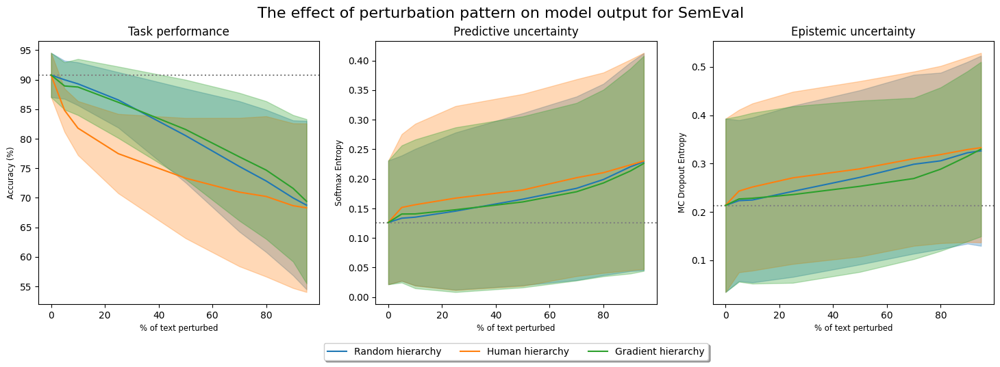

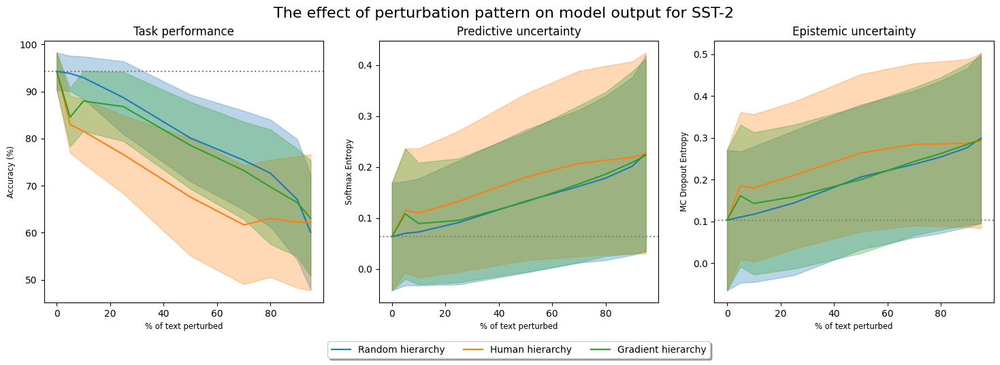

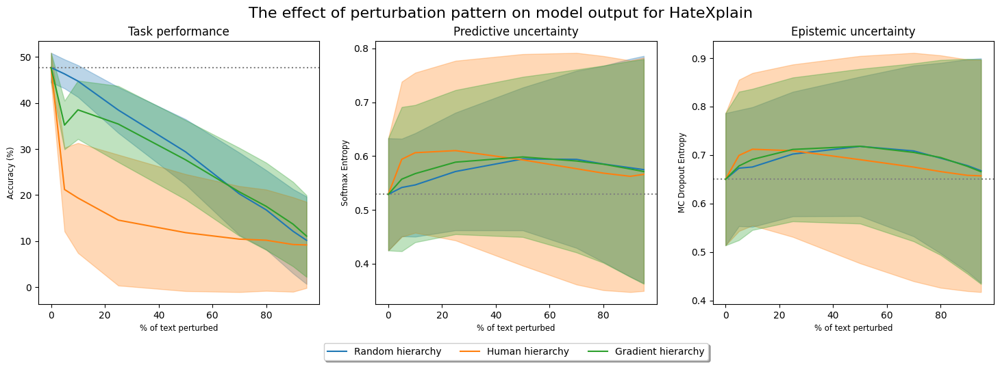

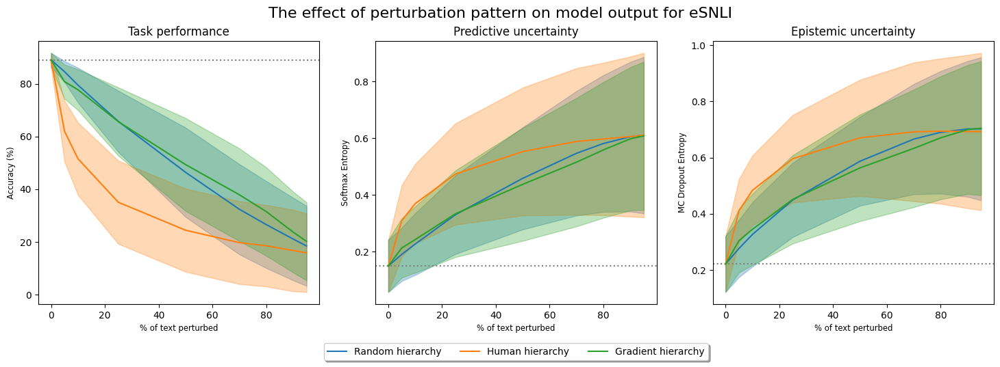

In [191]:
lvls = [0, 5, 10, 25,50,70,80,90,95]

from matplotlib.lines import Line2D

models = ['bert', 'electra', 'roberta', 'gpt2-medium', 'opt']

df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'Electra', 'gpt2-medium': 'GPT2-medium'}

data_to_text = {'SST-2': 'SST-2', 'SemEval': 'SemEval', 'hatexplain': 'HateXplain', 'esnli': 'eSNLI'}

for DOI in datasets:

    subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']
    if DOI != 'SST-2':
        subset = subset.drop(labels=4)

    fig, ax = plt.subplots(1,3, figsize=(18, 5))
    fig.suptitle(f"The effect of perturbation pattern on model output for {data_to_text[DOI]}", size= 16)

    pVa = subset.groupby(['pattern', 'lvl'])['accuracy'] #.mean()

    grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
    # columns = [f'{k}_og_corr' for k in grads]
    columns = [f'{k}_all_anno_MAP' for k in grads]


    ax[0].set_title("Task performance", fontsize=12)
    zero_level = subset[subset['pattern'] == 'Clean']['accuracy'].mean()*100
    ax[0].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
    mn = (pVa.mean().T[['Clean','random']]*100).reset_index().set_index('lvl')['accuracy']
    std = (pVa.std().T[['Clean','random']]*100).reset_index().set_index('lvl')['accuracy']
    ax[0].plot(mn, color='C0')
    ax[0].fill_between(lvls,  mn-std, mn+std, alpha=0.3, color='C0')
    
    mn = (pVa.mean().T[['Clean','human']]*100).reset_index().set_index('lvl')['accuracy']
    std = (pVa.std().T[['Clean','human']]*100).reset_index().set_index('lvl')['accuracy']
    ax[0].plot(mn, color='C1')
    ax[0].fill_between(lvls,  mn-std, mn+std, alpha=0.3, color='C1')
    
    mn = (pVa.mean().T[['Clean','gradient']]*100).reset_index().set_index('lvl')['accuracy']
    std = (pVa.std().T[['Clean','gradient']]*100).reset_index().set_index('lvl')['accuracy']
    ax[0].plot(mn, color='C2')
    ax[0].fill_between(lvls,  mn-std, mn+std, alpha=0.3, color='C2')
    # ax[0].plot(pVa['gradient']*100, label = "Character swap")


    # ax[0].set_ylim(0,1)
    ax[0].set_xlabel("% of text perturbed")
    ax[0].set_ylabel("Accuracy (%)")

    pVa = subset.groupby(['pattern','lvl'])['softmax_entropy'] #.mean()
    zero_level = subset[subset['pattern'] == 'Clean']['softmax_entropy'].mean()

    ax[1].set_title("Predictive uncertainty", fontsize=12)
    ax[1].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
    mn = (pVa.mean().T[['Clean','random']]).reset_index().set_index('lvl')['softmax_entropy']
    std = (pVa.std().T[['Clean','random']]).reset_index().set_index('lvl')['softmax_entropy']
    ax[1].plot(mn, color='C0')
    ax[1].fill_between(lvls,  mn-std, mn+std, alpha=0.3, color='C0')
    
    mn = (pVa.mean().T[['Clean','human']]).reset_index().set_index('lvl')['softmax_entropy']
    std = (pVa.std().T[['Clean','human']]).reset_index().set_index('lvl')['softmax_entropy']
    ax[1].plot(mn, color='C1')
    ax[1].fill_between(lvls,  mn-std, mn+std, alpha=0.3, color='C1')
    
    mn = (pVa.mean().T[['Clean','gradient']]).reset_index().set_index('lvl')['softmax_entropy']
    std = (pVa.std().T[['Clean','gradient']]).reset_index().set_index('lvl')['softmax_entropy']
    ax[1].plot(mn, color='C2')
    ax[1].fill_between(lvls,  mn-std, mn+std, alpha=0.3, color='C2')
    # ax[0].plot(pVa['gradient'], label = "Character swap")
    ax[1].set_xlabel("% of text perturbed")
    # ax[1].set_ylim(.6)
    ax[1].set_ylabel("Softmax Entropy")

    pVa = subset.groupby(['pattern','lvl'])['entropy'] #.mean()
    zero_level = subset[subset['pattern'] == 'Clean']['entropy'].mean()
    ax[2].set_title("Epistemic uncertainty", fontsize=12)
    ax[2].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
    mn = (pVa.mean().T[['Clean','random']]).reset_index().set_index('lvl')['entropy']
    std = (pVa.std().T[['Clean','random']]).reset_index().set_index('lvl')['entropy']
    ax[2].plot(mn, color='C0')
    ax[2].fill_between(lvls,  mn-std, mn+std, alpha=0.3, color='C0')
    
    mn = (pVa.mean().T[['Clean','human']]).reset_index().set_index('lvl')['entropy']
    std = (pVa.std().T[['Clean','human']]).reset_index().set_index('lvl')['entropy']
    ax[2].plot(mn, color='C1')
    ax[2].fill_between(lvls,  mn-std, mn+std, alpha=0.3, color='C1')
    
    mn = (pVa.mean().T[['Clean','gradient']]).reset_index().set_index('lvl')['entropy']
    std = (pVa.std().T[['Clean','gradient']]).reset_index().set_index('lvl')['entropy']
    ax[2].plot(mn, color='C2')
    ax[2].fill_between(lvls,  mn-std, mn+std, alpha=0.3, color='C2')
    # ax[0].plot(pVa['gradient'], label = "Character swap")
    
    legend_colors = [
        Line2D([0], [0], color='C0', label="Random hierarchy"),
        Line2D([0], [0], color='C1', label="Human hierarchy"),
        Line2D([0], [0], color='C2', label="Gradient hierarchy")

    ]
    ax[1].legend(handles = legend_colors, loc='upper center', bbox_to_anchor=(0.5, -0.13),ncol=4, fancybox=True, shadow=True)
    # ax[2].set_ylim(.6)
    ax[2].set_xlabel("% of text perturbed")
    ax[2].set_ylabel("MC Dropout Entropy")

    plt.show()
    # plt.savefig("Figures/TypevsOutput_1.png")




In [16]:
# grad_linestyles = {
#     'IntegGrad': '-',
#     'GuidedBP': ':',
#     'InputXGrad': '--',
#     'SmoothGrad': '-.'
# }

# from matplotlib.lines import Line2D



# df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'Electra', 'gpt2-medium': 'GPT2-medium'}

# data_to_text = {'SST-2': 'SST-2', 'SemEval': 'SemEval', 'hatexplain': 'HateXplain', 'esnli': 'eSNLI'}

# for DOI in datasets:

#     subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']

#     fig, ax = plt.subplots(1,4, figsize=(22, 5))
#     fig.suptitle(f"The effect of perturbation pattern on model output for {data_to_text[DOI]}", size= 16)

#     pVa = subset.groupby(['pattern','lvl'])['accuracy'].mean()

#     grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
#     # columns = [f'{k}_og_corr' for k in grads]
#     columns = [f'{k}_all_anno_MAP' for k in grads]


#     ax[0].set_title("Task performance")
#     zero_level = subset[subset['pattern'] == 'Clean']['accuracy'].mean()*100
#     ax[0].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
#     ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['random']*100]) , label = "Replacement with MASK")
#     ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['human']*100]) , label = "Replacement with MASK")
#     ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]), pVa['gradient']*100]) , label = "Replacement with MASK")
#     # ax[0].plot(pVa['gradient']*100, label = "Character swap")


#     # ax[0].set_ylim(0,1)
#     ax[0].set_xlabel("% of text perturbed")
#     ax[0].set_ylabel("Accuracy (%)")

#     pVc1 = subset.groupby(['pattern','lvl'])['softmax_entropy'].mean()
#     zero_level = subset[subset['pattern'] == 'Clean']['softmax_entropy'].mean()

#     ax[1].set_title("Predictive uncertainty")
#     ax[1].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
#     ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1['random']]), label = "Replacement with MASK")
#     ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1['human']]), label = "Replacement with UNK")
#     ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1['gradient']]), label = "Character swap")
#     ax[1].set_xlabel("% of text perturbed")
#     # ax[1].set_ylim(.6)
#     ax[1].set_ylabel("Softmax Entropy")

#     pVc2 = subset.groupby(['pattern','lvl'])['entropy'].mean()
#     zero_level = subset[subset['pattern'] == 'Clean']['entropy'].mean()
#     ax[2].set_title("Epistemic uncertainty")
#     ax[2].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
#     ax[2].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc2['random']]), label = "Random hierarchy")
#     ax[2].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc2['human']]), label = "Human hierarchy")
#     ax[2].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc2['gradient']]), label = "Gradient hierarchy")
#     ax[2].legend(loc='upper center', bbox_to_anchor=(-1.1, -0.13),ncol=4, fancybox=True, shadow=True)
#     # ax[2].set_ylim(.6)
#     ax[2].set_xlabel("% of text perturbed")
#     ax[2].set_ylabel("MC Dropout Entropy")

#     ax[3].set_title("Mean Explanation Plausibility")

#     pVa = subset.groupby(['pattern', 'lvl'])[columns].mean().T
#     legend_elements = []
#     for c in columns:
#         zero_level = subset[subset['pattern'] == 'Clean'][columns].mean()
#         print(c.split("_")[0])
#         ax[3].axhline(zero_level.mean(), label = "No perturbation", color='grey', linestyle=':')
#         # print(zero_level[c])
#         ax[3].plot(pd.concat([pd.Series([zero_level[c]], index=[0.0]),pVa['random'].loc[c]]), color='C0', linestyle=grad_linestyles[c.split("_")[0]], label = "Random hierarchy")
#         ax[3].plot(pd.concat([pd.Series([zero_level[c]], index=[0.0]),pVa['human'].loc[c]]), color='C1', linestyle=grad_linestyles[c.split("_")[0]], label = "Human hierarchy")
#         ax[3].plot(pd.concat([pd.Series([zero_level[c]], index=[0.0]),pVa['gradient'].loc[c]]), color='C2', linestyle=grad_linestyles[c.split("_")[0]], label = "Gradient hierarchy")
#         ax[3].set_xlabel("% of text perturbed")
#         ax[3].set_ylabel("Mean Average Precision")
#         legend_elements.append(Line2D([0], [0], color='k', linestyle=grad_linestyles[c.split("_")[0]], label=c.split("_")[0]))
        
#     ax[3].legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(-.4, -0.13),ncol=4, fancybox=True, shadow=True)

#     plt.show()
#     # plt.savefig("Figures/TypevsOutput_1.png")




In [17]:

# df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'Electra', 'gpt2-medium': 'GPT2-medium'}

# data_to_text = {'SST-2': 'SST-2', 'SemEval': 'SemEval', 'hatexplain': 'HateXplain', 'esnli': 'eSNLI'}


# for DOI in datasets:

#     subset = df_output[(df_output['data'] == DOI) & (df_output['model'] == 'bert')] #df_output[df_output['data'] == 'hatexplain']

#     fig, ax = plt.subplots(1,4, figsize=(22, 5.5))
#     fig.suptitle(f"Effect of perturbation type on BERT output for {data_to_text[DOI]}", size= 16)

#     pVa = subset.groupby(['perturbation','lvl'])['accuracy'].mean()

#     grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
#     # columns = [f'{k}_og_corr' for k in grads]
#     columns = [f'{k}_all_anno_MAP' for k in grads]

#     nks = ['token-mask', 'token-unk', 'charswap', 'synonym', 'butterfingers',  'charinsert', 'l33t'] #,'wordswap']



#     ax[0].set_title("Task performance")
#     zero_level = subset[subset['pattern'] == 'Clean']['accuracy'].mean()*100
#     ax[0].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
#     [ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVa[nk]*100]), label = nk) for nk in nks]


#     # ax[0].set_ylim(0,1)
#     ax[0].set_xlabel("% of text perturbed")
#     ax[0].set_ylabel("Accuracy (%)")

#     pVc1 = subset.groupby(['perturbation','lvl'])['softmax_entropy'].mean()
#     ax[1].set_title("Predictive uncertainty")
#     zero_level = subset[subset['pattern'] == 'Clean']['softmax_entropy'].mean()
#     ax[1].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
#     [ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk]]), label = nk) for nk in nks]

#     ax[1].set_xlabel("% of text perturbed")
#     # ax[1].set_ylim(.6)
#     ax[1].set_ylabel("Softmax Entropy")

#     pVc2 = subset.groupby(['perturbation','lvl'])['entropy'].mean()
#     zero_level = subset[subset['pattern'] == 'Clean']['entropy'].mean()

#     ax[2].set_title("Epistemic uncertainty")
#     ax[2].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
#     [ax[2].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc2[nk]]), label = nk) for nk in nks]


#     # ax[2].legend()
#     # ax[2].set_ylim(.6)
#     ax[2].set_xlabel("% of text perturbed")
#     ax[2].set_ylabel("MC Dropout Entropy")

#     ax[3].set_title("Mean Explanation Plausibility")

#     pVa = subset.groupby(['perturbation', 'lvl'])[columns].mean().mean(axis=1)
#     zero_level = subset[subset['pattern'] == 'Clean'][columns].mean().mean()
#     ax[3].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')

#     [ax[3].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVa[nk]]), label = nk) for nk in nks]


#     ax[3].legend(loc='upper center', bbox_to_anchor=(-1.3, -0.13),ncol=8, fancybox=True, shadow=True)
#     ax[3].set_xlabel("% of text perturbed")
#     ax[3].set_ylabel("Mean Average Precision")



#     plt.show()
#     # plt.savefig("Figures/TypevsOutput_1.png")

In [18]:

# df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'Electra', 'gpt2-medium': 'GPT2', 'opt': 'OPT'}

# data_to_text = {'SST-2': 'SST-2', 'SemEval': 'SemEval', 'hatexplain': 'HateXplain', 'esnli': 'eSNLI'}


# for DOI in datasets:

#     subset = df_output[(df_output['data'] == DOI) & (df_output['model'] == 'bert')] #df_output[df_output['data'] == 'hatexplain']

#     fig, ax = plt.subplots(1,4, figsize=(22, 5.5))
#     fig.suptitle(f"Effect of perturbation type on BERT output for {data_to_text[DOI]}", size= 16)

#     pVa = subset.groupby(['perturbation','lvl'])['accuracy'].mean()

#     grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
#     # columns = [f'{k}_og_corr' for k in grads]
#     columns = [f'{k}_all_anno_MAP' for k in grads]

#     nks = ['token-mask', 'token-unk', 'charswap', 'synonym', 'butterfingers',  'charinsert', 'l33t'] #,'wordswap']



#     ax[0].set_title("Task performance")
#     zero_level = subset[subset['pattern'] == 'Clean']['accuracy'].mean()*100
#     ax[0].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
#     [ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVa[nk]*100]), label = nk) for nk in nks]


#     # ax[0].set_ylim(0,1)
#     ax[0].set_xlabel("% of text perturbed")
#     ax[0].set_ylabel("Accuracy (%)")

#     pVc1 = subset.groupby(['perturbation','lvl'])['softmax_entropy'].mean()
#     ax[1].set_title("Predictive uncertainty")
#     zero_level = subset[subset['pattern'] == 'Clean']['softmax_entropy'].mean()
#     ax[1].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
#     [ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk]]), label = nk) for nk in nks]

#     ax[1].set_xlabel("% of text perturbed")
#     # ax[1].set_ylim(.6)
#     ax[1].set_ylabel("Softmax Entropy")

#     pVc2 = subset.groupby(['perturbation','lvl'])['entropy'].mean()
#     zero_level = subset[subset['pattern'] == 'Clean']['entropy'].mean()

#     ax[2].set_title("Epistemic uncertainty")
#     ax[2].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
#     [ax[2].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc2[nk]]), label = nk) for nk in nks]


#     # ax[2].legend()
#     # ax[2].set_ylim(.6)
#     ax[2].set_xlabel("% of text perturbed")
#     ax[2].set_ylabel("MC Dropout Entropy")

#     ax[3].set_title("Mean Explanation Plausibility")

#     pVa = subset.groupby(['perturbation', 'lvl'])[columns].mean() #.mean(axis=1)
#     zero_level = subset[subset['pattern'] == 'Clean'][columns].mean() #.mean()
#     ax[3].axhline(zero_level.mean(), label = "No perturbation", color='grey', linestyle=':')

#     [ax[3].plot(pd.concat([pd.Series([zero_level.mean()], index=[0.0]),pVa.mean(axis=1)[nk]]), label = nk) for nk in nks]
    
#     [ax[3].fill_between([0,5,10,25,50,70,80,90,95], pd.concat([pd.Series([zero_level.mean()], index=[0.0]),pVa.mean(axis=1)[nk]]) - pd.concat([pd.Series([zero_level.std()], index=[0.0]),pVa.std(axis=1)[nk]]), pd.concat([pd.Series([zero_level.mean()], index=[0.0]),pVa.mean(axis=1)[nk]]) + pd.concat([pd.Series([zero_level.std()], index=[0.0]),pVa.std(axis=1)[nk]]) , label = nk, alpha=0.2) for nk in nks]
                        
#                         ###.concat([pd.Series([zero_level], index=[0.0]),pVa[nk]]), label = nk) for nk in nks]



#     ax[3].legend(loc='upper center', bbox_to_anchor=(-1.3, -0.13),ncol=8, fancybox=True, shadow=True)
#     ax[3].set_xlabel("% of text perturbed")
#     ax[3].set_ylabel("Mean Average Precision")


#     plt.show()
#     # plt.savefig("Figures/TypevsOutput_1.png")

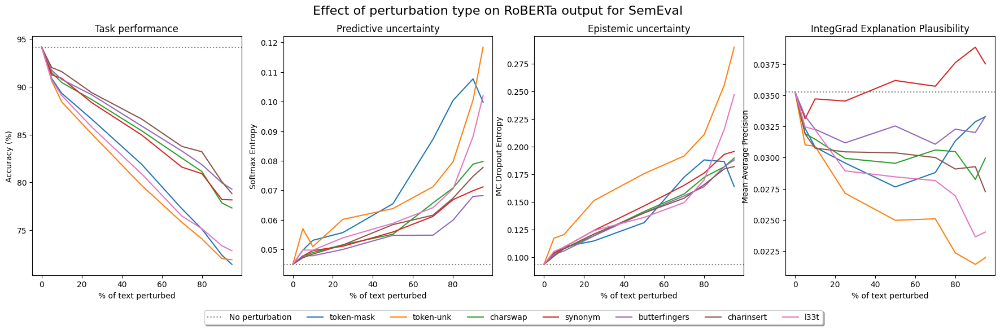

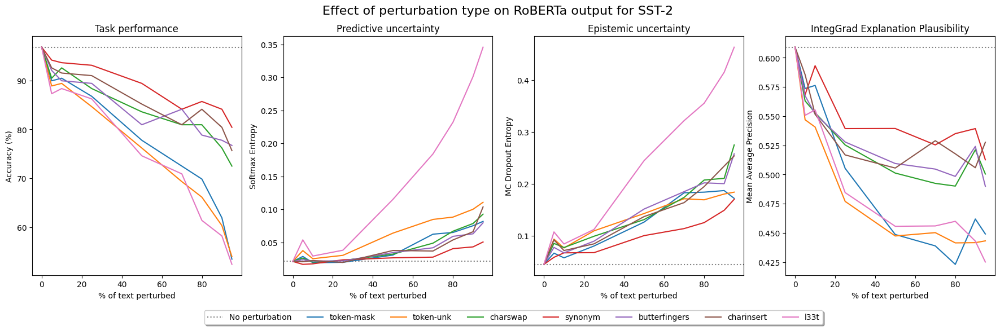

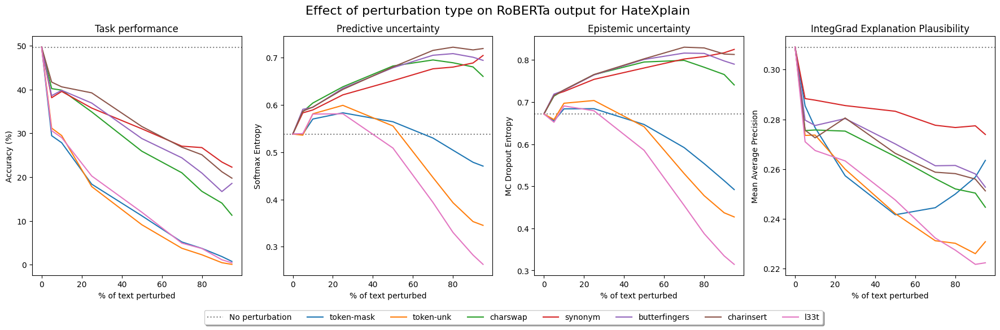

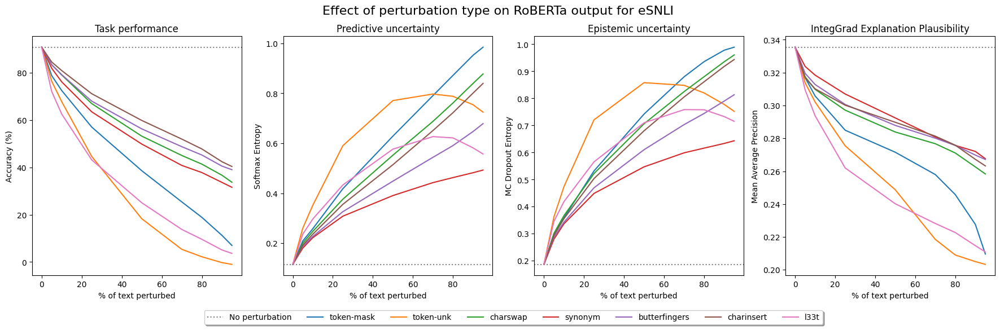

In [19]:

df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'Electra', 'gpt2-medium': 'GPT2-medium'}

data_to_text = {'SST-2': 'SST-2', 'SemEval': 'SemEval', 'hatexplain': 'HateXplain', 'esnli': 'eSNLI'}


for DOI in datasets:

    subset = df_output[(df_output['data'] == DOI) & (df_output['model'] == 'roberta')] #df_output[df_output['data'] == 'hatexplain']

    fig, ax = plt.subplots(1,4, figsize=(22, 5.5))
    fig.suptitle(f"Effect of perturbation type on RoBERTa output for {data_to_text[DOI]}", size= 16)

    pVa = subset.groupby(['perturbation','lvl'])['accuracy'].mean()

    grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
    # columns = [f'{k}_og_corr' for k in grads]
    columns = [f'{k}_all_anno_MAP' for k in grads]

    nks = ['token-mask', 'token-unk', 'charswap', 'synonym', 'butterfingers',  'charinsert', 'l33t'] #,'wordswap']



    ax[0].set_title("Task performance")
    zero_level = subset[subset['pattern'] == 'Clean']['accuracy'].mean()*100
    ax[0].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
    [ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVa[nk]*100]), label = nk) for nk in nks]


    # ax[0].set_ylim(0,1)
    ax[0].set_xlabel("% of text perturbed")
    ax[0].set_ylabel("Accuracy (%)")

    pVc1 = subset.groupby(['perturbation','lvl'])['softmax_entropy'].mean()
    ax[1].set_title("Predictive uncertainty")
    zero_level = subset[subset['pattern'] == 'Clean']['softmax_entropy'].mean()
    ax[1].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
    [ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk]]), label = nk) for nk in nks]

    ax[1].set_xlabel("% of text perturbed")
    # ax[1].set_ylim(.6)
    ax[1].set_ylabel("Softmax Entropy")

    pVc2 = subset.groupby(['perturbation','lvl'])['entropy'].mean()
    zero_level = subset[subset['pattern'] == 'Clean']['entropy'].mean()

    ax[2].set_title("Epistemic uncertainty")
    ax[2].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
    [ax[2].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc2[nk]]), label = nk) for nk in nks]


    # ax[2].legend()
    # ax[2].set_ylim(.6)
    ax[2].set_xlabel("% of text perturbed")
    ax[2].set_ylabel("MC Dropout Entropy")

    ax[3].set_title("IntegGrad Explanation Plausibility")

    pVa = subset.groupby(['perturbation', 'lvl'])['IntegGrad_all_anno_MAP'].mean()#.mean(axis=1)
    zero_level = subset[subset['pattern'] == 'Clean']['IntegGrad_all_anno_MAP'].mean()#.mean()
    ax[3].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')

    [ax[3].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVa[nk]]), label = nk) for nk in nks]


    ax[3].legend(loc='upper center', bbox_to_anchor=(-1.3, -0.13),ncol=8, fancybox=True, shadow=True)
    ax[3].set_xlabel("% of text perturbed")
    ax[3].set_ylabel("Mean Average Precision")



    plt.show()
    # plt.savefig("Figures/TypevsOutput_1.png")

In [20]:
# fig, ax = plt.subplots(1,4, figsize=(22, 5.5))
# fig.suptitle("Predictive uncertainty across tasks                                                            Epistemic uncertainty across tasks", size= 16)

# pVa = df_output.groupby(['perturbation','lvl'])['accuracy'].mean()

# grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
# # columns = [f'{k}_og_corr' for k in grads]
# columns = [f'{k}_all_anno_MAP' for k in grads]

# df_output_subset = df_output[df_output["data"] == "hatexplain"]
# ax[0].set_title("Hatespeech Detection")
# pVc1 = df_output_subset.groupby(['perturbation','lvl'])['softmax_entropy'].mean()
# ax[0].set_title("Predictive uncertainty")
# zero_level = df_output_subset[df_output_subset['pattern'] == 'Clean']['softmax_entropy'].mean()
# ax[0].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
# [ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk]]), label = nk) for nk in nks]

# ax[0].set_xlabel("% of text perturbed")
# # ax[0].set_ylim(.6)
# ax[0].set_ylabel("Softmax Entropy")

# df_output_subset = df_output[df_output["data"].isin(["SST-2", "SemEval"])]
# pVc1 = df_output_subset.groupby(['perturbation','lvl'])['softmax_entropy'].mean()
# ax[1].set_title("Sentiment Classification")
# zero_level = df_output_subset[df_output_subset['pattern'] == 'Clean']['softmax_entropy'].mean()
# ax[1].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
# [ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk]]), label = nk) for nk in nks]
# ax[1].set_xlabel("% of text perturbed")
# # ax[1].set_ylim(.6)
# ax[1].set_ylabel("Softmax Entropy")


# df_output_subset = df_output[df_output["data"] == "hatexplain"]
# pVc1 = df_output_subset.groupby(['perturbation','lvl'])['entropy'].mean()
# ax[2].set_title("Hatespeech Detection")
# zero_level = df_output_subset[df_output_subset['pattern'] == 'Clean']['entropy'].mean()
# ax[2].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
# [ax[2].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk]]), label = nk) for nk in nks]

# ax[2].set_xlabel("% of text perturbed")
# # ax[2].set_ylim(.6)
# ax[2].set_ylabel("MC Entropy")

# df_output_subset = df_output[df_output["data"].isin(["SST-2", "SemEval"])]
# pVc1 = df_output_subset.groupby(['perturbation','lvl'])['entropy'].mean()
# ax[3].set_title("Sentiment Classification")
# zero_level = df_output_subset[df_output_subset['pattern'] == 'Clean']['entropy'].mean()
# ax[3].axhline(zero_level, label = "No perturbation", color='grey', linestyle=':')
# [ax[3].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk]]), label = nk) for nk in nks]
# ax[3].set_xlabel("% of text perturbed")
# # ax[3].set_ylim(.6)
# ax[3].set_ylabel("MC Entropy")
# ax[3].legend(loc='upper center', bbox_to_anchor=(-1.3, -0.13),ncol=8, fancybox=True, shadow=True)


# plt.show()
# # plt.savefig("Figures/TypevsOutput_1.png")

/tmp/ipykernel_10692/475084686.py:43: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


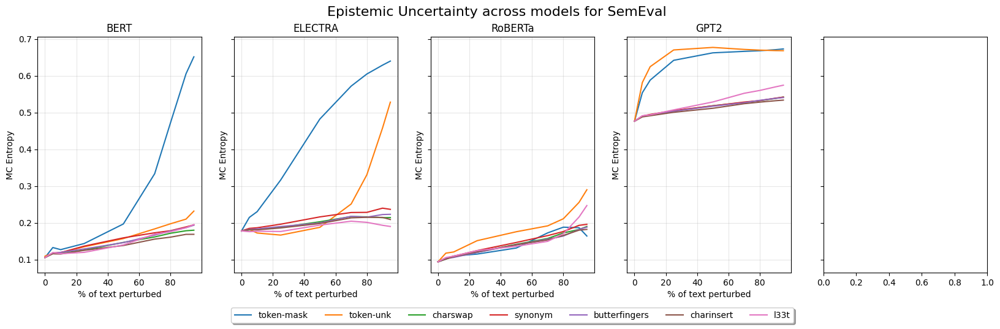

/tmp/ipykernel_10692/475084686.py:43: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


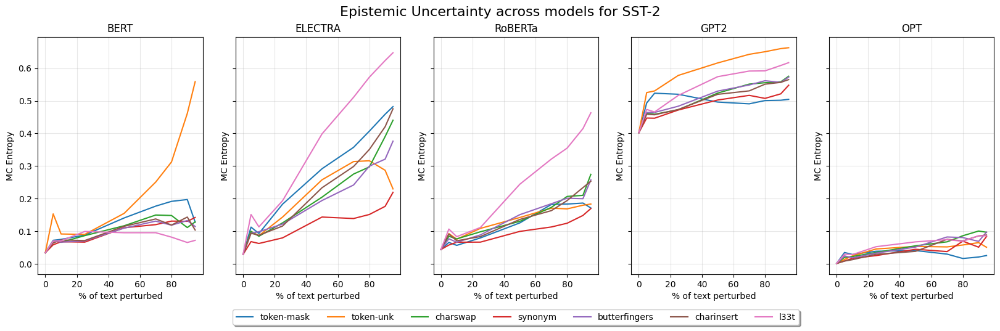

/tmp/ipykernel_10692/475084686.py:43: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


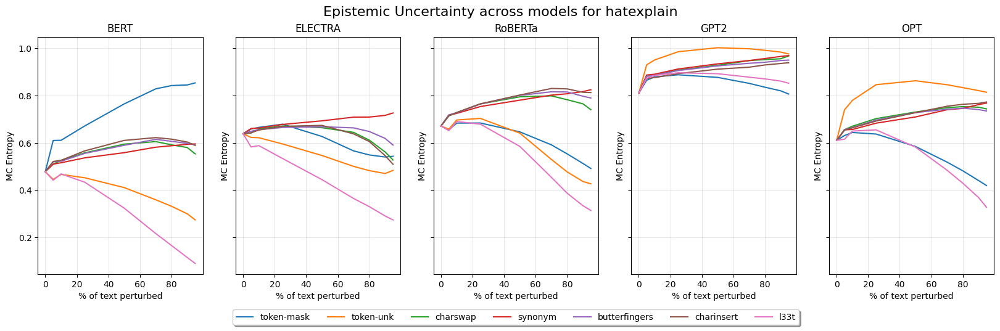

/tmp/ipykernel_10692/475084686.py:43: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


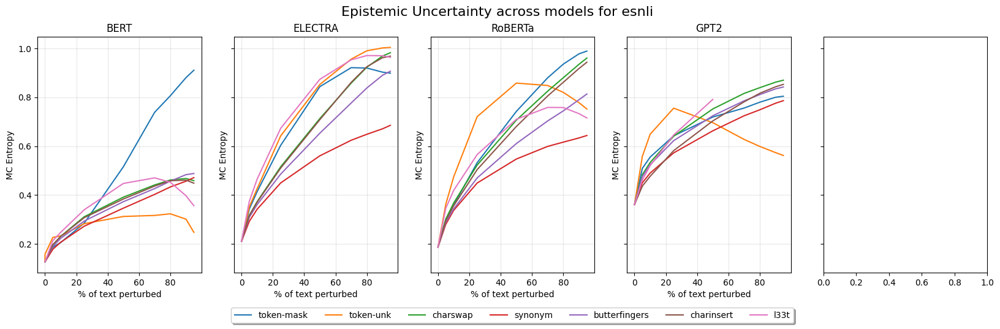

In [22]:
from matplotlib.lines import Line2D

models = ['bert', 'electra', 'roberta', 'gpt2-medium', 'opt']
df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'ELECTRA', 'gpt2-medium': 'GPT2', 'opt': 'OPT'}


for DOI in datasets:

    subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']

    fig, ax = plt.subplots(1,5, figsize=(20, 5), sharey=True)
    fig.suptitle(f"Epistemic Uncertainty across models for {DOI}", size= 16)

    # model_style = { 'bert' : "-", 'electra' : "--", "roberta" : ":", "gpt2-medium" : "-."}
    nk_color = {'token-mask': 'C0','token-unk':'C1',  'charswap': 'C2', 'synonym': 'C3',
        'butterfingers': 'C4','charinsert': 'C5', 'l33t': 'C6'} #'wordswap': 'C5', 'charinsert': 'C6', 'l33t': 'C7'}


    grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
    # columns = [f'{k}_og_corr' for k in grads]
    columns = [f'{k}_all_anno_MAP' for k in grads]


    pVc1 = subset.groupby(['perturbation','model', 'lvl'])['entropy'].mean()
    # ax[1].axhline(subset[subset['pattern'] == 'Clean']['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
    for i,m in enumerate(models):
        if (m == 'opt') & (DOI not in ['SST-2','hatexplain']): ################### REMOVE WHEN I HAVE MORE DATA
            continue
        ax[i].set_title(df_to_text[m])
        zero_level = subset[(subset['pattern'] == 'Clean') & (subset['model'] == m)]['entropy'].mean()
        for nk in nk_color.keys():
            ax[i].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk][m]]), label = "Replacement with MASK", color=nk_color[nk])
            ax[i].set_xlabel("% of text perturbed")
            ax[i].grid(alpha=0.3)
            # ax[i].set_ylim(0,1.0)
            ax[i].set_ylabel("MC Entropy")
            # ax[i].legend(fancybox=True)
    
    ax[3].legend([Line2D([0],[0], color=nk_color[k]) for k in nk_color.keys()], [k for k in nk_color.keys()], ncol=8,
                        loc='upper center', bbox_to_anchor=(-0.7, -0.13), fancybox=True, shadow=True)


    plt.tight_layout()
    plt.show()
    
    # plt.savefig("Figures/TypevsOutput_1.png")

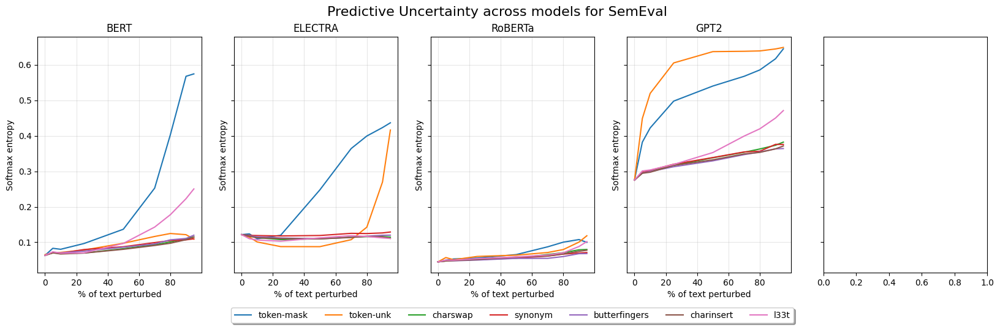

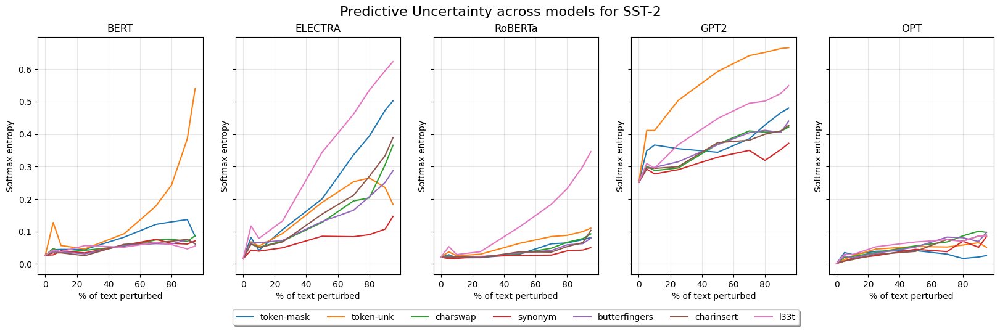

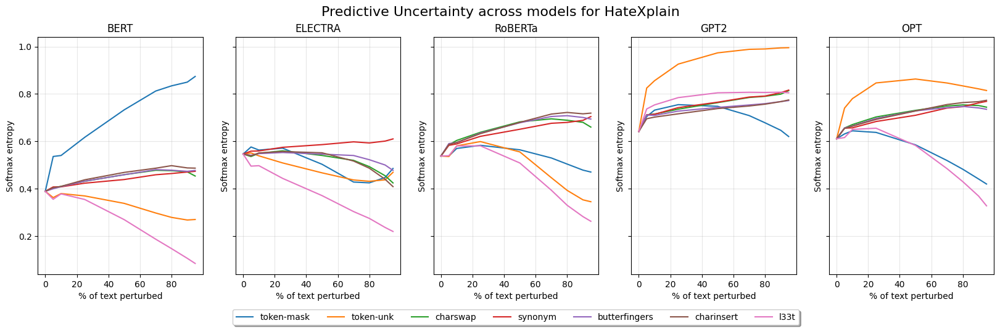

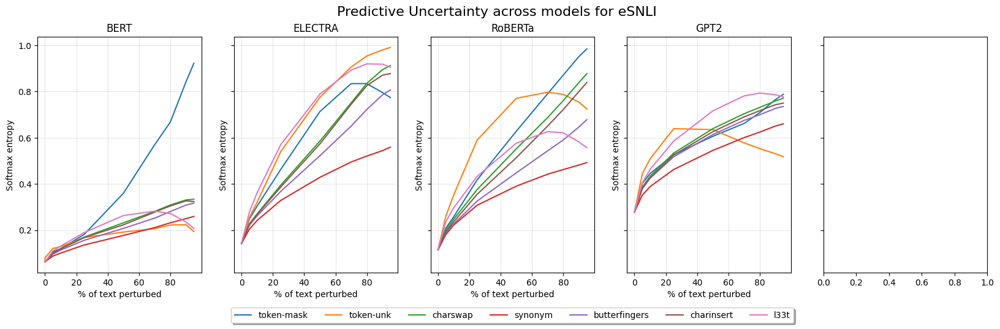

In [23]:
from matplotlib.lines import Line2D

models = ['bert', 'electra', 'roberta', 'gpt2-medium', 'opt']
df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'ELECTRA', 'gpt2-medium': 'GPT2', 'opt': 'OPT'}


for DOI in datasets:

    subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']

    fig, ax = plt.subplots(1,5, figsize=(20,5), sharey=True)
    fig.suptitle(f"Predictive Uncertainty across models for {data_to_text[DOI]}", size= 16)

    # model_style = { 'bert' : "-", 'electra' : "--", "roberta" : ":", "gpt2-medium" : "-."}
    nk_color = {'token-mask': 'C0','token-unk':'C1',  'charswap': 'C2', 'synonym': 'C3',
        'butterfingers': 'C4','charinsert': 'C5', 'l33t': 'C6'} #'wordswap': 'C5', 'charinsert': 'C6', 'l33t': 'C7'}


    grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
    # columns = [f'{k}_og_corr' for k in grads]
    columns = [f'{k}_all_anno_MAP' for k in grads]


    pVc1 = subset.groupby(['perturbation','model', 'lvl'])['softmax_entropy'].mean()
    # ax[1].axhline(subset[subset['pattern'] == 'Clean']['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
    for i,m in enumerate(models):
        if (m == 'opt') & (DOI not in ['SST-2','hatexplain']): ################### REMOVE WHEN I HAVE MORE DATA
            continue
        ax[i].set_title(df_to_text[m])
        zero_level = subset[(subset['pattern'] == 'Clean') & (subset['model'] == m)]['softmax_entropy'].mean()
        for nk in nk_color.keys():
            ax[i].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk][m]]), label = "Replacement with MASK", color=nk_color[nk])
            ax[i].set_xlabel("% of text perturbed")
            ax[i].grid(alpha=0.3)
            # ax[i].set_ylim(0,1.0)
            ax[i].set_ylabel("Softmax entropy")
            # ax[i].legend(fancybox=True)
    
    ax[3].legend([Line2D([0],[0], color=nk_color[k]) for k in nk_color.keys()], [k for k in nk_color.keys()], ncol=8,
                        loc='upper center', bbox_to_anchor=(-0.7, -0.13), fancybox=True, shadow=True)


    plt.show()
    # plt.savefig("Figures/TypevsOutput_1.png")

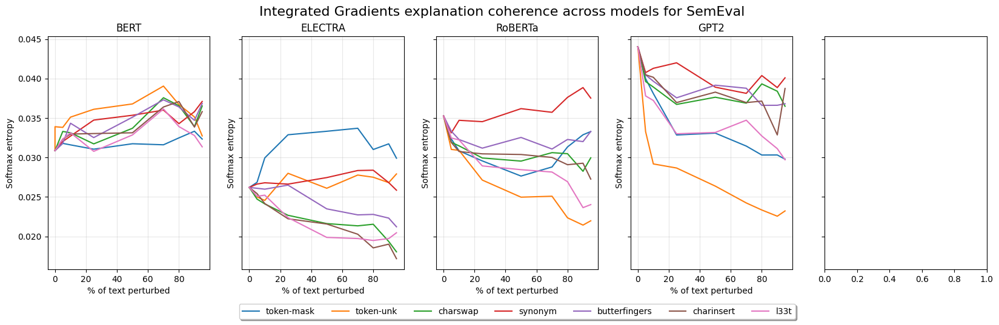

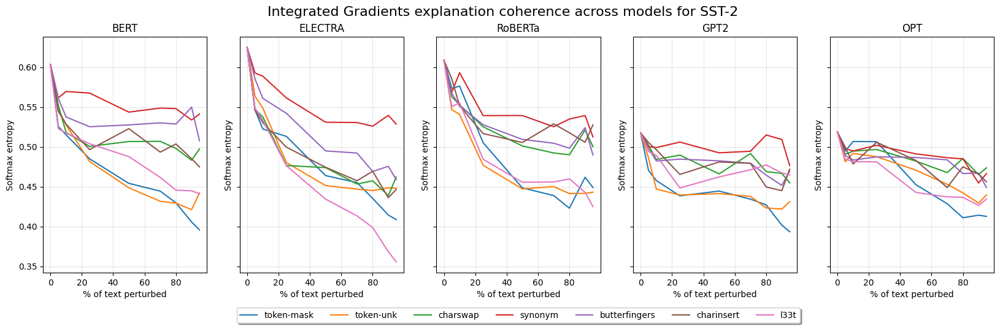

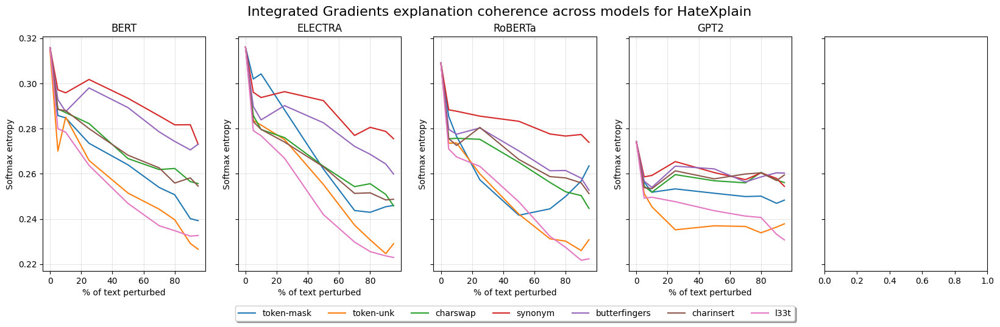

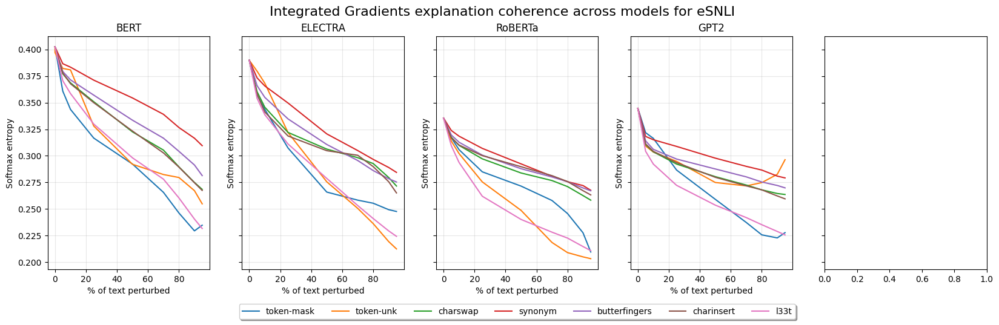

In [72]:
from matplotlib.lines import Line2D
models = ['bert', 'electra', 'roberta', 'gpt2-medium', 'opt']
df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'ELECTRA', 'gpt2-medium': 'GPT2', 'opt': 'OPT'}


for DOI in datasets:

    subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']

    fig, ax = plt.subplots(1,5, figsize=(20,5), sharey=True)
    fig.suptitle(f"Integrated Gradients explanation plausibility across models for {data_to_text[DOI]}", size= 16)
    
    # model_style = { 'bert' : "-", 'electra' : "--", "roberta" : ":", "gpt2-medium" : "-."}
    nk_color = {'token-mask': 'C0','token-unk':'C1',  'charswap': 'C2', 'synonym': 'C3',
        'butterfingers': 'C4','charinsert': 'C5', 'l33t': 'C6'} #'wordswap': 'C5', 'charinsert': 'C6', 'l33t': 'C7'}


    grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
    # columns = [f'{k}_og_corr' for k in grads]
    columns = [f'{k}_all_anno_MAP' for k in grads]


    pVc1 = subset.groupby(['perturbation','model', 'lvl'])['IntegGrad_all_anno_MAP'].mean()
    # ax[1].axhline(subset[subset['pattern'] == 'Clean']['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
    for i,m in enumerate(models):
        if (m == 'opt') & (DOI != 'SST-2'): ################### REMOVE WHEN I HAVE MORE DATA
            continue
        ax[i].set_title(df_to_text[m])
        zero_level = subset[(subset['pattern'] == 'Clean') & (subset['model'] == m)]['IntegGrad_all_anno_MAP'].mean()
        for nk in nk_color.keys():
            ax[i].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk][m]]), label = "Replacement with MASK", color=nk_color[nk])
            ax[i].set_xlabel("% of text perturbed")
            ax[i].grid(alpha=0.3)
            # ax[i].set_ylim(0,1.0)
            ax[i].set_ylabel("Mean Average Precision")
            # ax[i].legend(fancybox=True)
    
    ax[3].legend([Line2D([0],[0], color=nk_color[k]) for k in nk_color.keys()], [k for k in nk_color.keys()], ncol=8,
                        loc='upper center', bbox_to_anchor=(-0.7, -0.13), fancybox=True, shadow=True)

    plt.show()
    # plt.savefig("Figures/TypevsOutput_1.png")

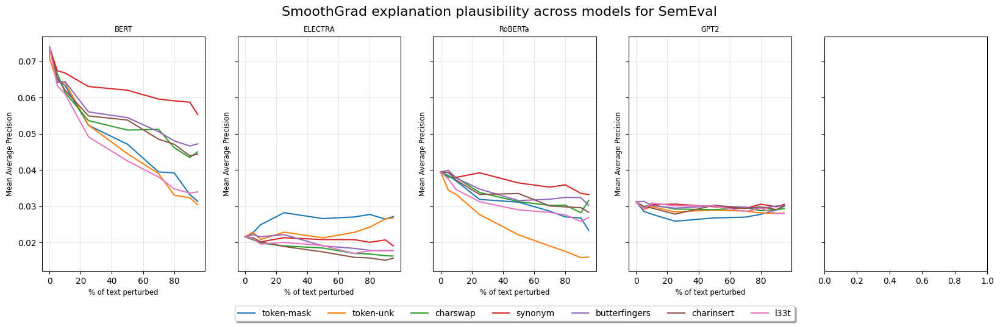

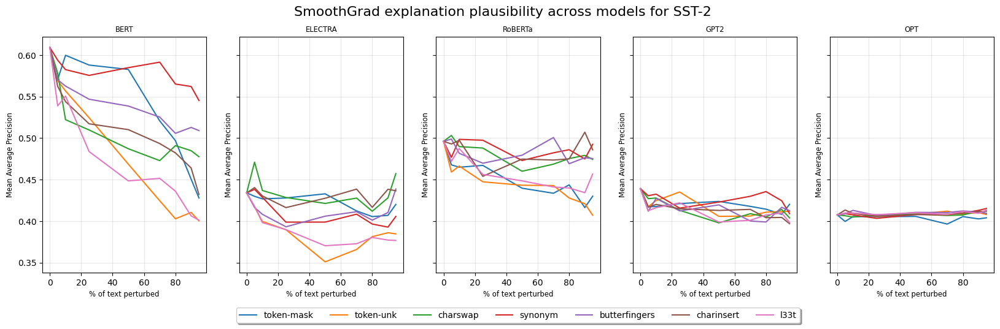

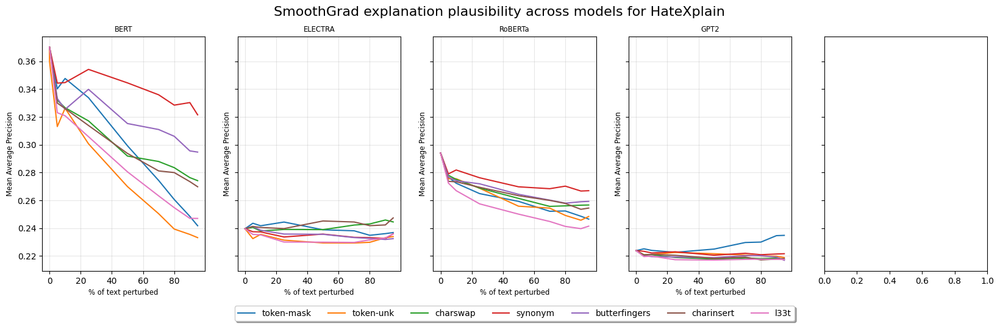

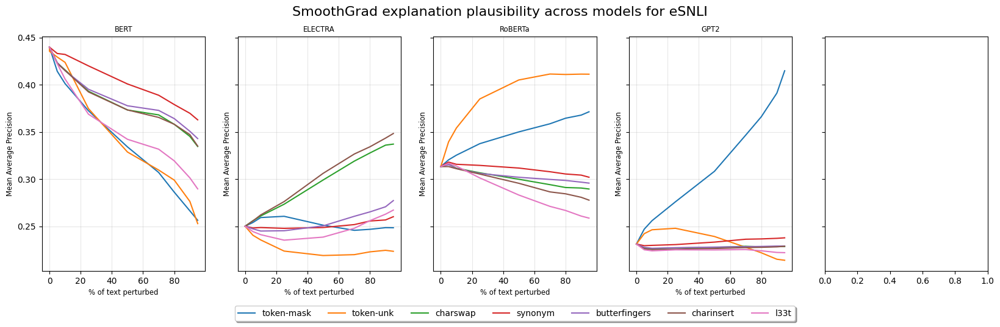

In [128]:
from matplotlib.lines import Line2D
models = ['bert', 'electra', 'roberta', 'gpt2-medium', 'opt']
df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'ELECTRA', 'gpt2-medium': 'GPT2', 'opt': 'OPT'}


for DOI in datasets:

    subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']

    fig, ax = plt.subplots(1,5, figsize=(20,5), sharey=True)
    fig.suptitle(f"SmoothGrad explanation plausibility across models for {data_to_text[DOI]}", size= 16)
    
    # model_style = { 'bert' : "-", 'electra' : "--", "roberta" : ":", "gpt2-medium" : "-."}
    nk_color = {'token-mask': 'C0','token-unk':'C1',  'charswap': 'C2', 'synonym': 'C3',
        'butterfingers': 'C4','charinsert': 'C5', 'l33t': 'C6'} #'wordswap': 'C5', 'charinsert': 'C6', 'l33t': 'C7'}


    grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
    # columns = [f'{k}_og_corr' for k in grads]
    columns = [f'{k}_all_anno_MAP' for k in grads]


    pVc1 = subset.groupby(['perturbation','model', 'lvl'])['SmoothGrad_all_anno_MAP'].mean()
    # ax[1].axhline(subset[subset['pattern'] == 'Clean']['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
    for i,m in enumerate(models):
        if (m == 'opt') & (DOI != 'SST-2'): ################### REMOVE WHEN I HAVE MORE DATA
            continue
        ax[i].set_title(df_to_text[m])
        zero_level = subset[(subset['pattern'] == 'Clean') & (subset['model'] == m)]['SmoothGrad_all_anno_MAP'].mean()
        for nk in nk_color.keys():
            ax[i].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk][m]]), label = "Replacement with MASK", color=nk_color[nk])
            ax[i].set_xlabel("% of text perturbed")
            ax[i].grid(alpha=0.3)
            # ax[i].set_ylim(0,1.0)
            ax[i].set_ylabel("Mean Average Precision")
            # ax[i].legend(fancybox=True)
    
    ax[3].legend([Line2D([0],[0], color=nk_color[k]) for k in nk_color.keys()], [k for k in nk_color.keys()], ncol=8,
                        loc='upper center', bbox_to_anchor=(-0.7, -0.13), fancybox=True, shadow=True)

    plt.show()
    # plt.savefig("Figures/TypevsOutput_1.png")

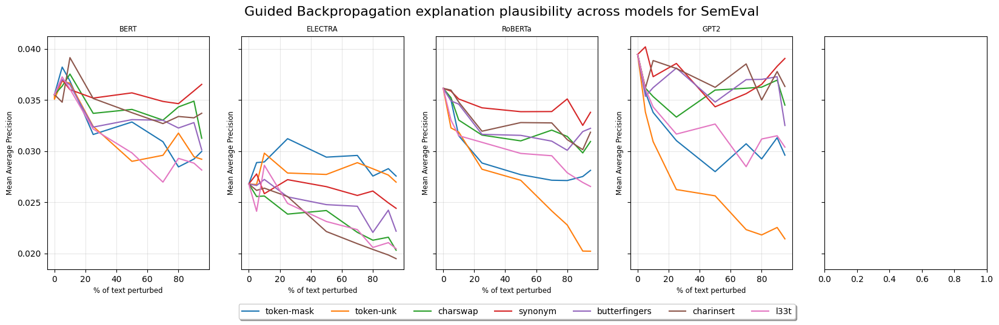

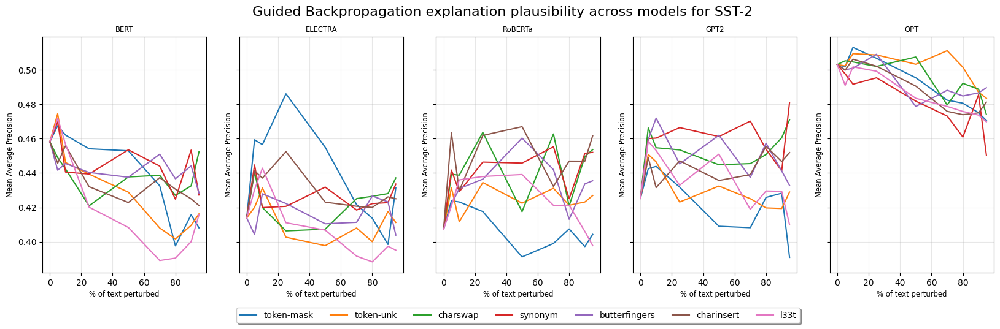

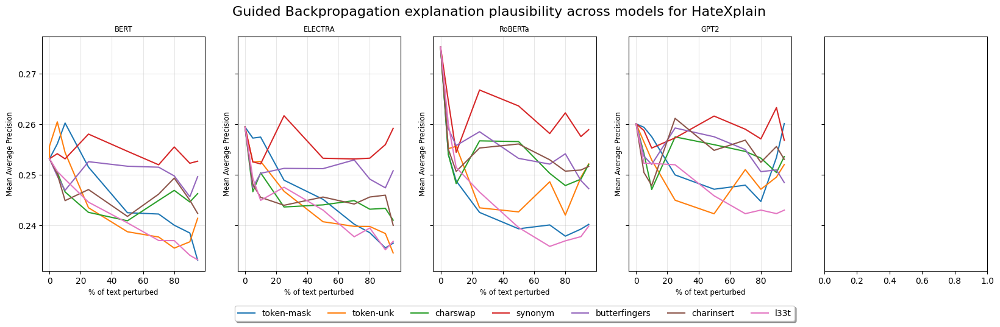

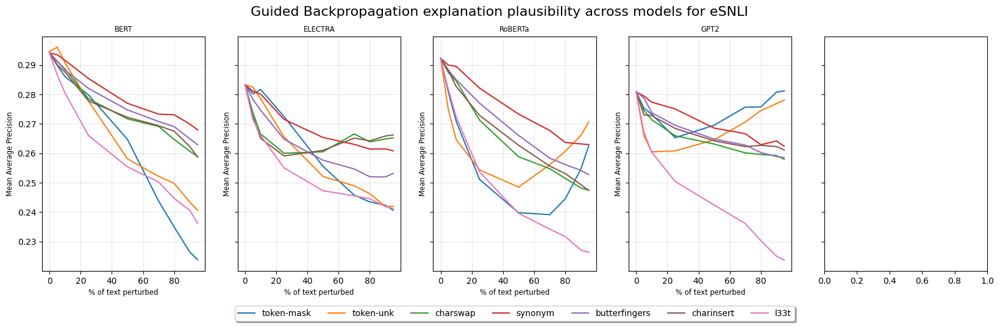

In [129]:
from matplotlib.lines import Line2D
models = ['bert', 'electra', 'roberta', 'gpt2-medium', 'opt']
df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'ELECTRA', 'gpt2-medium': 'GPT2', 'opt': 'OPT'}


for DOI in datasets:

    subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']

    fig, ax = plt.subplots(1,5, figsize=(20,5), sharey=True)
    fig.suptitle(f"Guided Backpropagation explanation plausibility across models for {data_to_text[DOI]}", size= 16)
    
    # model_style = { 'bert' : "-", 'electra' : "--", "roberta" : ":", "gpt2-medium" : "-."}
    nk_color = {'token-mask': 'C0','token-unk':'C1',  'charswap': 'C2', 'synonym': 'C3',
        'butterfingers': 'C4','charinsert': 'C5', 'l33t': 'C6'} #'wordswap': 'C5', 'charinsert': 'C6', 'l33t': 'C7'}


    grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
    # columns = [f'{k}_og_corr' for k in grads]
    columns = [f'{k}_all_anno_MAP' for k in grads]


    pVc1 = subset.groupby(['perturbation','model', 'lvl'])['GuidedBP_all_anno_MAP'].mean()
    # ax[1].axhline(subset[subset['pattern'] == 'Clean']['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
    for i,m in enumerate(models):
        if (m == 'opt') & (DOI != 'SST-2'): ################### REMOVE WHEN I HAVE MORE DATA
            continue
        ax[i].set_title(df_to_text[m])
        zero_level = subset[(subset['pattern'] == 'Clean') & (subset['model'] == m)]['GuidedBP_all_anno_MAP'].mean()
        for nk in nk_color.keys():
            ax[i].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk][m]]), label = "Replacement with MASK", color=nk_color[nk])
            ax[i].set_xlabel("% of text perturbed")
            ax[i].grid(alpha=0.3)
            # ax[i].set_ylim(0,1.0)
            ax[i].set_ylabel("Mean Average Precision")
            # ax[i].legend(fancybox=True)
    
    ax[3].legend([Line2D([0],[0], color=nk_color[k]) for k in nk_color.keys()], [k for k in nk_color.keys()], ncol=8,
                        loc='upper center', bbox_to_anchor=(-0.7, -0.13), fancybox=True, shadow=True)

    plt.show()
    # plt.savefig("Figures/TypevsOutput_1.png")

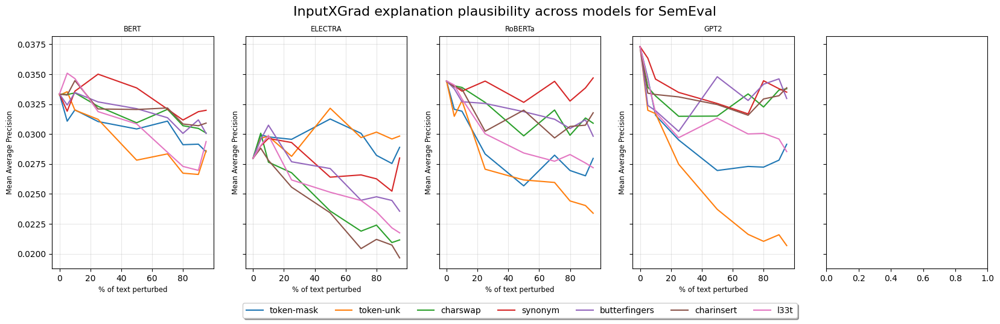

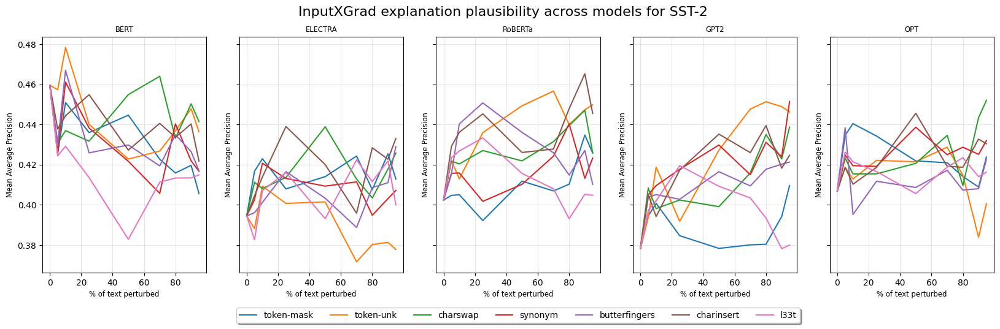

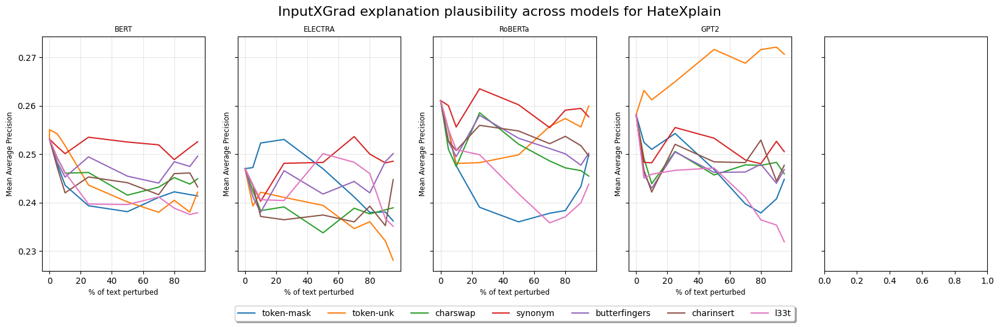

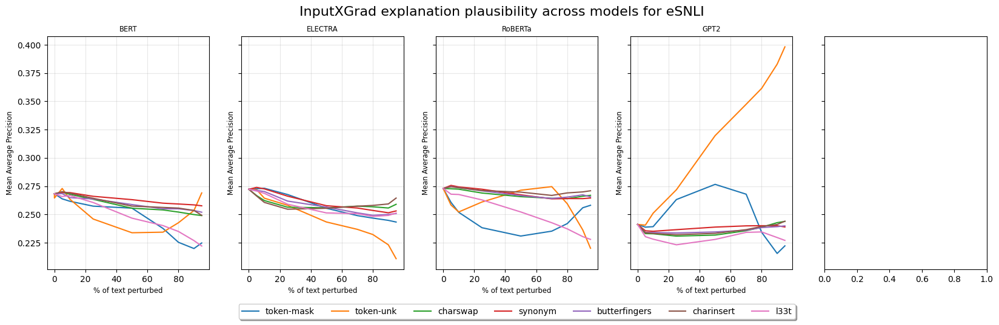

In [126]:
from matplotlib.lines import Line2D
models = ['bert', 'electra', 'roberta', 'gpt2-medium', 'opt']
df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'ELECTRA', 'gpt2-medium': 'GPT2', 'opt': 'OPT'}


for DOI in datasets:

    subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']

    fig, ax = plt.subplots(1,5, figsize=(20,5), sharey=True)
    fig.suptitle(f"InputXGrad explanation plausibility across models for {data_to_text[DOI]}", size= 16)
    
    # model_style = { 'bert' : "-", 'electra' : "--", "roberta" : ":", "gpt2-medium" : "-."}
    nk_color = {'token-mask': 'C0','token-unk':'C1',  'charswap': 'C2', 'synonym': 'C3',
        'butterfingers': 'C4','charinsert': 'C5', 'l33t': 'C6'} #'wordswap': 'C5', 'charinsert': 'C6', 'l33t': 'C7'}


    grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
    # columns = [f'{k}_og_corr' for k in grads]
    columns = [f'{k}_all_anno_MAP' for k in grads]


    pVc1 = subset.groupby(['perturbation','model', 'lvl'])['InputXGrad_all_anno_MAP'].mean()
    # ax[1].axhline(subset[subset['pattern'] == 'Clean']['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
    for i,m in enumerate(models):
        if (m == 'opt') & (DOI != 'SST-2'): ################### REMOVE WHEN I HAVE MORE DATA
            continue
        ax[i].set_title(df_to_text[m])
        zero_level = subset[(subset['pattern'] == 'Clean') & (subset['model'] == m)]['InputXGrad_all_anno_MAP'].mean()
        for nk in nk_color.keys():
            ax[i].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk][m]]), label = "Replacement with MASK", color=nk_color[nk])
            ax[i].set_xlabel("% of text perturbed")
            ax[i].grid(alpha=0.3)
            # ax[i].set_ylim(0,1.0)
            ax[i].set_ylabel("Mean Average Precision")
            # ax[i].legend(fancybox=True)
    
    ax[3].legend([Line2D([0],[0], color=nk_color[k]) for k in nk_color.keys()], [k for k in nk_color.keys()], ncol=8,
                        loc='upper center', bbox_to_anchor=(-0.7, -0.13), fancybox=True, shadow=True)

    plt.show()
    # plt.savefig("Figures/TypevsOutput_1.png")

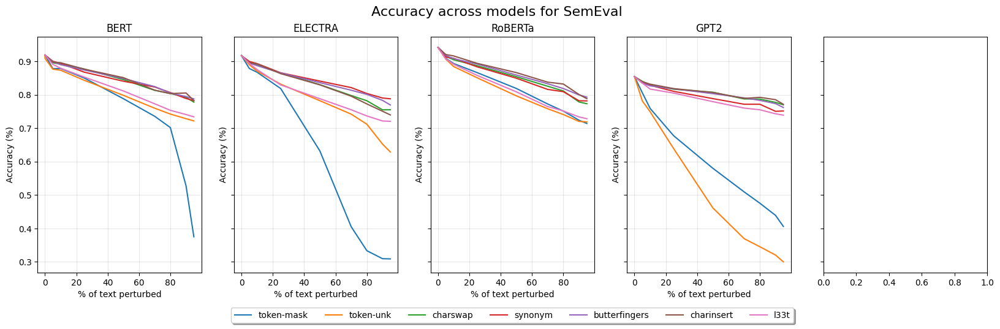

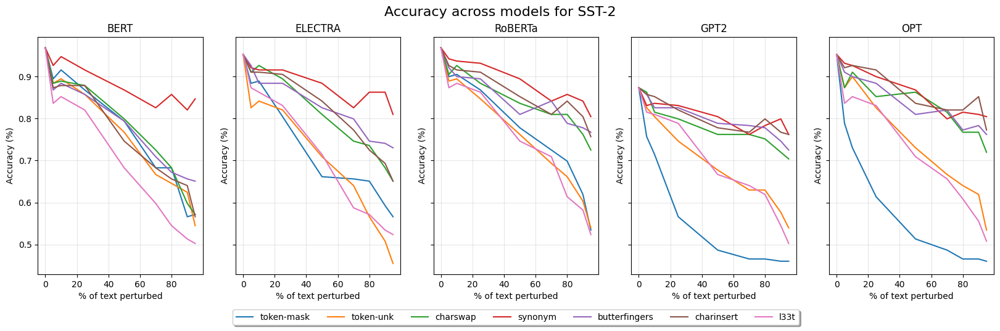

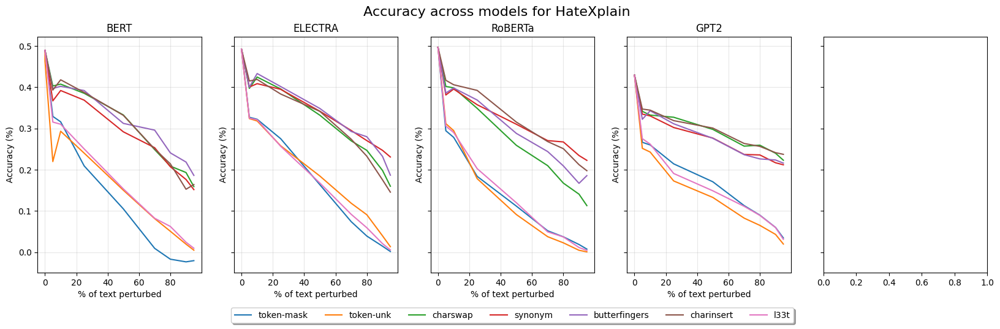

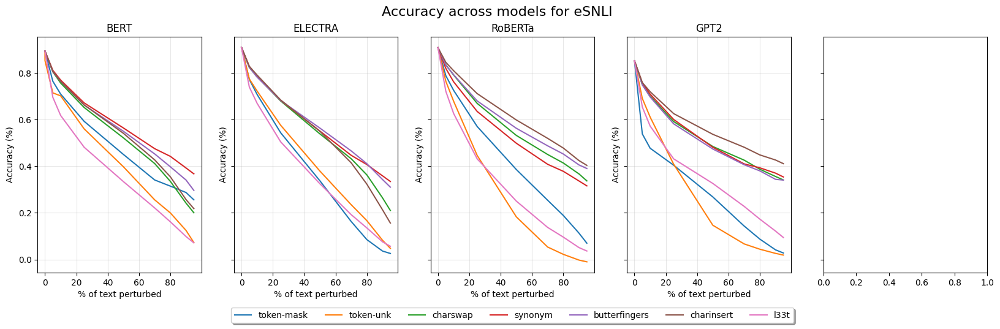

In [73]:
from matplotlib.lines import Line2D
models = ['bert', 'electra', 'roberta', 'gpt2-medium', 'opt']
df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'ELECTRA', 'gpt2-medium': 'GPT2', 'opt': 'OPT'}


for DOI in datasets:

    subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']

    fig, ax = plt.subplots(1,5, figsize=(20,5), sharey=True)
    fig.suptitle(f"Accuracy across models for {data_to_text[DOI]}", size= 16)
    
    # model_style = { 'bert' : "-", 'electra' : "--", "roberta" : ":", "gpt2-medium" : "-."}
    nk_color = {'token-mask': 'C0','token-unk':'C1',  'charswap': 'C2', 'synonym': 'C3',
        'butterfingers': 'C4','charinsert': 'C5', 'l33t': 'C6'} #'wordswap': 'C5', 'charinsert': 'C6', 'l33t': 'C7'}


    grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
    # columns = [f'{k}_og_corr' for k in grads]
    columns = [f'{k}_all_anno_MAP' for k in grads]


    pVc1 = subset.groupby(['perturbation','model', 'lvl'])['accuracy'].mean()
    # ax[1].axhline(subset[subset['pattern'] == 'Clean']['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
    for i,m in enumerate(models):
        if (m == 'opt') & (DOI != 'SST-2'): ################### REMOVE WHEN I HAVE MORE DATA
            continue
        ax[i].set_title(df_to_text[m])
        zero_level = subset[(subset['pattern'] == 'Clean') & (subset['model'] == m)]['accuracy'].mean()
        for nk in nk_color.keys():
            ax[i].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk][m]]), label = "Replacement with MASK", color=nk_color[nk])
            ax[i].set_xlabel("% of text perturbed")
            ax[i].grid(alpha=0.3)
            # ax[i].set_ylim(0,1.0)
            ax[i].set_ylabel("Accuracy (%)")
            # ax[i].legend(fancybox=True)
    
    ax[3].legend([Line2D([0],[0], color=nk_color[k]) for k in nk_color.keys()], [k for k in nk_color.keys()], ncol=8,
                        loc='upper center', bbox_to_anchor=(-0.7, -0.13), fancybox=True, shadow=True)


    plt.show()
    # plt.savefig("Figures/TypevsOutput_1.png")

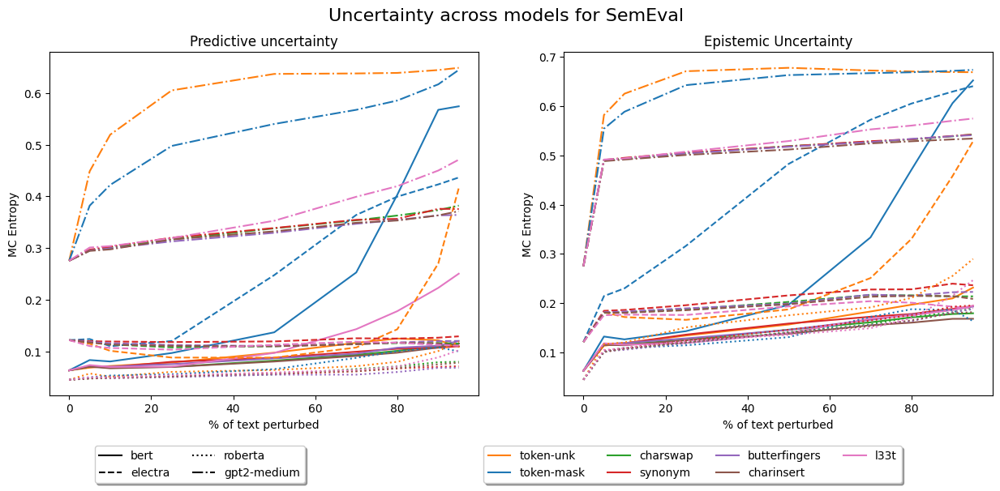

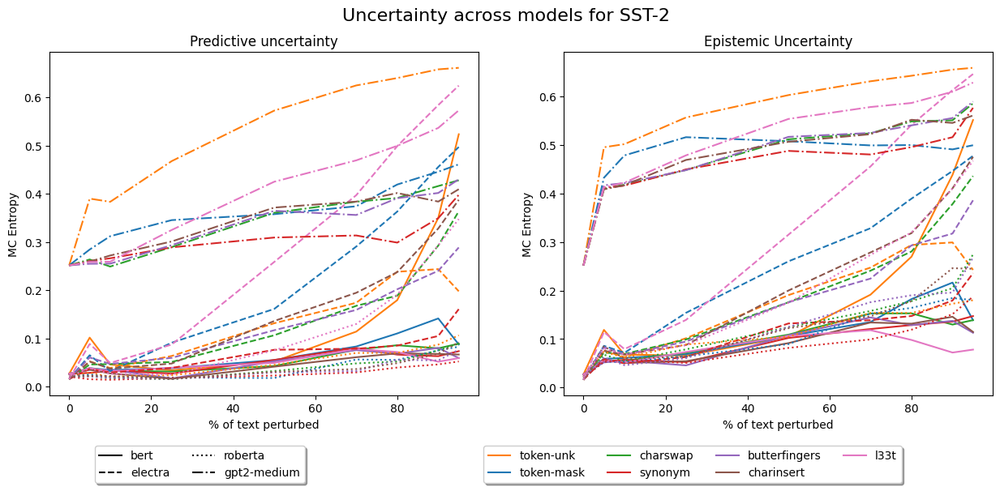

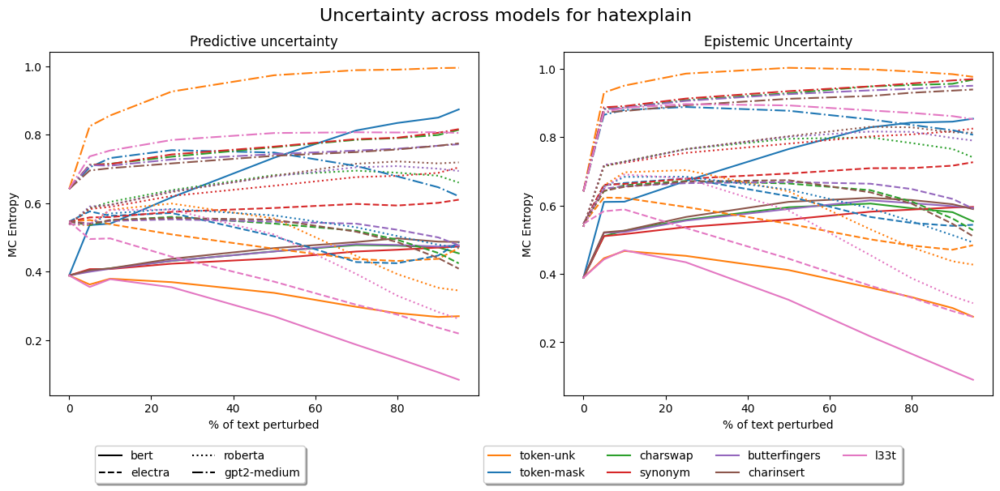

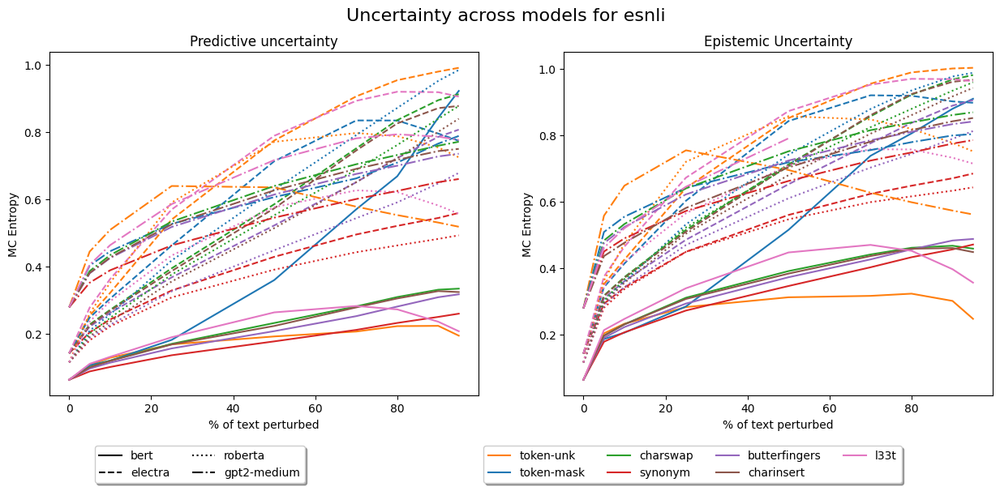

In [14]:
from matplotlib.lines import Line2D

for DOI in datasets:

    subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']

    fig, ax = plt.subplots(1,2, figsize=(15, 5.5))
    fig.suptitle(f"Uncertainty across models for {DOI}", size= 16)

    model_style = { 'bert' : "-", 'electra' : "--", "roberta" : ":", "gpt2-medium" : "-."}
    nk_color = {'token-unk':'C1', 'token-mask': 'C0', 'charswap': 'C2', 'synonym': 'C3',
        'butterfingers': 'C4','charinsert': 'C5', 'l33t': 'C6'} #'wordswap': 'C5', 'charinsert': 'C6', 'l33t': 'C7'}

    pVa = subset.groupby(['perturbation','lvl'])['accuracy'].mean()

    grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
    # columns = [f'{k}_og_corr' for k in grads]
    columns = [f'{k}_all_anno_MAP' for k in grads]

    pVc1 = subset.groupby(['perturbation','model', 'lvl'])['softmax_entropy'].mean()
    ax[0].set_title("Predictive uncertainty")
    # ax[0].axhline(subset[subset['pattern'] == 'Clean']['softmax_entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
    models =[ 'bert', 'electra', 'roberta', 'gpt2-medium']
    for m in models:
        zero_level = subset[(subset['pattern'] == 'Clean') & (subset['model'] == m)]['softmax_entropy'].mean()
        for nk in nk_color.keys():
            ax[0].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk][m]]), linestyle=model_style[m], color=nk_color[nk])

    ax[0].set_xlabel("% of text perturbed")
    # ax[0].set_ylim(.6)
    ax[0].set_ylabel("MC Entropy")
    ax[0].legend([Line2D([0],[0],linestyle=model_style[k], color='black') for k in model_style.keys()], [k for k in model_style.keys()], ncol=2,
                loc='upper center', bbox_to_anchor=(0.35, -0.13), fancybox=True, shadow=True)

    pVc1 = subset.groupby(['perturbation','model', 'lvl'])['entropy'].mean()
    ax[1].set_title("Epistemic Uncertainty")
    # ax[1].axhline(subset[subset['pattern'] == 'Clean']['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
    for m in models:
        zero_level = subset[(subset['pattern'] == 'Clean') & (subset['model'] == m)]['softmax_entropy'].mean()
        for nk in nk_color.keys():
            ax[1].plot(pd.concat([pd.Series([zero_level], index=[0.0]),pVc1[nk][m]]), label = "Replacement with MASK", linestyle=model_style[m], color=nk_color[nk])
    ax[1].set_xlabel("% of text perturbed")
    # ax[1].set_ylim(.6)
    ax[1].set_ylabel("MC Entropy")
    # ax[1].legend(fancybox=True)
    ax[1].legend([Line2D([0],[0], color=nk_color[k]) for k in nk_color.keys()], [k for k in nk_color.keys()], ncol=4,
                loc='upper center', bbox_to_anchor=(0.3, -0.13), fancybox=True, shadow=True)


    plt.show()
    # plt.savefig("Figures/TypevsOutput_1.png")

In [32]:
## Rank correlation for MODELS, DATASETS, etc?

df_output[df_output['data'] == 'SST-2'].groupby(['perturbation','lvl'])['accuracy'].mean()

from scipy.stats import spearmanr

#calculate Spearman Rank correlation and corresponding p-value
print(spearmanr(df_output[df_output['data'] == 'SST-2'].groupby(['perturbation','lvl'])['accuracy'].mean(), df_output[df_output['data'] == 'SemEval'].groupby(['perturbation','lvl'])['accuracy'].mean())
)
print(spearmanr(df_output[df_output['data'] == 'SST-2'].groupby(['perturbation','lvl'])['softmax_entropy'].mean(), df_output[df_output['data'] == 'SemEval'].groupby(['perturbation','lvl'])['softmax_entropy'].mean())
)
print(spearmanr(df_output[df_output['data'] == 'SST-2'].groupby(['perturbation','lvl'])['entropy'].mean(), df_output[df_output['data'] == 'SemEval'].groupby(['perturbation','lvl'])['entropy'].mean()))

#calculate Spearman Rank correlation and corresponding p-value
print(spearmanr(df_output[df_output['data'] == 'SST-2'].groupby(['perturbation','lvl'])['accuracy'].mean(), df_output[df_output['data'] == 'hatexplain'].groupby(['perturbation','lvl'])['accuracy'].mean())
)
print(spearmanr(df_output[df_output['data'] == 'SST-2'].groupby(['perturbation','lvl'])['softmax_entropy'].mean(), df_output[df_output['data'] == 'hatexplain'].groupby(['perturbation','lvl'])['softmax_entropy'].mean())
)
print(spearmanr(df_output[df_output['data'] == 'SST-2'].groupby(['perturbation','lvl'])['entropy'].mean(), df_output[df_output['data'] == 'hatexplain'].groupby(['perturbation','lvl'])['entropy'].mean()))

#calculate Spearman Rank correlation and corresponding p-value
print(spearmanr(df_output[df_output['data'] == 'hatexplain'].groupby(['perturbation','lvl'])['accuracy'].mean(), df_output[df_output['data'] == 'SemEval'].groupby(['perturbation','lvl'])['accuracy'].mean())
)
print(spearmanr(df_output[df_output['data'] == 'hatexplain'].groupby(['perturbation','lvl'])['softmax_entropy'].mean(), df_output[df_output['data'] == 'SemEval'].groupby(['perturbation','lvl'])['softmax_entropy'].mean())
)
print(spearmanr(df_output[df_output['data'] == 'hatexplain'].groupby(['perturbation','lvl'])['entropy'].mean(), df_output[df_output['data'] == 'SemEval'].groupby(['perturbation','lvl'])['entropy'].mean()))

SignificanceResult(statistic=0.9117051128207861, pvalue=1.2325974788326722e-25)
SignificanceResult(statistic=0.791620879120879, pvalue=6.864832923656683e-15)
SignificanceResult(statistic=0.6948260073260073, pvalue=1.9009545158959665e-10)
SignificanceResult(statistic=0.644221854412277, pvalue=9.272253681833684e-09)
SignificanceResult(statistic=-0.2749542124542125, pvalue=0.027888534224509647)
SignificanceResult(statistic=-0.2770604395604395, pvalue=0.026665242892838486)
SignificanceResult(statistic=0.7222985347985348, pvalue=1.6200998746022366e-11)
SignificanceResult(statistic=-0.1229395604395604, pvalue=0.333139324754682)
SignificanceResult(statistic=-0.06552197802197801, pvalue=0.6069737150168706)


In [14]:
datasets = ['hatexplain', 'SemEval', 'SST-2']
from scipy.stats import spearmanr

rows = []
for m_1 in datasets[:-1]:
    for m_2 in datasets[1:]:
        row = [m_1, m_2]
        for metric in ['accuracy', 'softmax_entropy', 'entropy'] + [k+"_all_anno_MAP" for k in grads]:
            stat, pval = spearmanr(df_output[df_output['data'] == m_1].groupby(['pattern','lvl'])[metric].mean().rank(), df_output[df_output['data'] == m_2].groupby(['pattern','lvl'])[metric].mean().rank())
            if pval < 0.001:
                stat = f"{stat:.3f}" + " *"
            else:
                stat = f"{stat:.3f}"
            row.append(stat)
        if m_1 != m_2:
            # if (m_2 == 'electra') & (m_1 == 'roberta'):
            #     continue
            # else:
            rows.append(row)
            
pd.DataFrame(rows, columns = ['dataset_1', 'dataset_2', 'accuracy', 'softmax entropy', 'MC entropy'] + [k+" MAP" for k in grads])

,dataset_1,dataset_2,accuracy,softmax entropy,MC entropy,GuidedBP MAP,InputXGrad MAP,IntegGrad MAP,SmoothGrad MAP
0,hatexplain,SemEval,0.799 *,-0.215,-0.550,0.923 *,0.792 *,0.870 *,0.951 *
1,hatexplain,SST-2,0.825 *,-0.269,-0.500,0.870 *,0.505,0.952 *,0.970 *
2,SemEval,SST-2,0.976 *,0.986 *,0.964 *,0.908 *,0.581,0.800 *,0.939 *


In [15]:
datasets = ['hatexplain', 'SemEval', 'SST-2']
from scipy.stats import spearmanr

rows = []
for m_1 in datasets[:-1]:
    for m_2 in datasets[1:]:
        row = [m_1, m_2]
        for metric in ['accuracy', 'softmax_entropy', 'entropy'] + [k+"_all_anno_MAP" for k in grads]:
            stat, pval = spearmanr(df_output[df_output['data'] == m_1].groupby(['perturbation','lvl'])[metric].mean().rank(), df_output[df_output['data'] == m_2].groupby(['perturbation','lvl'])[metric].mean().rank())
            if pval < 0.001:
                stat = f"{stat:.3f}" + " *"
            else:
                stat = f"{stat:.3f}"
            row.append(stat)
        if m_1 != m_2:
            # if (m_2 == 'electra') & (m_1 == 'roberta'):
            #     continue
            # else:
            rows.append(row)
            
pd.DataFrame(rows, columns = ['dataset_1', 'dataset_2', 'accuracy', 'softmax entropy', 'MC entropy'] + [k+" MAP" for k in grads])

,dataset_1,dataset_2,accuracy,softmax entropy,MC entropy,GuidedBP MAP,InputXGrad MAP,IntegGrad MAP,SmoothGrad MAP
0,hatexplain,SemEval,0.722 *,-0.123,-0.036,0.797 *,0.396,0.833 *,0.899 *
1,hatexplain,SST-2,0.644 *,-0.275,-0.323,0.812 *,0.325,0.933 *,0.893 *
2,SemEval,SST-2,0.912 *,0.791 *,0.695 *,0.889 *,0.555 *,0.841 *,0.914 *


In [18]:
metric = 'entropy'

#calculate Spearman Rank correlation and corresponding p-value
print(spearmanr(df_output[df_output['model'] == 'electra'].groupby(['perturbation','lvl'])[metric].mean().rank(), df_output[df_output['model'] == 'bert'].groupby(['perturbation','lvl'])[metric].mean().rank()))
print(spearmanr(df_output[df_output['model'] == 'electra'].groupby(['perturbation','lvl'])[metric].mean().rank(), df_output[df_output['model'] == 'roberta'].groupby(['perturbation','lvl'])[metric].mean().rank()))
print(spearmanr(df_output[df_output['model'] == 'gpt2-medium'].groupby(['perturbation','lvl'])[metric].mean().rank(), df_output[df_output['model'] == 'roberta'].groupby(['perturbation','lvl'])[metric].mean().rank()))
print(spearmanr(df_output[df_output['model'] == 'gpt2-medium'].groupby(['perturbation','lvl'])[metric].mean().rank(), df_output[df_output['model'] == 'electra'].groupby(['perturbation','lvl'])[metric].mean().rank()))
print(spearmanr(df_output[df_output['model'] == 'gpt2-medium'].groupby(['perturbation','lvl'])[metric].mean().rank(), df_output[df_output['model'] == 'bert'].groupby(['perturbation','lvl'])[metric].mean().rank()))
print(spearmanr(df_output[df_output['model'] == 'bert'].groupby(['perturbation','lvl'])[metric].mean().rank(), df_output[df_output['model'] == 'roberta'].groupby(['perturbation','lvl'])[metric].mean().rank()))



SignificanceResult(statistic=0.8017399267399266, pvalue=1.725888477993906e-15)
SignificanceResult(statistic=0.3978021978021977, pvalue=0.0011332778519488685)
SignificanceResult(statistic=0.5214285714285715, pvalue=9.961507111611966e-06)
SignificanceResult(statistic=0.5074175824175824, pvalue=1.874663911874931e-05)
SignificanceResult(statistic=0.2706959706959707, pvalue=0.03050624362626645)
SignificanceResult(statistic=0.3219322344322344, pvalue=0.009482292008956356)


In [12]:
models = ['bert', 'electra', 'roberta', 'gpt2-medium']

rows = []
for m_1 in models[:-1]:
    for m_2 in models[1:]:
        row = [m_1, m_2]
        for metric in ['accuracy', 'softmax_entropy', 'entropy'] + [k+"_all_anno_MAP" for k in grads]:
            stat, pval = spearmanr(df_output[df_output['model'] == m_1].groupby(['perturbation','lvl'])[metric].mean().rank(), df_output[df_output['model'] == m_2].groupby(['perturbation','lvl'])[metric].mean().rank())
            if pval < 0.001:
                stat = f"{stat:.3f}" + " *"
            else:
                stat = f"{stat:.3f}"
            row.append(stat)
        if m_1 != m_2:
            if (m_2 == 'electra') & (m_1 == 'roberta'):
                continue
            else:
                rows.append(row)
            
pd.DataFrame(rows, columns = ['model_1', 'model_2', 'accuracy', 'softmax entropy', 'MC entropy'] + [k+" MAP" for k in grads])

,model_1,model_2,accuracy,softmax entropy,MC entropy,GuidedBP MAP,InputXGrad MAP,IntegGrad MAP,SmoothGrad MAP
0,bert,electra,0.958 *,0.750 *,0.914 *,0.797 *,0.413 *,0.856 *,0.689 *
1,bert,roberta,0.910 *,0.416 *,0.464 *,0.479 *,0.147,0.901 *,0.790 *
2,bert,gpt2-medium,0.941 *,-0.007,0.081,0.589 *,0.065,0.865 *,0.753 *
3,electra,roberta,0.968 *,0.225,0.398,0.250,-0.180,0.832 *,0.407 *
4,electra,gpt2-medium,0.927 *,-0.163,0.132,0.358,-0.180,0.668 *,0.717 *
5,roberta,gpt2-medium,0.897 *,-0.061,0.210,0.845 *,0.559 *,0.848 *,0.554 *


In [16]:
models = ['bert', 'electra', 'roberta', 'gpt2-medium']

rows = []
for m_1 in models[:-1]:
    for m_2 in models[1:]:
        row = [m_1, m_2]
        for metric in ['accuracy', 'softmax_entropy', 'entropy'] + [k+"_all_anno_MAP" for k in grads]:
            stat, pval = spearmanr(df_output[df_output['model'] == m_1].groupby(['pattern','lvl'])[metric].mean().rank(), df_output[df_output['model'] == m_2].groupby(['pattern','lvl'])[metric].mean().rank())
            if pval < 0.001:
                stat = f"{stat:.3f}" + " *"
            else:
                stat = f"{stat:.3f}"
            row.append(stat)
        if m_1 != m_2:
            if (m_2 == 'electra') & (m_1 == 'roberta'):
                continue
            else:
                rows.append(row)
            
pd.DataFrame(rows, columns = ['model_1', 'model_2', 'accuracy', 'softmax entropy', 'MC entropy'] + [k+" MAP" for k in grads])

,model_1,model_2,accuracy,softmax entropy,MC entropy,GuidedBP MAP,InputXGrad MAP,IntegGrad MAP,SmoothGrad MAP
0,bert,electra,0.991 *,0.925 *,0.950 *,0.807 *,0.089,0.941 *,0.694 *
1,bert,roberta,0.987 *,0.666 *,0.852 *,0.770 *,0.583,0.974 *,0.910 *
2,bert,gpt2-medium,0.979 *,0.910 *,0.444,0.857 *,0.305,0.970 *,0.834 *
3,electra,roberta,0.984 *,0.524,0.827 *,0.689 *,-0.038,0.964 *,0.849 *
4,electra,gpt2-medium,0.988 *,0.910 *,0.566,0.654 *,-0.118,0.894 *,0.859 *
5,roberta,gpt2-medium,0.976 *,0.683 *,0.371,0.730 *,0.728 *,0.940 *,0.948 *


In [78]:
pd.concat([df_output[ df_output['data'] == 'SST-2'].groupby(['perturbation','lvl'])['accuracy'].mean().rank().rename('SST-2'), df_output[ df_output['data'] == 'SemEval'].groupby(['perturbation','lvl'])['accuracy'].mean().rank().rename('SemEval')], axis=1)

SST-2  SemEval
perturbation  lvl                 
butterfingers 5.0    62.0     61.0
              10.0   55.0     57.0
              25.0   54.0     49.0
              50.0   38.0     45.0
              70.0   33.0     40.0
...                   ...      ...
wordswap      50.0   16.0     15.0
              70.0    5.0     11.0
              80.0    9.0      9.0
              90.0    2.0      8.0
              95.0    1.0     12.0

[64 rows x 2 columns]

In [ ]:
for nk in nk_colors.keys():
    for m in models:
        out.append([df_output[ (df_output['model'] == m) & ].groupby(['perturbation','lvl'])['accuracy'].mean().rank().rename('bert'))
        print((pd.concat([df_output[ df_output['model'] == 'bert'].groupby(['perturbation','lvl'])['accuracy'].mean().rank().rename('bert'), df_output[ df_output['model'] == 'roberta'].groupby(['perturbation','lvl'])['accuracy'].mean().rank().rename('roberta'), df_output[ df_output['model'] == 'electra'].groupby(['perturbation','lvl'])['accuracy'].mean().rank().rename('electra'),  df_output[ df_output['model'] == 'gpt2-medium'].groupby(['perturbation','lvl'])['accuracy'].mean().rank().rename('gpt2-medium')], axis=1)).transpose()

In [9]:
df_output[ df_output['model'] == 'bert'].groupby(['perturbation','lvl'])['softmax_entropy'].mean()["token-unk"]

lvl
5.0     0.220393
10.0    0.208997
25.0    0.203802
50.0    0.204434
70.0    0.208090
80.0    0.219197
90.0    0.251192
95.0    0.277944
Name: softmax_entropy, dtype: float64

In [24]:
rank_corrs = (pd.concat([df_output[ df_output['model'] == 'bert'].groupby(['perturbation','lvl'])['softmax_entropy'].mean().rank().rename('bert'), df_output[ df_output['model'] == 'roberta'].groupby(['perturbation','lvl'])['softmax_entropy'].mean().rank().rename('roberta'), df_output[ df_output['model'] == 'electra'].groupby(['perturbation','lvl'])['softmax_entropy'].mean().rank().rename('electra'),  df_output[ df_output['model'] == 'gpt2-medium'].groupby(['perturbation','lvl'])['softmax_entropy'].mean().rank().rename('gpt2-medium')], axis=1)).transpose()

In [25]:
nks = df_output["perturbation"].dropna().unique().tolist()

for nk in nks:
    display(rank_corrs[nk].style.set_caption(nk).format(precision=0))

lvl,5.000000,10.000000,25.000000,50.000000,70.000000,80.000000,90.000000,95.000000
bert,14,12,9,10,11,13,33,53
roberta,16,23,26,18,7,2,1,6
electra,26,10,5,7,12,32,51,60
gpt2-medium,57,58,59,60,62,63,64,61


lvl,5.000000,10.000000,25.000000,50.000000,70.000000,80.000000,90.000000,95.000000
bert,58,57,59,60,61,63,64,62
roberta,14,20,21,15,13,12,10,11
electra,46,24,47,57,61,62,63,64
gpt2-medium,16,22,35,32,26,23,21,24


lvl,5.000000,10.000000,25.000000,50.000000,70.000000,80.000000,90.000000,95.000000
bert,20,22,29,32,36,44,34,31
roberta,24,32,36,42,46,49,44,41
electra,16,29,35,27,23,13,15,22
gpt2-medium,7,6,15,31,49,50,54,51


lvl,5.000000,10.000000,25.000000,50.000000,70.000000,80.000000,90.000000,95.000000
bert,16,21,25,30,39,37,41,35
roberta,25,28,35,40,43,47,51,50
electra,28,33,44,48,49,50,52,54
gpt2-medium,2,1,12,20,29,28,38,36


lvl,5.000000,10.000000,25.000000,50.000000,70.000000,80.000000,90.000000,95.000000
bert,18,23,27,43,49,50,48,45
roberta,30,34,38,45,54,57,55,53
electra,25,36,37,42,41,34,39,38
gpt2-medium,4,8,17,25,37,41,47,42


lvl,5.000000,10.000000,25.000000,50.000000,70.000000,80.000000,90.000000,95.000000
bert,15,17,26,40,52,54,56,55
roberta,29,33,39,52,60,63,64,62
electra,18,30,45,53,55,58,59,56
gpt2-medium,13,11,18,30,33,46,39,44


lvl,5.000000,10.000000,25.000000,50.000000,70.000000,80.000000,90.000000,95.000000
bert,19,24,28,42,46,51,47,38
roberta,27,31,37,48,56,59,61,58
electra,21,31,40,43,19,17,14,20
gpt2-medium,3,5,14,27,34,40,48,45


lvl,5.000000,10.000000,25.000000,50.000000,70.000000,80.000000,90.000000,95.000000
bert,7,8,6,5,4,2,1,3
roberta,17,22,19,9,4,3,5,8
electra,8,3,1,2,4,6,9,11
gpt2-medium,10,9,19,43,52,53,55,56


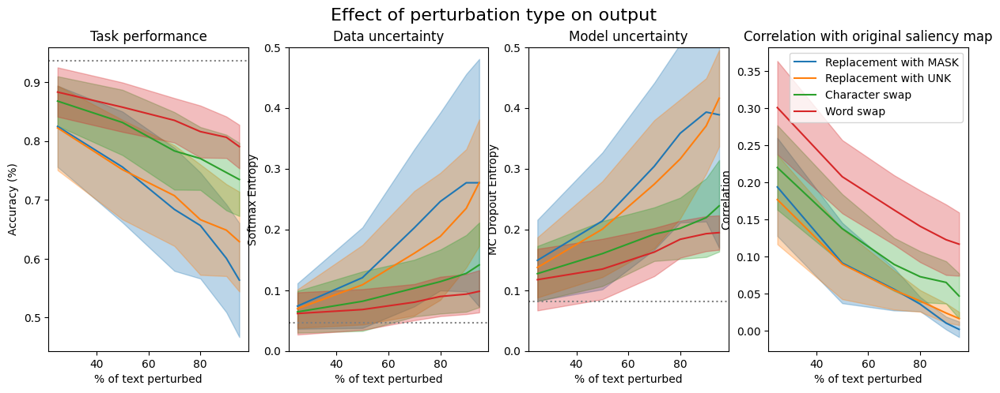

In [32]:
alpha_val = 0.3

fig, ax = plt.subplots(1,4, figsize=(15, 5))
fig.suptitle("Effect of perturbation type on output", size= 16)

pVa = df_output.groupby(['perturbation','lvl'])['accuracy'].mean()
pVs = df_output.groupby(['perturbation','lvl'])['accuracy'].std()


ax[0].set_title("Task performance")
ax[0].axhline(df_output[df_output['pattern'] == 'Clean']['accuracy'].mean(), label = "No perturbation", color='grey', linestyle=':')
ax[0].plot(pVa['token-mask'], label = "Replacement with MASK", color='C0')
ax[0].fill_between([25,50,70,80,90,95], pVa['token-mask'] - pVs['token-mask'], pVa['token-mask'] + pVs['token-mask'], color='C0', alpha=alpha_val)

ax[0].plot(pVa['token-unk'], label = "Replacement with UNK", color='C1')
ax[0].fill_between([25,50,70,80,90,95], pVa['token-unk'] - pVs['token-unk'], pVa['token-unk'] + pVs['token-unk'], color='C1', alpha=alpha_val)

ax[0].plot(pVa['charswap'], label = "Character swap", color='C2')
ax[0].fill_between([25,50,70,80,90,95], pVa['charswap'] - pVs['charswap'], pVa['charswap'] + pVs['charswap'], color='C2', alpha=alpha_val)

ax[0].plot(pVa['synonym'], label = "Word swap", color='C3')
ax[0].fill_between([25,50,70,80,90,95], pVa['synonym'] - pVs['synonym'], pVa['synonym'] + pVs['synonym'], color='C3', alpha=alpha_val)

# ax[0].set_ylim(0,1)
ax[0].set_xlabel("% of text perturbed")
ax[0].set_ylabel("Accuracy (%)")

pVc1 = df_output.groupby(['perturbation','lvl'])['softmax_entropy'].mean()
pVs = df_output.groupby(['perturbation','lvl'])['softmax_entropy'].std()

ax[1].set_title("Data uncertainty")
ax[1].axhline(df_output[df_output['pattern'] == 'Clean']['softmax_entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
ax[1].plot(pVc1['token-mask'], label = "Replacement with MASK", color='C0')
ax[1].fill_between([25,50,70,80,90,95], pVc1['token-mask'] - pVs['token-mask'], pVc1['token-mask'] + pVs['token-mask'], color='C0', alpha=alpha_val)

ax[1].plot(pVc1['token-unk'], label = "Replacement with UNK", color='C1')
ax[1].fill_between([25,50,70,80,90,95], pVc1['token-unk'] - pVs['token-unk'], pVc1['token-unk'] + pVs['token-unk'], color='C1', alpha=alpha_val)

ax[1].plot(pVc1['charswap'], label = "Character swap", color='C2')
ax[1].fill_between([25,50,70,80,90,95], pVc1['charswap'] - pVs['charswap'], pVc1['charswap'] + pVs['charswap'], color='C2', alpha=alpha_val)

ax[1].plot(pVc1['synonym'], label = "Word swap", color='C3')
ax[1].fill_between([25,50,70,80,90,95], pVc1['synonym'] - pVs['synonym'], pVc1['synonym'] + pVs['synonym'], color='C3', alpha=alpha_val)

ax[1].set_xlabel("% of text perturbed")
ax[1].set_ylim(0,.5)
ax[1].set_ylabel("Softmax Entropy")

pVc2 = df_output.groupby(['perturbation','lvl'])['entropy'].mean()
pVs = df_output.groupby(['perturbation','lvl'])['entropy'].std()


ax[2].set_title("Model uncertainty")
ax[2].axhline(df_output[df_output['pattern'] == 'Clean']['entropy'].mean(), label = "No perturbation", color='grey', linestyle=':')
ax[2].plot(pVc2['token-mask'], label = "Replacement with MASK", color='C0')
ax[2].fill_between([25,50,70,80,90,95], pVc2['token-mask'] - pVs['token-mask'], pVc2['token-mask'] + pVs['token-mask'], color='C0', alpha=alpha_val)

ax[2].plot(pVc2['token-unk'], label = "Replacement with UNK", color='C1')
ax[2].fill_between([25,50,70,80,90,95], pVc2['token-unk'] - pVs['token-unk'], pVc2['token-unk'] + pVs['token-unk'], color='C1', alpha=alpha_val)

ax[2].plot(pVc2['charswap'], label = "Character swap", color='C2')
ax[2].fill_between([25,50,70,80,90,95], pVc2['charswap'] - pVs['charswap'], pVc2['charswap'] + pVs['charswap'], color='C2', alpha=alpha_val)

ax[2].plot(pVc2['synonym'], label = "Word swap", color='C3')
ax[2].fill_between([25,50,70,80,90,95], pVc2['synonym'] - pVs['synonym'], pVc2['synonym'] + pVs['synonym'], color='C3', alpha=alpha_val)


# ax[2].legend()
ax[2].set_ylim(0,.5)
ax[2].set_xlabel("% of text perturbed")
ax[2].set_ylabel("MC Dropout Entropy")

ax[3].set_title("Correlation with original saliency map")

pVa = df_output.groupby(['perturbation', 'lvl'])[columns].mean().mean(axis=1)
pVs = df_output.groupby(['perturbation', 'lvl'])[columns].std().std(axis=1)

# ax[3].axhline(1.0, label = "No perturbation", color='grey', linestyle=':')

ax[3].plot(pVa['token-mask'], label = "Replacement with MASK", color='C0')
ax[3].fill_between([25,50,70,80,90,95], pVa['token-mask'] - pVs['token-mask'], pVa['token-mask'] + pVs['token-mask'], color='C0', alpha=alpha_val)

ax[3].plot(pVa['token-unk'], label = "Replacement with UNK", color='C1')
ax[3].fill_between([25,50,70,80,90,95], pVa['token-unk'] - pVs['token-unk'], pVa['token-unk'] + pVs['token-unk'], color='C1', alpha=alpha_val)

ax[3].plot(pVa['charswap'], label = "Character swap", color='C2')
ax[3].fill_between([25,50,70,80,90,95], pVa['charswap'] - pVs['charswap'], pVa['charswap'] + pVs['charswap'], color='C2', alpha=alpha_val)

ax[3].plot(pVa['synonym'], label = "Word swap", color='C3')
ax[3].fill_between([25,50,70,80,90,95], pVa['synonym'] - pVs['synonym'], pVa['synonym'] + pVs['synonym'], color='C3', alpha=alpha_val)

ax[3].legend()
ax[3].set_xlabel("% of text perturbed")
ax[3].set_ylabel("Correlation")



# plt.show()
plt.savefig("Figures/TypevsOutput_2.png")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


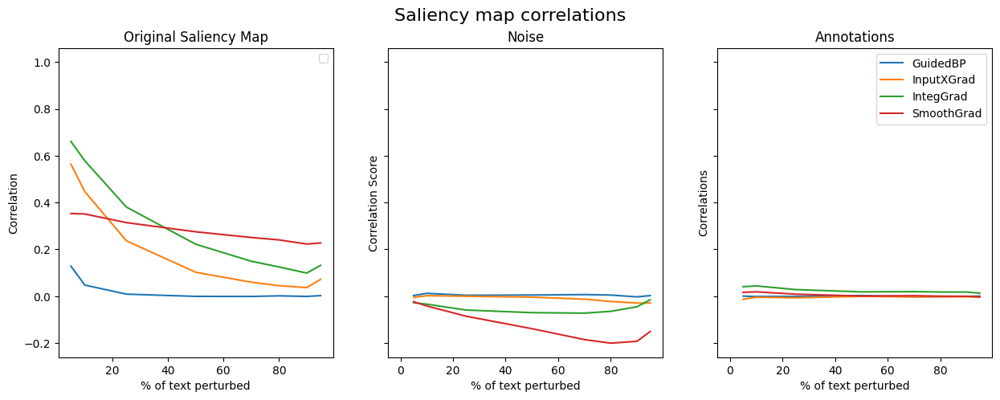

In [80]:
from matplotlib.lines import Line2D


pVa = df_output.groupby(['lvl'])[columns].mean()

fig, ax = plt.subplots(1,3, figsize=(15, 5), sharey=True)
fig.suptitle(f"Saliency map correlations", size= 16)

ax[0].set_title("Original Saliency Map")

ax[0].plot(pVa)


ax[0].legend()
ax[0].set_xlabel("% of text perturbed")
ax[0].set_ylabel("Correlation")

columns = [f'{k}_noise_corr' for k in grads]
pVc1 = df_output.groupby(['lvl'])[columns].mean()
ax[1].plot(1, color='white')

ax[1].set_title("Noise")

ax[1].plot(pVc1)


# ax[1].legend()
ax[1].set_xlabel("% of text perturbed")
ax[1].set_ylabel("Correlation Score")

columns = [f'{k}_anno_corr' for k in grads]

pVc2 = df_output.groupby(['lvl'])[columns].mean()

ax[2].plot(pVc2)
ax[2].plot(1, color='white')

ax[2].set_title("Annotations")

ax[2].legend(labels=grads)
# ax[2].legend(handles=[Line2D([0], [0], linestyle='-', label='SST-2'),
            # Line2D([0], [0], linestyle=':', label='SemEval')])

ax[2].set_xlabel("% of text perturbed")
ax[2].set_ylabel("Correlations")

plt.show()

## RQ2

In [5]:
from scipy.stats import pearsonr
from datasets import load_from_disk
from scipy.stats import entropy

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [11]:
def print_val_in_table(x, y):
    stat, pval = pearsonr(x,y)
    if pval < .00001:
        return f"{stat:.3f}"
    else:
        return f"{stat:.3f}"
    # return stat
    

In [6]:
models =[ 'bert', 'electra', 'roberta', 'gpt2-medium']

subset = df_output[['entropy', 'softmax_entropy'] + [f'{k}_all_anno_MAP' for k in grads] + [f'{k}_majo_anno_MAP' for k in grads]].dropna()

rows = []
for m in models:
    for d in datasets:
        row = [m, d]
        subset = df_output[(df_output['model'] == m) & (df_output['data'] == d)][['entropy', 'softmax_entropy'] + [f'{k}_all_anno_MAP' for k in grads] + [f'{k}_majo_anno_MAP' for k in grads]].dropna()
        # plt.scatter(subset['entropy'], subset['IntegGrad_all_anno_MAP'])
        # plt.show()
        [row.append(print_val_in_table(subset['entropy'],subset[f'{k}_all_anno_MAP'])) for k in grads]
        # [row.append(pearsonr(subset['entropy'],subset[f'{k}_majo_anno_MAP'])[0]) for k in grads]
        [row.append(print_val_in_table(subset['softmax_entropy'],subset[f'{k}_all_anno_MAP'])) for k in grads]
        # [row.append(pearsonr(subset['softmax_entropy'],subset[f'{k}_majo_anno_MAP'])[0]) for k in grads]        
        rows.append(row)

NameError: name 'print_val_in_table' is not defined

In [ ]:
pd.DataFrame(rows, columns = ['model', 'dataset'] + [f'{k} vs EPU' for k in grads] + [f'{k} vs PRU' for k in grads])

,model,dataset,GuidedBP vs EPU,InputXGrad vs EPU,IntegGrad vs EPU,SmoothGrad vs EPU,GuidedBP vs PRU,InputXGrad vs PRU,IntegGrad vs PRU,SmoothGrad vs PRU
0,bert,SemEval,-0.294 *,-0.238 *,-0.096 *,-0.411 *,-0.278 *,-0.222 *,-0.085 *,-0.379 *
1,bert,SST-2,-0.336 *,-0.014 *,-0.526 *,-0.440 *,-0.239 *,0.049 *,-0.377 *,-0.342 *
2,bert,hatexplain,0.355 *,0.253 *,0.281 *,0.331 *,0.244 *,0.125 *,0.112 *,0.193 *
3,electra,SemEval,0.234 *,0.178 *,0.420 *,0.451 *,0.191 *,0.176 *,0.392 *,0.415 *
4,electra,SST-2,-0.380 *,-0.069 *,-0.777 *,-0.417 *,-0.387 *,-0.062 *,-0.731 *,-0.396 *
5,electra,hatexplain,0.488 *,0.296 *,0.603 *,0.253 *,0.517 *,0.319 *,0.596 *,0.242 *
6,roberta,SemEval,-0.533 *,-0.477 *,-0.348 *,-0.595 *,-0.509 *,-0.471 *,-0.300 *,-0.523 *
7,roberta,SST-2,-0.300 *,-0.178 *,-0.593 *,-0.417 *,-0.333 *,-0.255 *,-0.451 *,-0.356 *
8,roberta,hatexplain,0.498 *,0.349 *,0.487 *,0.342 *,0.395 *,0.251 *,0.380 *,0.227 *
9,gpt2-medium,SemEval,-0.691 *,-0.679 *,-0.695 *,-0.472 *,-0.725 *,-0.719 *,-0.731 *,-0.459 *


In [18]:
rows = []

lvls = [5., 10., 25., 50., 70., 80., 90., 95.]

m = 'bert'
d = 'SST-2'
k = "IntegGrad"

# row = [0]
# subset1 = df_output[(df_output['model'] == m) & (df_output['data'] == d)][['lvl', 'entropy', 'softmax_entropy', f'{k}_all_anno_MAP' ]] #.dropna()
# subset2 = subset1[subset1['lvl'].isnull()]
# subset =  subset2[['entropy', 'softmax_entropy', f'{k}_all_anno_MAP' ]].dropna()
# row.append(pearsonr(subset['entropy'],subset[f'{k}_all_anno_MAP'])[0])
# # [row.append(pearsonr(subset['entropy'],subset[f'{k}_majo_anno_MAP'])[0]) for k in grads]
# row.append(pearsonr(subset['softmax_entropy'],subset[f'{k}_all_anno_MAP'])[0])

for l in lvls:
        row = [l]
        subset1 = df_output[(df_output['model'] == m) & (df_output['data'] == d)][['lvl', 'entropy', 'softmax_entropy', f'{k}_all_anno_MAP' ]] #.dropna()
        subset2 = pd.concat([subset1[subset1['lvl'] <= l], subset1[subset1['lvl'].isnull()]])
        subset =  subset2[['entropy', 'softmax_entropy', f'{k}_all_anno_MAP' ]].dropna()
        # plt.scatter(subset['entropy'], subset['IntegGrad_all_anno_MAP'])
        # plt.show()
        row.append(print_val_in_table(subset['entropy'],subset[f'{k}_all_anno_MAP']))
        # [row.append(pearsonr(subset['entropy'],subset[f'{k}_majo_anno_MAP'])[0]) for k in grads]
        row.append(print_val_in_table(subset['softmax_entropy'],subset[f'{k}_all_anno_MAP']))
        # [row.append(pearsonr(subset['softmax_entropy'],subset[f'{k}_majo_anno_MAP'])[0]) for k in grads]        
        rows.append(row)
        
pd.DataFrame(rows, columns = ['lvl', 'EPU', 'PRU'])

,lvl,EPU,PRU
0,5.0,-0.554,-0.279
1,10.0,-0.629,-0.313
2,25.0,-0.721,-0.422
3,50.0,-0.737,-0.550
4,70.0,-0.699,-0.548
5,80.0,-0.670,-0.542
6,90.0,-0.615,-0.495
7,95.0,-0.526,-0.377


In [ ]:
pd.DataFrame(rows, columns = ['model', 'dataset'] + [f'{k} vs EPU' for k in grads] + [f'{k} vs PRU' for k in grads])

In [77]:
rows= []
for m in models:
    for k in grads:
        row = [m]
        subset = df_output[(df_output['model'] == m)][['entropy', 'softmax_entropy'] + [f'{k}_all_anno_MAP' for k in grads] + [f'{k}_majo_anno_MAP' for k in grads]].dropna()
        [row.append(print_val_in_table(subset['entropy'],subset[f'{k}_all_anno_MAP'])) for k in grads]
        # [row.append(pearsonr(subset['entropy'],subset[f'{k}_majo_anno_MAP'])[0]) for k in grads]
        [row.append(print_val_in_table(subset['softmax_entropy'],subset[f'{k}_all_anno_MAP'])) for k in grads]
        # [row.append(pearsonr(subset['softmax_entropy'],subset[f'{k}_majo_anno_MAP'])[0]) for k in grads]        
        
    rows.append(row)
    
pd.DataFrame(rows, columns = ['model'] + [f'{k} vs EPU' for k in grads] + [f'{k} vs PRU' for k in grads])

,model,GuidedBP vs EPU,InputXGrad vs EPU,IntegGrad vs EPU,SmoothGrad vs EPU,GuidedBP vs PRU,InputXGrad vs PRU,IntegGrad vs PRU,SmoothGrad vs PRU
0,bert,-0.033469,-0.028024,-0.066278,-0.024894,-0.039535,-0.035368,-0.071599,-0.032850
1,electra,0.057001,0.073834,-0.016245,0.057733,0.153247,0.172164,0.077257,0.154285
2,roberta,0.058263,0.072606,-0.011160,0.044412,0.045710,0.059113,-0.016521,0.035380
3,gpt2-medium,-0.012225,0.043669,-0.054913,-0.049620,0.012657,0.074206,-0.031471,-0.014244


In [83]:
df = pd.DataFrame(rows, columns = ['model'] + [f'{k} vs EPU' for k in grads] + [f'{k} vs PRU' for k in grads])


df.iloc[:,1:].values.std()

0.0637544473850356

In [29]:
rows= []

for d in datasets:
    row = [d]
    subset = df_output[(df_output['data'] == d)][['entropy', 'softmax_entropy'] + [f'{k}_all_anno_MAP' for k in grads] + [f'{k}_majo_anno_MAP' for k in grads]].dropna()
    [row.append(pearsonr(subset['entropy'],subset[f'{k}_all_anno_MAP'])[0]) for k in grads]
    # [row.append(pearsonr(subset['entropy'],subset[f'{k}_majo_anno_MAP'])[0]) for k in grads]
    [row.append(pearsonr(subset['softmax_entropy'],subset[f'{k}_all_anno_MAP'])[0]) for k in grads]
    # [row.append(pearsonr(subset['softmax_entropy'],subset[f'{k}_majo_anno_MAP'])[0]) for k in grads]        
    rows.append(row)
    
pd.DataFrame(rows, columns = ['dataset'] + [f'{k} vs EPU' for k in grads] + [f'{k} vs PRU' for k in grads])

,dataset,GuidedBP vs EPU,InputXGrad vs EPU,IntegGrad vs EPU,SmoothGrad vs EPU,GuidedBP vs PRU,InputXGrad vs PRU,IntegGrad vs PRU,SmoothGrad vs PRU
0,SemEval,0.053231,-0.022423,0.193033,-0.265249,0.009533,-0.070867,0.140838,-0.198321
1,SST-2,-0.084899,-0.244974,-0.474537,-0.466813,-0.148805,-0.272670,-0.460952,-0.459612
2,hatexplain,0.373587,0.303579,0.071203,-0.336908,0.288674,0.308835,-0.025325,-0.368982


In [34]:


rows = []
for m in models:
    row = [m]
    subset = df_output[(df_output['model'] == m) & (df_output['data'] != 'hatexplain')][['entropy', 'softmax_entropy'] + [f'{k}_all_anno_MAP' for k in grads] + [f'{k}_majo_anno_MAP' for k in grads]].dropna()
    [row.append(pearsonr(subset['entropy'],subset[f'{k}_all_anno_MAP'])[0]) for k in grads]
    # [row.append(pearsonr(subset['entropy'],subset[f'{k}_majo_anno_MAP'])[0]) for k in grads]
    [row.append(pearsonr(subset['softmax_entropy'],subset[f'{k}_all_anno_MAP'])[0]) for k in grads]
    # [row.append(pearsonr(subset['softmax_entropy'],subset[f'{k}_majo_anno_MAP'])[0]) for k in grads]        
    rows.append(row)
    
pd.DataFrame(rows, columns = ['model'] + [f'{k} vs EPU' for k in grads] + [f'{k} vs PRU' for k in grads])

,model,GuidedBP vs EPU,InputXGrad vs EPU,IntegGrad vs EPU,SmoothGrad vs EPU,GuidedBP vs PRU,InputXGrad vs PRU,IntegGrad vs PRU,SmoothGrad vs PRU
0,bert,-0.213861,-0.189276,-0.254774,-0.270180,-0.217846,-0.197563,-0.244300,-0.261604
1,electra,-0.006865,0.019935,-0.112285,-0.022555,0.179982,0.210817,0.071706,0.164569
2,roberta,0.004134,0.018923,-0.070391,-0.024652,-0.078026,-0.065534,-0.127959,-0.095829
3,gpt2-medium,-0.176203,-0.136251,-0.191430,-0.159965,-0.038998,-0.005450,-0.053689,-0.015894


In [13]:
filename = f"/tmp/svm-erda/Saliency/Clean/bert/Classes/SST-2/0/GuidedBP.tsv"
df = pd.read_csv(filename, index_col=0, sep = '\t')
df

,pred_class,true_class,pred_prob,pred_entropy,raw_input,attribution_scores
id,,,,,,
0,1,1,1.00,0.001170,an artful intelligent film that stays within t...,-0.040000 0.070000 -0.170000 0.420000 0.080000...
20,1,1,1.00,0.001181,an exhilarating futuristic thriller-noir minor...,0.020000 -0.050000 0.010000 -0.110000 0.110000...
26,0,0,1.00,0.001523,a nightmare date with a half-formed wit done a...,-0.270000 -0.120000 0.000000 0.180000 0.060000...
33,0,0,1.00,0.001835,suffers from the lack of a compelling or compr...,0.460000 -0.200000 -0.320000 0.060000 0.290000...
71,0,0,1.00,0.007082,this is a shameless sham calculated to cash in...,-0.100000 -0.070000 -0.080000 0.180000 0.34000...
...,...,...,...,...,...,...
485,0,0,1.00,0.001509,with virtually no interesting elements for an ...,-0.030000 0.420000 -0.370000 0.400000 -0.20000...
489,0,0,1.00,0.001617,an overemphatic would-be wacky ultimately tedi...,0.050000 0.012500 0.010000 0.485000 -0.120000 ...
492,0,0,1.00,0.001801,because of an unnecessary and clumsy last scen...,0.110000 -0.040000 0.060000 -0.240000 0.070000...


In [15]:
import warnings
warnings.filterwarnings('ignore')
models = ['bert', 'roberta', 'electra', 'gpt2-medium']
grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']
for model in models:
    for k in grads:
        filename = f"/tmp/svm-erda/Saliency/Clean/{model}/Classes/SST-2/0/{k}.tsv"
        df = pd.read_csv(filename, index_col=0, sep = '\t')
        filename = f"/tmp/svm-erda/Saliency/Clean/{model}/Classes/SST-2/1/{k}.tsv"
        df_2 = pd.read_csv(filename, index_col=0, sep = '\t')

        out = df.merge(df_2['attribution_scores'], left_index=True, right_index=True)

        out['true_saliency'] = out.apply(lambda x: x.attribution_scores_x if x.pred_class == 0 else x.attribution_scores_y, axis=1).map(convert_to_list)
        out['fake_saliency'] = out.apply(lambda x: x.attribution_scores_y if x.pred_class == 0 else x.attribution_scores_x, axis=1).map(convert_to_list)

        out['SD'] = (out['true_saliency'] - out['fake_saliency']).map(lambda x: np.mean(np.abs(x)))

        ## Get correlation to humman annotation
        out['anno_corrs'] = out[['true_saliency']].merge(anno_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_correlation(x.true_saliency, x.anno, temp_fix=True), axis=1) #temp_fix=False, extra_data=None):

        ## Get correlation to humman annotation
        out['all_anno_corrs'] = out[['true_saliency']].merge(all_annos_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_map( x.anno, x.true_saliency, temp_fix=True), axis=1)

        out['majo_anno_corrs'] = out[['true_saliency']].merge(majority_annos_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_map( x.anno, x.true_saliency, temp_fix=True), axis=1)

        out['saliency_range'] = out.apply(lambda x: get_map_entropy_range(x.true_saliency, x.fake_saliency), axis=1)
        out.dropna(inplace=True)
        
        print(model.upper(), k.upper())
        print(pearsonr(out[out['pred_class'] == out['true_class']]['all_anno_corrs'], out[out['pred_class'] == out['true_class']]['saliency_range']))
        print(pearsonr(out[out['pred_class'] == out['true_class']]['majo_anno_corrs'], out[out['pred_class'] == out['true_class']]['saliency_range']))
        print(pearsonr(out['anno_corrs'], out['saliency_range']))
        print(pearsonr(out['all_anno_corrs'], out['saliency_range']))
        print(pearsonr(out['majo_anno_corrs'], out['saliency_range']))
        print()

NameError: name 'convert_to_list' is not defined

In [63]:
filename = f"/tmp/svm-erda/Uncertainty/bert/CLEAN/SST-2_uncertainty.tsv"
df = pd.read_csv(filename, index_col=0)
df

,mean_0,mean_1,variance_0,variance_1,entropy,mutual_info
0,0.000160,0.999840,1.214125e-09,1.213591e-09,0.001562,0.000004
20,0.000157,0.999843,8.494780e-10,8.487795e-10,0.001532,0.000003
26,0.999792,0.000208,1.866353e-09,1.866225e-09,0.001967,0.000004
33,0.999747,0.000253,2.886383e-09,2.886021e-09,0.002345,0.000006
71,0.999046,0.000954,6.881098e-07,6.881148e-07,0.007588,0.000257
...,...,...,...,...,...,...
485,0.999680,0.000320,1.949259e-08,1.949190e-08,0.002898,0.000026
489,0.999779,0.000221,2.617359e-09,2.617190e-09,0.002081,0.000006
492,0.999755,0.000245,3.598166e-09,3.597367e-09,0.002286,0.000007
495,0.998914,0.001086,8.841351e-07,8.841357e-07,0.008497,0.000258


In [17]:
from scipy.stats import pearsonr
from sklearn.metrics import average_precision_score
import pandas as pd
import numpy as np
from datasets import load_from_disk
from scipy.stats import entropy



grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']

def get_map(new, old, temp_fix=False, extra_data=None):
    
    if not any(old):
        print("NO POSITIVE ANNOTATIONS:", extra_data)
        return np.nan
    
    if temp_fix == True:
        if len(old) > len(new): ## If tokenizer wrong size, do this for now
            print("FIXED: ", extra_data)
            old = old[:len(new)]
        if len(new) > len(old): ### WHAT CAUSES THIS?
            print("LONGER NEW TEST: ", extra_data)
            new = new[:len(old)]
            
    return average_precision_score(new,old,pos_label=1)

def convert_to_list(val):
    return np.array([float(x) for x in val.split(' ')])

def get_entropy_complexity(x):
    a = np.array(np.abs(x), dtype=np.float64) / np.sum(np.abs(x))
    return entropy(pk=a)

def get_zero_vd(x):
    ref = np.zeros(x.shape)
    return np.linalg.norm(x - ref)

def get_map_entropy_range(true, fake):
    ents = []
    for pair in np.vstack([true,fake]).transpose():
        # ents.append(abs(pair[0] - pair[1]))
        ents.append(get_entropy_complexity(pair))
        # (df-df.min())/(df.max()-df.min())
    return max(ents) - min(ents) #np.mean(ents)  #np.ptp(ents) #(ents - min(ents))/(max(ents)-min(ents)) #np.ptp(ents)

models = ['bert', 'electra', 'roberta', 'gpt2-medium']

anno_pattern = pd.Series(load_from_disk(f"./Data/Noise/SST-2")[f"annotations"], index=load_from_disk(f"./Data/Noise/SST-2")["index"], name="anno").map(lambda x: np.array([float(y) for y in x.split()]))
label_pattern =  pd.Series(load_from_disk(f"./Data/Noise/SST-2")[f"label"], index=load_from_disk(f"./Data/Noise/SST-2")["index"], name="label").map(lambda x: x*2 - 1)
anno_pattern *= label_pattern
all_annos_pattern= anno_pattern.map(lambda x: np.where(x>0, 1, 0))
all_annos_pattern.name = 'anno'

rows = []
for m in models:
    for k in grads:
        row = [m, k]
        filename = f"/tmp/svm-erda/Saliency/Clean/{m}/Classes/SST-2/0/{k}.tsv"
        df = pd.read_csv(filename, index_col=0, sep = '\t')
        filename = f"/tmp/svm-erda/Saliency/Clean/{m}/Classes/SST-2/1/{k}.tsv"
        df_2 = pd.read_csv(filename, index_col=0, sep = '\t')
        filename = f"/tmp/svm-erda/Uncertainty/{m}/CLEAN/SST-2_uncertainty.tsv"
        df_3 = pd.read_csv(filename, index_col=0)
        
        out = df.merge(df_2['attribution_scores'], left_index=True, right_index=True)

        out['true_saliency'] = out.apply(lambda x: x.attribution_scores_x if x.pred_class == 0 else x.attribution_scores_y, axis=1).map(convert_to_list)
        out['fake_saliency'] = out.apply(lambda x: x.attribution_scores_y if x.pred_class == 0 else x.attribution_scores_x, axis=1).map(convert_to_list)
        out['SD'] = (out['true_saliency'] - out['fake_saliency']).map(lambda x: np.mean(np.abs(x)))
        out['all_anno_map'] = out[['true_saliency']].merge(all_annos_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_map( x.anno, x.true_saliency, temp_fix=True), axis=1)
        out['complexity'] = out['true_saliency'].map(get_entropy_complexity)
        out['saliency_range'] = out.apply(lambda x: get_map_entropy_range(x.true_saliency, x.fake_saliency), axis=1)
        out['zvd'] = out['true_saliency'].map(get_zero_vd)
        # out.dropna(inplace=True)
        
        final = out.merge(df_3["entropy"], left_index=True, right_index=True)
        final.dropna(inplace=True)
        
        for metric in ['pred_entropy', 'entropy', 'complexity', 'saliency_range', 'zvd']:
            stat, pval = pearsonr(final['all_anno_map'], final[metric])
            if pval < 0.001:
                stat = f"{stat:.3f}" + " *"
            else:
                stat = f"{stat:.3f}"
            row.append(stat)
        rows.append(row)
            
pd.DataFrame(rows, columns = ['model', 'map', 'ALU', 'EPU', 'COM', 'CCTE', 'ZVD'])

,model,map,ALU,EPU,COM,CCTE,ZVD
0,bert,GuidedBP,0.085,0.073,-0.390,-0.066,-0.039
1,bert,InputXGrad,0.089,0.026,-0.497 *,-0.126,-0.229
2,bert,IntegGrad,-0.042,-0.036,-0.352,nan,-0.017
3,bert,SmoothGrad,-0.068,-0.109,-0.118,-0.196,0.238
4,electra,GuidedBP,0.024,-0.065,-0.327,-0.103,0.073
5,electra,InputXGrad,-0.040,-0.106,-0.452 *,-0.113,-0.071
6,electra,IntegGrad,-0.035,-0.027,-0.390,nan,-0.062
7,electra,SmoothGrad,0.002,-0.130,-0.435 *,-0.253,-0.124
8,roberta,GuidedBP,0.059,0.152,-0.104,0.090,-0.034
9,roberta,InputXGrad,-0.002,0.147,-0.172,nan,-0.098


In [11]:
from scipy.stats import pearsonr
from sklearn.metrics import average_precision_score
import pandas as pd
import numpy as np
from datasets import load_from_disk
from scipy.stats import entropy



grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']

def get_map(new, old, temp_fix=False, extra_data=None):
    
    if not any(old):
        print("NO POSITIVE ANNOTATIONS:", extra_data)
        return np.nan
    
    if temp_fix == True:
        if len(old) > len(new): ## If tokenizer wrong size, do this for now
            print("FIXED: ", extra_data)
            old = old[:len(new)]
        if len(new) > len(old): ### WHAT CAUSES THIS?
            print("LONGER NEW TEST: ", extra_data)
            new = new[:len(old)]
            
    return average_precision_score(new,old,pos_label=1)

def convert_to_list(val):
    return np.array([float(x) for x in val.split(' ')])

def get_entropy_complexity(x):
    a = np.array(np.abs(x), dtype=np.float64) / np.sum(np.abs(x))
    return entropy(pk=a)

def get_zero_vd(x):
    ref = np.zeros(x.shape)
    return np.linalg.norm(x - ref)

def get_map_entropy_range(true, fake):
    ents = []
    for pair in np.vstack([true,fake]).transpose():
        # ents.append(abs(pair[0] - pair[1]))
        ents.append(get_entropy_complexity(pair))
        # (df-df.min())/(df.max()-df.min())
    return max(ents) - min(ents) #np.mean(ents)  #np.ptp(ents) #(ents - min(ents))/(max(ents)-min(ents)) #np.ptp(ents)

models = ['bert', 'electra', 'roberta'] # 'gpt2-medium']

anno_pattern = pd.Series(load_from_disk(f"./Data/Noise/SST-2")[f"annotations"], index=load_from_disk(f"./Data/Noise/SST-2")["index"], name="anno").map(lambda x: np.array([float(y) for y in x.split()]))
label_pattern =  pd.Series(load_from_disk(f"./Data/Noise/SST-2")[f"label"], index=load_from_disk(f"./Data/Noise/SST-2")["index"], name="label").map(lambda x: x*2 - 1)
anno_pattern *= label_pattern
all_annos_pattern= anno_pattern.map(lambda x: np.where(x>0, 1, 0))
all_annos_pattern.name = 'anno'

rows = []
for m in models:
    for k in grads:
        row = [m, k]
        filename = f"/tmp/svm-erda/Saliency/Clean/{m}/Classes/SST-2/0/{k}.tsv"
        df = pd.read_csv(filename, index_col=0, sep = '\t')
        filename = f"/tmp/svm-erda/Saliency/Clean/{m}/Classes/SST-2/1/{k}.tsv"
        df_2 = pd.read_csv(filename, index_col=0, sep = '\t')
        filename = f"/tmp/svm-erda/Uncertainty/{m}/CLEAN/SST-2_uncertainty.tsv"
        df_3 = pd.read_csv(filename, index_col=0)
        
        out = df.merge(df_2['attribution_scores'], left_index=True, right_index=True)

        out['true_saliency'] = out.apply(lambda x: x.attribution_scores_x if x.pred_class == 0 else x.attribution_scores_y, axis=1).map(convert_to_list)
        out['fake_saliency'] = out.apply(lambda x: x.attribution_scores_y if x.pred_class == 0 else x.attribution_scores_x, axis=1).map(convert_to_list)
        out['SD'] = (out['true_saliency'] - out['fake_saliency']).map(lambda x: np.mean(np.abs(x)))
        out['all_anno_map'] = out[['true_saliency']].merge(all_annos_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_map( x.anno, x.true_saliency, temp_fix=True), axis=1)
        out['complexity'] = out['true_saliency'].map(get_entropy_complexity)
        out['saliency_range'] = out.apply(lambda x: get_map_entropy_range(x.true_saliency, x.fake_saliency), axis=1)
        out['zvd'] = out['true_saliency'].map(get_zero_vd)
        # out.dropna(inplace=True)
        
        final = out.merge(df_3["entropy"], left_index=True, right_index=True)
        final.dropna(inplace=True)
        
        for u in  ['pred_entropy', 'entropy']:
            for metric in ['complexity', 'saliency_range', 'zvd']:
                stat, pval = pearsonr(final[u], final[metric])
                if pval < 0.001:
                    stat = f"{stat:.3f}" + " *"
                else:
                    stat = f"{stat:.3f}"
                row.append(stat)
        rows.append(row)
            
pd.DataFrame(rows, columns = ['model', 'map', 'aleo x complexity', ' aleo x TSR', ' aleo x ZVD', 'epi x complexity', ' epi x TSR', ' epi x ZVD'])

/tmp/ipykernel_617466/494981387.py:32: RuntimeWarning: invalid value encountered in divide
  a = np.array(np.abs(x), dtype=np.float64) / np.sum(np.abs(x))
/tmp/ipykernel_617466/494981387.py:32: RuntimeWarning: invalid value encountered in divide
  a = np.array(np.abs(x), dtype=np.float64) / np.sum(np.abs(x))
/tmp/ipykernel_617466/494981387.py:32: RuntimeWarning: invalid value encountered in divide
  a = np.array(np.abs(x), dtype=np.float64) / np.sum(np.abs(x))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/tmp/ipykernel_617466/494981387.py:32: RuntimeWarning: invalid value encountered in divide
  a = np.array(np.abs(x), dtype=np.float64) / np.sum(np.abs(x))
/tmp/ipykernel_617466/494981387.py:32: RuntimeWarning: invalid value encountered in divide
  a = np.array(np.abs(x), dtype=np.float64) / n

,model,map,aleo x complexity,aleo x TSR,aleo x ZVD,epi x complexity,epi x TSR,epi x ZVD
0,bert,GuidedBP,-0.135,0.076,-0.104,-0.118,0.093,-0.098
1,bert,InputXGrad,-0.033,-0.026,0.165,-0.002,-0.032,0.175
2,bert,IntegGrad,-0.161,nan,-0.118,-0.143,nan,-0.134
3,bert,SmoothGrad,-0.116,-0.038,-0.065,-0.093,-0.066,-0.040
4,electra,GuidedBP,-0.009,0.075,0.042,-0.048,0.014,-0.021
5,electra,InputXGrad,0.001,-0.068,0.087,-0.028,-0.062,0.092
6,electra,IntegGrad,0.046,nan,0.023,0.002,nan,0.016
7,electra,SmoothGrad,0.009,-0.108,0.025,-0.013,-0.102,-0.024
8,roberta,GuidedBP,-0.084,-0.409 *,-0.045,0.005,-0.198,0.031
9,roberta,InputXGrad,-0.097,nan,0.011,0.002,nan,-0.002


In [79]:
m = 'electra'
k = 'InputXGrad'

filename = f"/tmp/svm-erda/Saliency/Clean/{m}/Classes/SST-2/0/{k}.tsv"
df = pd.read_csv(filename, index_col=0, sep = '\t')
filename = f"/tmp/svm-erda/Saliency/Clean/{m}/Classes/SST-2/1/{k}.tsv"
df_2 = pd.read_csv(filename, index_col=0, sep = '\t')
filename = f"/tmp/svm-erda/Uncertainty/{m}/CLEAN/SST-2_uncertainty.tsv"
df_3 = pd.read_csv(filename, index_col=0)

out = df.merge(df_2['attribution_scores'], left_index=True, right_index=True)

out['true_saliency'] = out.apply(lambda x: x.attribution_scores_x if x.pred_class == 0 else x.attribution_scores_y, axis=1).map(convert_to_list)
out['fake_saliency'] = out.apply(lambda x: x.attribution_scores_y if x.pred_class == 0 else x.attribution_scores_x, axis=1).map(convert_to_list)
out['SD'] = (out['true_saliency'] - out['fake_saliency']).map(lambda x: np.mean(np.abs(x)))
out['all_anno_map'] = out[['true_saliency']].merge(all_annos_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_map( x.anno, x.true_saliency, temp_fix=True), axis=1)
out['complexity'] = out['true_saliency'].map(get_entropy_complexity)
out['saliency_range'] = out.apply(lambda x: get_map_entropy_range(x.true_saliency, x.fake_saliency), axis=1)
# out.dropna(inplace=True)

final = out.merge(df_3["entropy"], left_index=True, right_index=True)
final.dropna(inplace=True)

plt.scatter(final['SD'])

/tmp/ipykernel_3700978/914698245.py:26: RuntimeWarning: invalid value encountered in divide
  a = np.array(np.abs(x), dtype=np.float64) / np.sum(np.abs(x))


TypeError: scatter() missing 1 required positional argument: 'y'

In [4]:
from scipy.stats import pearsonr
from datasets import load_from_disk
from scipy.stats import entropy


grads = ['GuidedBP', 'InputXGrad', 'IntegGrad', 'SmoothGrad']

def convert_to_list(val):
    return np.array([float(x) for x in val.split(' ')])

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
out

,pred_class_x,true_class_x,pred_prob_x,pred_entropy_x,raw_input_x,attribution_scores_x,pred_class_y,true_class_y,pred_prob_y,pred_entropy_y,raw_input_y,attribution_scores_y
id,,,,,,,,,,,,
155285232084467712,0,0,1.00,0.018094,I just hope Ian Bennett is first out of the se...,0.08 0.00 -0.02 0.08 0.25 0.10 0.14 0.06 -0.12...,0,0,1.00,0.018094,I just hope Ian Bennett is first out of the se...,-0.01 -0.11 -0.17 0.00 0.00 0.17 -0.30 0.04 0....
158551378271277058,0,0,1.00,0.026415,Watched a movie yesterday #The70's on #OVTV an...,0.04 -0.17 0.00 0.21 -0.02 -0.16 0.05 -0.13 0....,0,0,1.00,0.026415,Watched a movie yesterday #The70's on #OVTV an...,0.03 0.12 0.00 -0.68 0.02 -0.04 -0.04 -0.05 0....
159200989268807680,0,0,1.00,0.016135,I liked a @YouTube video http://t.co/dSPcjWDB ...,0.29 -0.23 0.03 -0.36 -0.04 0.00 -0.01 -0.09 -...,0,0,1.00,0.016135,I liked a @YouTube video http://t.co/dSPcjWDB ...,-0.08 0.08 0.24 0.08 0.41 0.01 -0.16 0.08 0.16...
160323475427430400,0,0,0.99,0.036235,A win for #LFC v Bolton will see them beat the...,-0.03 0.43 -0.11 0.01 -0.04 0.11 0.09 -0.22 0....,0,0,0.99,0.036235,A win for #LFC v Bolton will see them beat the...,0.04 -0.27 -0.07 0.03 0.00 0.19 0.24 0.09 0.05...
160660491574837248,1,1,0.99,0.038192,@couriermail I may not agree with Wilkie's ide...,-0.09 -0.04 -0.02 0.11 -0.33 0.11 0.01 -0.14 -...,1,1,0.99,0.038192,@couriermail I may not agree with Wilkie's ide...,0.01 -0.04 0.19 0.19 0.05 -0.01 0.01 0.02 -0.0...
...,...,...,...,...,...,...,...,...,...,...,...,...
264248465440272384,1,1,0.99,0.059882,When your lying in bed and your phone is on yo...,-0.08 0.09 0.19 -0.13 0.35 -0.05 0.01 -0.26 0....,1,1,0.99,0.059882,When your lying in bed and your phone is on yo...,-0.10 0.04 0.23 -0.20 -0.43 -0.09 -0.01 -0.09 ...
264252575879151616,0,0,0.68,0.625513,Arsenal reportedly tracking the progress of Le...,-0.39 0.49 0.42 -0.07 0.35 -0.26 -0.02 -0.02 0...,0,0,0.68,0.625513,Arsenal reportedly tracking the progress of Le...,0.03 -0.78 -0.04 0.11 -0.11 -0.31 0.02 0.02 -0...
264257216004120576,1,1,0.99,0.043399,@LaFanMike7 I'd ask my roommate how he felt ab...,0.04 -0.02 -0.07 0.02 0.00 -0.01 0.05 0.27 0.0...,1,1,0.99,0.043399,@LaFanMike7 I'd ask my roommate how he felt ab...,0.05 0.06 -0.02 -0.08 0.00 -0.09 0.09 0.14 -0....


In [7]:
models = ['bert', 'electra', 'roberta']
datasets = ['SemEval']
PATTERN = 'Clean'

pt = None
lvl = None
dfs = []
for m in models:
    for dataset in datasets:
        for k in grads:
            sides = []
            for c in range(2):
                filename = f"/tmp/svm-erda/Saliency/Clean/{m}/Classes/{dataset}/{c}/{k}.tsv"
                df = pd.read_csv(filename, index_col=0, sep = '\t')
                sides.append(df)
            out = sides[0].merge(sides[1], left_index=True, right_index=True)
            
            out['true_saliency'] = out.apply(lambda x: x.attribution_scores_x if x.pred_class_x == 0 else x.attribution_scores_y, axis=1).map(convert_to_list)
            out['fake_saliency'] = out.apply(lambda x: x.attribution_scores_y if x.pred_class_x == 0 else x.attribution_scores_x, axis=1).map(convert_to_list)

            out['SD'] = (out['true_saliency'] - out['fake_saliency']).map(lambda x: np.mean(x))
            
                
                
df.head()

,pred_class,true_class,pred_prob,pred_entropy,raw_input,attribution_scores
id,,,,,,
155285232084467712,0,0,1.00,0.018103,I just hope Ian Bennett is first out of the se...,0.11 0.12 0.27 0.12 0.09 0.18 0.13 0.36 0.19 0...
158551378271277058,0,0,1.00,0.011329,Watched a movie yesterday #The70's on #OVTV an...,0.17 0.12 0.10 0.27 0.13 0.14 0.17 0.14 0.10 0...
159200989268807680,0,0,1.00,0.009941,I liked a @YouTube video http://t.co/dSPcjWDB ...,0.11 0.14 0.12 0.20 0.10 0.11 0.12 0.10 0.16 0...
160323475427430400,0,0,1.00,0.022686,A win for #LFC v Bolton will see them beat the...,0.17 0.13 0.16 0.14 0.14 0.11 0.11 0.14 0.13 0...
160660491574837248,1,1,0.98,0.084483,@couriermail I may not agree with Wilkie's ide...,0.11 0.11 0.12 0.14 0.15 0.26 0.11 0.11 0.16 0...


In [8]:
out

,pred_class_x,true_class_x,pred_prob_x,pred_entropy_x,raw_input_x,attribution_scores_x,pred_class_y,true_class_y,pred_prob_y,pred_entropy_y,raw_input_y,attribution_scores_y,true_saliency,fake_saliency,SD
id,,,,,,,,,,,,,,,
155285232084467712,0,0,1.00,0.018103,I just hope Ian Bennett is first out of the se...,0.15 0.10 0.13 0.13 0.13 0.09 0.15 0.09 0.11 0...,0,0,1.00,0.018103,I just hope Ian Bennett is first out of the se...,0.11 0.12 0.27 0.12 0.09 0.18 0.13 0.36 0.19 0...,"[0.15, 0.1, 0.13, 0.13, 0.13, 0.09, 0.15, 0.09...","[0.11, 0.12, 0.27, 0.12, 0.09, 0.18, 0.13, 0.3...",-0.020000
158551378271277058,0,0,1.00,0.011329,Watched a movie yesterday #The70's on #OVTV an...,0.15 0.11 0.15 0.14 0.14 0.14 0.12 0.18 0.13 0...,0,0,1.00,0.011329,Watched a movie yesterday #The70's on #OVTV an...,0.17 0.12 0.10 0.27 0.13 0.14 0.17 0.14 0.10 0...,"[0.15, 0.11, 0.15, 0.14, 0.14, 0.14, 0.12, 0.1...","[0.17, 0.12, 0.1, 0.27, 0.13, 0.14, 0.17, 0.14...",0.001579
159200989268807680,0,0,1.00,0.009941,I liked a @YouTube video http://t.co/dSPcjWDB ...,0.15 0.13 0.13 0.17 0.25 0.11 0.08 0.16 0.14 0...,0,0,1.00,0.009941,I liked a @YouTube video http://t.co/dSPcjWDB ...,0.11 0.14 0.12 0.20 0.10 0.11 0.12 0.10 0.16 0...,"[0.15, 0.13, 0.13, 0.17, 0.25, 0.11, 0.08, 0.1...","[0.11, 0.14, 0.12, 0.2, 0.1, 0.11, 0.12, 0.1, ...",0.002000
160323475427430400,0,0,1.00,0.022686,A win for #LFC v Bolton will see them beat the...,0.11 0.21 0.12 0.12 0.11 0.13 0.12 0.12 0.14 0...,0,0,1.00,0.022686,A win for #LFC v Bolton will see them beat the...,0.17 0.13 0.16 0.14 0.14 0.11 0.11 0.14 0.13 0...,"[0.11, 0.21, 0.12, 0.12, 0.11, 0.13, 0.12, 0.1...","[0.17, 0.13, 0.16, 0.14, 0.14, 0.11, 0.11, 0.1...",-0.010000
160660491574837248,1,1,0.98,0.084483,@couriermail I may not agree with Wilkie's ide...,0.12 0.14 0.08 0.30 0.10 0.13 0.11 0.09 0.12 0...,1,1,0.98,0.084483,@couriermail I may not agree with Wilkie's ide...,0.11 0.11 0.12 0.14 0.15 0.26 0.11 0.11 0.16 0...,"[0.11, 0.11, 0.12, 0.14, 0.15, 0.26, 0.11, 0.1...","[0.12, 0.14, 0.08, 0.3, 0.1, 0.13, 0.11, 0.09,...",0.000769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264248465440272384,1,1,0.99,0.054509,When your lying in bed and your phone is on yo...,0.14 0.12 0.18 0.14 0.14 0.12 0.11 0.07 0.12 0...,1,1,0.99,0.054509,When your lying in bed and your phone is on yo...,0.23 0.10 0.13 0.13 0.16 0.13 0.10 0.10 0.14 0...,"[0.23, 0.1, 0.13, 0.13, 0.16, 0.13, 0.1, 0.1, ...","[0.14, 0.12, 0.18, 0.14, 0.14, 0.12, 0.11, 0.0...",0.020000
264252575879151616,0,0,0.94,0.235687,Arsenal reportedly tracking the progress of Le...,0.16 0.19 0.14 0.14 0.13 0.17 0.19 0.14 0.12 0...,0,0,0.94,0.235687,Arsenal reportedly tracking the progress of Le...,0.17 0.12 0.10 0.12 0.14 0.17 0.15 0.10 0.15 0...,"[0.16, 0.19, 0.14, 0.14, 0.13, 0.17, 0.19, 0.1...","[0.17, 0.12, 0.1, 0.12, 0.14, 0.17, 0.15, 0.1,...",0.002857
264257216004120576,1,1,0.99,0.041443,@LaFanMike7 I'd ask my roommate how he felt ab...,0.12 0.10 0.09 0.11 0.10 0.10 0.09 0.12 0.16 0...,1,1,0.99,0.041443,@LaFanMike7 I'd ask my roommate how he felt ab...,0.14 0.11 0.11 0.13 0.13 0.11 0.11 0.12 0.16 0...,"[0.14, 0.11, 0.11, 0.13, 0.13, 0.11, 0.11, 0.1...","[0.12, 0.1, 0.09, 0.11, 0.1, 0.1, 0.09, 0.12, ...",0.012000


In [53]:

models = ['bert', 'electra', 'roberta']
datasets = ['SemEval']
PATTERN = 'Clean'
pt = None
lvl = None
dfs = []
for m in models:
    for dataset in datasets:
        for k in grads:
            sides = []
            for c in range(2):
                filename = f"/tmp/svm-erda/Saliency/Clean/{m}/Classes/{dataset}/{c}/{k}.tsv"
                df = pd.read_csv(filename, index_col=0, sep = '\t')
                sides.append(df)
            out = sides[0].merge(sides[1], left_index=True, right_index=True)
            
            out['true_saliency'] = out.apply(lambda x: x.attribution_scores_x if x.pred_class == 0 else x.attribution_scores_y, axis=1).map(convert_to_list)
            out['fake_saliency'] = out.apply(lambda x: x.attribution_scores_y if x.pred_class == 0 else x.attribution_scores_x, axis=1).map(convert_to_list)

            out['SD'] = (out['true_saliency'] - out['fake_saliency']).map(lambda x: np.mean(x))
            
                
                
df.head()
            
                
# out = pd.concat(dfs)

AttributeError: 'Series' object has no attribute 'pred_class'

In [108]:
# anno_pattern = pd.Series(load_from_disk(f"./Data/Noise/SemEval")[f"annotations"], index=load_from_disk(f"./Data/Noise/SemEval")["index"], name="anno").map(lambda x: np.array([float(y) for y in x]))
anno_pattern = pd.Series(load_from_disk(f"./Data/Noise/SST-2")[f"annotations"], index=load_from_disk(f"./Data/Noise/SST-2")["index"], name="anno").map(lambda x: np.array([float(y) for y in x.split()]))
label_pattern =  pd.Series(load_from_disk(f"./Data/Noise/SST-2")[f"label"], index=load_from_disk(f"./Data/Noise/SST-2")["index"], name="label").map(lambda x: x*2 - 1)
anno_pattern *= label_pattern
anno_pattern.name = 'anno'
all_annos_pattern= anno_pattern.map(lambda x: np.where(x>0, 1, 0))
majority_annos_pattern = anno_pattern.map(lambda x: np.where(x>0.5, 1, 0))
all_annos_pattern.name = 'anno'
majority_annos_pattern.name = 'anno'

In [49]:
from scipy.stats import pearsonr
from sklearn.metrics import average_precision_score

def get_correlation(new, old, temp_fix=False, extra_data=None):
    
    if np.all(old==1):
        print("IMPOSSIBLE TO ANNOTATE:", extra_data)
        return np.nan
    
    if temp_fix == True:
        if len(old) > len(new): ## If tokenizer wrong size, do this for now
            print("FIXED: ", extra_data)
            old = old[:len(new)]
    try:
        return pearsonr(new, old)[0]
    except ValueError:
        print("Gave 0:", extra_data)
        return np.nan

def get_map(new, old, temp_fix=False, extra_data=None):
    
    if not any(old):
        print("NO POSITIVE ANNOTATIONS:", extra_data)
        return np.nan
    
    if temp_fix == True:
        if len(old) > len(new): ## If tokenizer wrong size, do this for now
            print("FIXED: ", extra_data)
            old = old[:len(new)]
        if len(new) > len(old): ### WHAT CAUSES THIS?
            print("LONGER NEW TEST: ", extra_data)
            new = new[:len(old)]
            
    return average_precision_score(new,old,pos_label=1)

In [ ]:
def get_entropy_complexity(x):
    a = np.array(np.abs(x), dtype=np.float64) / np.sum(np.abs(x))
    return entropy(pk=a)

def get_map_entropy_range(true, fake):
    ents = []
    for pair in np.vstack([true,fake]).transpose():
        # ents.append(abs(pair[0] - pair[1]))
        ents.append(get_entropy_complexity(pair))
        # (df-df.min())/(df.max()-df.min())
    return max(ents) - min(ents) #np.mean(ents)  #np.ptp(ents) #(ents - min(ents))/(max(ents)-min(ents)) #np.ptp(ents)

In [145]:
import os
from ast import literal_eval
prefix = "/tmp/svm-erda/"
def collect_df(model, dataset, PATTERN, nk=None, lvl=None, pt=None):
    if PATTERN == 'Clean':
        filename = f"{prefix}Uncertainty/{model}/{PATTERN.upper()}/{dataset}_uncertainty.tsv"
    elif PATTERN == 'human':
        if pt == 'A':
            filename = f"{prefix}Uncertainty/{model}/{PATTERN}/{pt}/{nk}/{dataset}_uncertainty.tsv"
        else:
            filename = f"{prefix}Uncertainty/{model}/{PATTERN}/{pt}/{nk}/{lvl}/{dataset}_uncertainty.tsv"
    else: ## All else
        filename = f"{prefix}Uncertainty/{model}/{PATTERN}/{nk}/{lvl}/{dataset}_uncertainty.tsv"

    try:
        df_unc = pd.read_csv(filename, index_col=0)

        # if (dataset == 'hatexplain') and( temp_fix == True): ############ CATCH
        #     print("REMOVING DATAPOINTS 304,407,932 DUE TO CORRUPTION")
        #     df.drop(index=[304,407,932], inplace = True)  
        
    except (FileNotFoundError, ValueError) as error:
        df_unc = pd.DataFrame([])

    if dataset == 'SST-2':                
        anno_pattern = pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"annotations"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="anno").map(lambda x: np.array([float(y) for y in x.split()]))
    else:
        anno_pattern = pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"annotations"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="anno").map(lambda x: np.array([float(y) for y in x]))
            
    label_pattern =  pd.Series(load_from_disk(f"./Data/Noise/{dataset}")[f"label"], index=load_from_disk(f"./Data/Noise/{dataset}")["index"], name="label").map(lambda x: x*2 - 1)

    anno_pattern *= label_pattern
    anno_pattern.name = 'anno'
        
        
    all_annos_pattern= anno_pattern.map(lambda x: np.where(x>0, 1, 0))
    majority_annos_pattern = anno_pattern.map(lambda x: np.where(x>0.5, 1, 0))
    all_annos_pattern.name = 'anno'
    majority_annos_pattern.name = 'anno'

    grad_dfs = []

    for k in grads:
        if PATTERN != 'Clean':
            if PATTERN == 'human':
                if pt == 'A':
                    filename = f"{prefix}Saliency/Updated/{model}/{PATTERN}/{pt}/{nk}/{dataset}/{k}/{k}.tsv"
                    if not os.path.exists(filename):
                        filename = filename.replace("Updated", "Clean")
                    df = pd.read_csv(filename, index_col=0, sep = '\t',quoting=3)
                else:
                    filename = f"{prefix}Saliency/Updated/{model}/{PATTERN}/{pt}/{nk}/{lvl}/{dataset}/{k}/{k}.tsv"
                    if not os.path.exists(filename):
                        filename = filename.replace("Updated", "Clean")
                    df = pd.read_csv(filename, index_col=0, sep = '\t',quoting=3)
            else:
                filename = f"{prefix}Saliency/Updated/{model}/{PATTERN}/{nk}/{lvl}/{dataset}/{k}/{k}.tsv"
                if not os.path.exists(filename):
                    filename = filename.replace("Updated", "Clean")
                df = pd.read_csv(filename, index_col=0, sep = '\t',quoting=3)
                
        else:
            filename = f"{prefix}Saliency/Updated/{model}/{dataset}-{k}.tsv"
            if not os.path.exists(filename):
                filename = filename.replace("Updated", "Clean")
            df = pd.read_csv(filename, index_col=0, sep = '\t',quoting=3)
        
    
        df['attribution_scores'] = df['attribution_scores'].map(convert_to_list)
        
        ## Get correlation to humman annotation
        # df[f'{k}_all_anno_map'] = df[['attribution_scores']].merge(all_annos_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_map( x.anno, x.attribution_scores, temp_fix=True, extra_data=[dataset,PATTERN, nk,k, lvl, x.index]), axis=1)
        
        # df[f'{k}_majo_anno_map'] = df[['attribution_scores']].merge(majority_annos_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_map( x.anno, x.attribution_scores, temp_fix=True, extra_data=[dataset,PATTERN, nk,k, lvl, x.index]), axis=1)
        
        # df[f'{k}_complexity'] = df['attribution_scores'].map(get_entropy_complexity)
        
        # df[f'{k}_zvd'] = df['attribution_scores'].map(get_zero_vd)
            
            
        grad_dfs.append(df)
            
    return pd.concat([df_unc] + grad_dfs, axis=1)

In [184]:
out

,pred_class,true_class,pred_prob,pred_entropy,raw_input,attribution_scores_x,attribution_scores_y,true_saliency,fake_saliency,SD,anno_corrs,all_anno_corrs,majo_anno_corrs,saliency_range
id,,,,,,,,,,,,,,
0,1,1,1.00,0.001822,an artful intelligent film that stays within t...,0.22 -0.26 -0.06 -0.10 -0.08 0.20 0.09 -0.28 0...,-0.22 0.26 0.06 0.10 0.08 -0.20 -0.09 0.28 -0....,"[-0.22, 0.26, 0.06, 0.1, 0.08, -0.2, -0.09, 0....","[0.22, -0.26, -0.06, -0.1, -0.08, 0.2, 0.09, -...",0.366154,0.428507,0.442857,0.450000,0.0
20,1,1,1.00,0.001873,an exhilarating futuristic thriller-noir minor...,0.08 -0.03 0.08 -0.01 -0.43 0.08 0.05 0.07 0.1...,-0.08 0.03 -0.08 0.01 0.43 -0.08 -0.05 -0.07 -...,"[-0.08, 0.03, -0.08, 0.01, 0.43, -0.08, -0.05,...","[0.08, -0.03, 0.08, -0.01, -0.43, 0.08, 0.05, ...",0.250769,-0.301363,0.207998,0.169630,0.0
26,0,0,1.00,0.003252,a nightmare date with a half-formed wit done a...,-0.25 0.06 -0.04 0.02 -0.02 0.01 -0.17 0.26 0....,0.25 -0.06 0.04 -0.02 0.02 -0.01 0.17 -0.26 -0...,"[-0.25, 0.06, -0.04, 0.02, -0.02, 0.01, -0.17,...","[0.25, -0.06, 0.04, -0.02, 0.02, -0.01, 0.17, ...",0.269286,0.144682,0.388430,0.100490,0.0
33,0,0,1.00,0.003242,suffers from the lack of a compelling or compr...,0.43 -0.18 0.09 0.05 -0.09 0.01 -0.23 0.47 0.0...,-0.43 0.18 -0.09 -0.05 0.09 -0.01 0.23 -0.47 -...,"[0.43, -0.18, 0.09, 0.05, -0.09, 0.01, -0.23, ...","[-0.43, 0.18, -0.09, -0.05, 0.09, -0.01, 0.23,...",0.312000,0.059933,0.475000,0.433333,0.0
71,0,0,1.00,0.004221,this is a shameless sham calculated to cash in...,0.17 0.01 0.13 0.30 0.14 0.03 0.39 0.30 -0.01 ...,-0.17 -0.01 -0.13 -0.30 -0.14 -0.03 -0.39 -0.3...,"[0.17, 0.01, 0.13, 0.3, 0.14, 0.03, 0.39, 0.3,...","[-0.17, -0.01, -0.13, -0.3, -0.14, -0.03, -0.3...",0.360000,0.062369,0.463034,0.291667,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485,0,0,1.00,0.003601,with virtually no interesting elements for an ...,-0.71 0.04 0.17 -0.19 -0.07 0.05 0.08 0.11 0.0...,0.71 -0.04 -0.17 0.19 0.07 -0.05 -0.08 -0.11 -...,"[-0.71, 0.04, 0.17, -0.19, -0.07, 0.05, 0.08, ...","[0.71, -0.04, -0.17, 0.19, 0.07, -0.05, -0.08,...",0.265556,0.061134,0.669643,0.062500,0.0
489,0,0,1.00,0.003455,an overemphatic would-be wacky ultimately tedi...,-0.06 0.11 -0.01 -0.10 -0.02 -0.13 -0.09 0.53,0.06 -0.11 0.01 0.10 0.02 0.13 0.09 -0.53,"[-0.06, 0.11, -0.01, -0.1, -0.02, -0.13, -0.09...","[0.06, -0.11, 0.01, 0.1, 0.02, 0.13, 0.09, -0.53]",0.262500,-0.411215,0.440476,0.125000,0.0
492,0,0,1.00,0.003299,because of an unnecessary and clumsy last scen...,0.26 -0.08 0.08 -0.15 0.12 0.23 -0.21 -0.05 -0...,-0.26 0.08 -0.08 0.15 -0.12 -0.23 0.21 0.05 0....,"[0.26, -0.08, 0.08, -0.15, 0.12, 0.23, -0.21, ...","[-0.26, 0.08, -0.08, 0.15, -0.12, -0.23, 0.21,...",0.303333,0.203100,0.502157,0.458824,0.0


In [185]:
models

['bert', 'electra', 'roberta']

In [186]:
import warnings
warnings.filterwarnings('ignore')
for model in models:
    for k in grads:
        filename = f"/tmp/svm-erda/Saliency/Clean/{model}/Classes/SST-2/0/{k}.tsv"
        df = pd.read_csv(filename, index_col=0, sep = '\t')
        filename = f"/tmp/svm-erda/Saliency/Clean/{model}/Classes/SST-2/1/{k}.tsv"
        df_2 = pd.read_csv(filename, index_col=0, sep = '\t')

        out = df.merge(df_2['attribution_scores'], left_index=True, right_index=True)

        out['true_saliency'] = out.apply(lambda x: x.attribution_scores_x if x.pred_class == 0 else x.attribution_scores_y, axis=1).map(convert_to_list)
        out['fake_saliency'] = out.apply(lambda x: x.attribution_scores_y if x.pred_class == 0 else x.attribution_scores_x, axis=1).map(convert_to_list)

        out['SD'] = (out['true_saliency'] - out['fake_saliency']).map(lambda x: np.mean(np.abs(x)))

        ## Get correlation to humman annotation
        out['anno_corrs'] = out[['true_saliency']].merge(anno_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_correlation(x.true_saliency, x.anno, temp_fix=True), axis=1) #temp_fix=False, extra_data=None):

        ## Get correlation to humman annotation
        out['all_anno_corrs'] = out[['true_saliency']].merge(all_annos_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_map( x.anno, x.true_saliency, temp_fix=True), axis=1)

        out['majo_anno_corrs'] = out[['true_saliency']].merge(majority_annos_pattern, left_index=True, right_index=True, how = 'inner').dropna().apply(lambda x: get_map( x.anno, x.true_saliency, temp_fix=True), axis=1)

        out['saliency_range'] = out.apply(lambda x: get_map_entropy_range(x.true_saliency, x.fake_saliency), axis=1)
        out.dropna(inplace=True)
        
        print(model.upper(), k.upper())
        print(pearsonr(out[out['pred_class'] == out['true_class']]['all_anno_corrs'], out[out['pred_class'] == out['true_class']]['saliency_range']))
        print(pearsonr(out[out['pred_class'] == out['true_class']]['majo_anno_corrs'], out[out['pred_class'] == out['true_class']]['saliency_range']))
        print(pearsonr(out['anno_corrs'], out['saliency_range']))
        print(pearsonr(out['all_anno_corrs'], out['saliency_range']))
        print(pearsonr(out['majo_anno_corrs'], out['saliency_range']))
        print()

BERT GUIDEDBP
PearsonRResult(statistic=-0.04156341255885276, pvalue=0.7504527724062819)
PearsonRResult(statistic=-0.08323971517321332, pvalue=0.5236158498522349)
PearsonRResult(statistic=0.10962664375102926, pvalue=0.39238947445917133)
PearsonRResult(statistic=-0.06504774992418584, pvalue=0.6125066929617798)
PearsonRResult(statistic=-0.09687728928212232, pvalue=0.45005648054661)

BERT INPUTXGRAD
PearsonRResult(statistic=-0.13589215328924484, pvalue=0.3090950987107052)
PearsonRResult(statistic=-0.09376743868143148, pvalue=0.4838579623073952)
PearsonRResult(statistic=0.16845223625992448, pvalue=0.19823596043282982)
PearsonRResult(statistic=-0.12597630698043366, pvalue=0.33750369916744966)
PearsonRResult(statistic=-0.08917826593683274, pvalue=0.49802994951388213)

BERT INTEGGRAD
PearsonRResult(statistic=nan, pvalue=nan)
PearsonRResult(statistic=nan, pvalue=nan)
PearsonRResult(statistic=nan, pvalue=nan)
PearsonRResult(statistic=nan, pvalue=nan)
PearsonRResult(statistic=nan, pvalue=nan)

BE

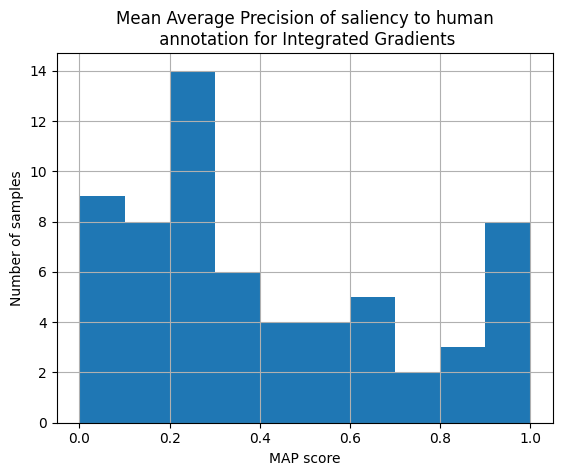

In [174]:
out['majo_anno_corrs'].hist()
plt.title("Mean Average Precision of saliency to human\n annotation for Integrated Gradients")
plt.xlabel("MAP score")
plt.ylabel("Number of samples")
plt.show()

In [175]:
print(pearsonr(out[out['pred_class'] == out['true_class']]['all_anno_corrs'], out[out['pred_class'] == out['true_class']]['saliency_range']))
print(pearsonr(out[out['pred_class'] == out['true_class']]['majo_anno_corrs'], out[out['pred_class'] == out['true_class']]['saliency_range']))


PearsonRResult(statistic=-0.5067761016371553, pvalue=3.07926434754894e-05)
PearsonRResult(statistic=-0.40306923113228516, pvalue=0.0012785294522187694)


In [176]:
print(pearsonr(out['pred_class'] == out['true_class'], out['SD']))
print(pearsonr(out['pred_class'] == out['true_class'], out['saliency_range']))
print(pearsonr(out['pred_entropy'], out['saliency_range']))
print(pearsonr(out['pred_entropy'], out['SD']))

print(pearsonr(out['pred_class'],  (out['saliency_range']-out['saliency_range'].min())/(out['saliency_range'].max()-out['saliency_range'].min())))
print(pearsonr((out['pred_entropy']-out['pred_entropy'].min())/(out['pred_entropy'].max()-out['pred_entropy'].min()),  (out['saliency_range']-out['saliency_range'].min())/(out['saliency_range'].max()-out['saliency_range'].min())))

PearsonRResult(statistic=-0.04998599306762976, pvalue=0.6972391955706789)
PearsonRResult(statistic=-0.03646772676632558, pvalue=0.7766006752604727)
PearsonRResult(statistic=-0.164070305018968, pvalue=0.19882117165568175)
PearsonRResult(statistic=-0.10274378710200548, pvalue=0.42295978165779946)
PearsonRResult(statistic=-0.10466861131391854, pvalue=0.4142765974676966)
PearsonRResult(statistic=-0.164070305018968, pvalue=0.19882117165568175)


In [177]:
print(pearsonr(out['anno_corrs'], out['saliency_range']))
print(pearsonr(out['all_anno_corrs'], out['saliency_range']))
print(pearsonr(out['majo_anno_corrs'], out['saliency_range']))


PearsonRResult(statistic=-0.4210484677338817, pvalue=0.000589750724242902)
PearsonRResult(statistic=-0.4919586988755528, pvalue=4.2228905069111246e-05)
PearsonRResult(statistic=-0.4016593265491123, pvalue=0.0011031426189433802)


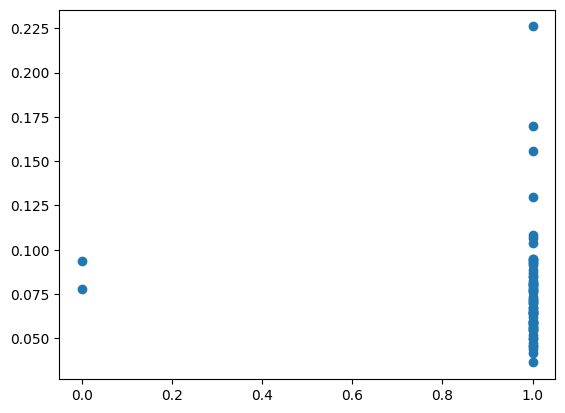

In [178]:
plt.scatter(out['pred_class'] == out['true_class'], out['SD'])

In [57]:
import warnings
warnings.filterwarnings('ignore')
models = ['bert', 'electra', 'roberta', 'gpt2-medium']
datasets = ['SST-2', 'SemEval', 'hatexplain']
dfs = []
lvls = ['05', '10', '25', '50', '70','80', '90', '95']

for m in models:
    for d in datasets:
        for nk in nks:
            for lvl in lvls:
                for pattern in ['human', 'gradient', 'random']:
                    if pattern == 'human':
                        pt = 'S'
                    else:
                        pt= None
            
                    dfs.append(collect_df(m, d, 'Clean', nk=nk, lvl=lvl, pt=pt, temp_fix=False))
        
# out = pd.concat(dfs)
        

Gave 0: ['hatexplain', 'Clean', None, 'GuidedBP', None, Index(['attribution_scores', 'anno'], dtype='object')]
FIXED:  ['hatexplain', 'Clean', None, 'GuidedBP', None, Index(['attribution_scores', 'anno'], dtype='object')]
FIXED:  ['hatexplain', 'Clean', None, 'GuidedBP', None, Index(['attribution_scores', 'anno'], dtype='object')]
Gave 0: ['hatexplain', 'Clean', None, 'InputXGrad', None, Index(['attribution_scores', 'anno'], dtype='object')]
FIXED:  ['hatexplain', 'Clean', None, 'InputXGrad', None, Index(['attribution_scores', 'anno'], dtype='object')]
FIXED:  ['hatexplain', 'Clean', None, 'InputXGrad', None, Index(['attribution_scores', 'anno'], dtype='object')]
Gave 0: ['hatexplain', 'Clean', None, 'IntegGrad', None, Index(['attribution_scores', 'anno'], dtype='object')]
FIXED:  ['hatexplain', 'Clean', None, 'IntegGrad', None, Index(['attribution_scores', 'anno'], dtype='object')]
FIXED:  ['hatexplain', 'Clean', None, 'IntegGrad', None, Index(['attribution_scores', 'anno'], dtype='ob

In [ ]:
# og_only = df_output[df_output['pattern'] == 'Clean']
print ( "Correlation between human agreement and uncertainty on CLEAN data")

subset = out[['entropy', 'pred_entropy'] + [f'{k}_all_anno_map' for k in grads] + [f'{k}_majo_anno_map' for k in grads]].dropna()
print("Model entropy, all annos")
[print(k, pearsonr(subset['entropy'],subset[f'{k}_all_anno_map'])) for k in grads]
print("Model entropy, majo annos")

[print(k, pearsonr(subset['entropy'],subset[f'{k}_majo_anno_map'])) for k in grads]
print("Data entropy, all annos")

[print(k, pearsonr(subset['pred_entropy'].iloc[:,0],subset[f'{k}_all_anno_map'])) for k in grads]
print("Data entropy, majo annos")

[print(k, pearsonr(subset['pred_entropy'].iloc[:,0],subset[f'{k}_majo_anno_map'])) for k in grads]

print("Model entropy, grad entropy")

subset = out[['entropy', 'pred_entropy'] + [f'{k}_complexity' for k in grads]].dropna()

[print(k, pearsonr(subset['entropy'],subset[f'{k}_complexity'])) for k in grads]

print("Data entropy, grad entropy")

[print(k, pearsonr(subset['pred_entropy'].iloc[:,0],subset[f'{k}_complexity'])) for k in grads]

Correlation between human agreement and uncertainty on CLEAN data
Model entropy, all annos
GuidedBP PearsonRResult(statistic=0.08512911812808101, pvalue=1.4810070484323939e-12)
InputXGrad PearsonRResult(statistic=0.07816832164906339, pvalue=8.259771797486611e-11)
IntegGrad PearsonRResult(statistic=0.0810104281078538, pvalue=1.6650122643887087e-11)
SmoothGrad PearsonRResult(statistic=0.03846572456834118, pvalue=0.0014090353598172015)
Model entropy, majo annos
GuidedBP PearsonRResult(statistic=0.09390823188035122, pvalue=5.759848692342286e-15)
InputXGrad PearsonRResult(statistic=0.08779668264838474, pvalue=2.902559711492298e-13)
IntegGrad PearsonRResult(statistic=0.07832755612700519, pvalue=7.561992743298857e-11)
SmoothGrad PearsonRResult(statistic=0.042187987405811846, pvalue=0.00046174808130021455)
Data entropy, all annos
GuidedBP PearsonRResult(statistic=0.09420670175842422, pvalue=4.724796443066238e-15)
InputXGrad PearsonRResult(statistic=0.08148433471760748, pvalue=1.267913423126942

[None, None, None, None]

In [ ]:
og_only = df_output[df_output['pattern'] == 'Clean']


print ( "Correlation between explanation complexity and uncertainty on CLEAN data")


[print(k, pearsonr(og_only['entropy'],og_only[f'{k}_entropy'])) for k in grads]

[print(k, pearsonr(og_only['entropy'],og_only[f'{k}_entropy'])) for k in grads]

[print(k, pearsonr(og_only['entropy'],og_only[f'{k}_entropy'])) for k in grads]

[print(k, pearsonr(og_only['entropy'],og_only[f'{k}_entropy'])) for k in grads]

Correlation between explanation complexity and uncertainty on CLEAN data
GuidedBP PearsonRResult(statistic=-0.1459797874864361, pvalue=0.7301515933554406)
InputXGrad PearsonRResult(statistic=-0.013462283943468992, pvalue=0.9747612672043098)
IntegGrad PearsonRResult(statistic=-0.10628780914534136, pvalue=0.8022062008017181)
SmoothGrad PearsonRResult(statistic=0.0017560988617796864, pvalue=0.9967073214036615)
GuidedBP PearsonRResult(statistic=-0.1459797874864361, pvalue=0.7301515933554406)
InputXGrad PearsonRResult(statistic=-0.013462283943468992, pvalue=0.9747612672043098)
IntegGrad PearsonRResult(statistic=-0.10628780914534136, pvalue=0.8022062008017181)
SmoothGrad PearsonRResult(statistic=0.0017560988617796864, pvalue=0.9967073214036615)
GuidedBP PearsonRResult(statistic=-0.1459797874864361, pvalue=0.7301515933554406)
InputXGrad PearsonRResult(statistic=-0.013462283943468992, pvalue=0.9747612672043098)
IntegGrad PearsonRResult(statistic=-0.10628780914534136, pvalue=0.8022062008017181)

[None, None, None, None]

In [ ]:
print ( "Correlation between human agreement and uncertainty on ALL data")

subset = df_output[['entropy', 'softmax_entropy'] + [f'{k}_all_anno_MAP' for k in grads] + [f'{k}_majo_anno_MAP' for k in grads]].dropna()

[print(k, pearsonr(subset['entropy'],subset[f'{k}_all_anno_MAP'])) for k in grads]

[print(k, pearsonr(subset['entropy'],subset[f'{k}_majo_anno_MAP'])) for k in grads]

[print(k, pearsonr(subset['softmax_entropy'],subset[f'{k}_all_anno_MAP'])) for k in grads]

[print(k, pearsonr(subset['softmax_entropy'],subset[f'{k}_majo_anno_MAP'])) for k in grads]

Correlation between human agreement and uncertainty on ALL data
GuidedBP PearsonRResult(statistic=0.06401292204596701, pvalue=0.007597021723582028)
InputXGrad PearsonRResult(statistic=0.05343517543732207, pvalue=0.025902837744828665)
IntegGrad PearsonRResult(statistic=-0.012327411725133526, pvalue=0.607551770506309)
SmoothGrad PearsonRResult(statistic=-0.025411789644734603, pvalue=0.2896866850706272)
GuidedBP PearsonRResult(statistic=0.049617679779523645, pvalue=0.03861055772805553)
InputXGrad PearsonRResult(statistic=0.03183692905325697, pvalue=0.1846272910373405)
IntegGrad PearsonRResult(statistic=-0.06734835562102912, pvalue=0.004971461878180343)
SmoothGrad PearsonRResult(statistic=-0.07498423627634355, pvalue=0.0017588169347190496)
GuidedBP PearsonRResult(statistic=0.08358082179944061, pvalue=0.0004866012907152278)
InputXGrad PearsonRResult(statistic=0.07446428050985707, pvalue=0.001893510505553574)
IntegGrad PearsonRResult(statistic=0.01588651290772386, pvalue=0.5080588302281299)


[None, None, None, None]

In [ ]:
print ( "Correlation between explanation complexity and uncertainty on ALL data")

subset = df_output[['entropy', 'softmax_entropy'] + [f'{k}_entropy' for k in grads]].dropna()

[print(k, pearsonr(subset['entropy'],subset[f'{k}_entropy'])) for k in grads]

[print(k, pearsonr(subset['softmax_entropy'],subset[f'{k}_entropy'])) for k in grads]


Correlation between explanation complexity and uncertainty on ALL data
GuidedBP PearsonRResult(statistic=-0.18721918212293315, pvalue=3.571923949540991e-15)
InputXGrad PearsonRResult(statistic=-0.032989721114461024, pvalue=0.16922324226863175)
IntegGrad PearsonRResult(statistic=-0.19972052056196976, pvalue=4.277156954918531e-17)
SmoothGrad PearsonRResult(statistic=-0.20292264420202133, pvalue=1.3118057561567245e-17)
GuidedBP PearsonRResult(statistic=-0.17212297976683133, pvalue=5.029119271238806e-13)
InputXGrad PearsonRResult(statistic=0.02065813598743981, pvalue=0.3894054852383224)
IntegGrad PearsonRResult(statistic=-0.20490375907491815, pvalue=6.2513593252303935e-18)
SmoothGrad PearsonRResult(statistic=-0.21617739388859883, pvalue=7.956205745597933e-20)


[None, None, None, None]

In [ ]:
[print(k, pearsonr(df_output['softmax_entropy'],df_output[f'{k}_all_anno_MAP'])) for k in grads]

GuidedBP PearsonRResult(statistic=-0.14880475456188347, pvalue=1.138039344392178e-06)
InputXGrad PearsonRResult(statistic=-0.27266987560021294, pvalue=1.5835826525789172e-19)
IntegGrad PearsonRResult(statistic=-0.4609518015344991, pvalue=7.043983087780025e-57)
SmoothGrad PearsonRResult(statistic=-0.459611511112034, pvalue=1.6170718843820774e-56)


[None, None, None, None]

In [ ]:
from scipy.stats import pearsonr
perturb_pattern = pd.Series(load_from_disk(f"./Data/Noise/SemEval")[f"random_PATTERN_05"], index=load_from_disk(f"./Data/Noise/SemEval")["index"], name="perturbation")
    
collect_stats('bert', 'SemEval', 'random', 'token-mask','05',)

/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/home/fvd442/anaconda3/envs/noise-paper/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:979: U

['random',
 None,
 'bert',
 'SemEval',
 'token-mask',
 '05',
 0.9119951778179627,
 0.9797769740807716,
 0.06742360731314045,
 0.9601320729379931,
 0.009392112453332423,
 0.11037400734635242,
 0.027984798977912992,
 0.3681802678602376,
 0.6922157861791933,
 0.8359428745546068,
 0.5069796170091562,
 nan,
 nan,
 nan,
 nan,
 0.00036504246903731034,
 0.031882630316105914,
 -0.21300948878840423,
 -0.27551919724210383,
 1.0,
 1.0,
 1.0,
 1.0,
 0.03820285937768877,
 0.031361019453101296,
 0.03308813365927672,
 0.06724458946585646,
 0.03820285937768877,
 0.031361019453101296,
 0.03308813365927672,
 0.06724458946585646,
 2.5684517089878334,
 2.6041257923016463,
 2.561465408305985,
 2.8441323250720933]

In [39]:
clean = df_output.dropna()

[print(pearsonr(clean['entropy'],clean[f'{k}_noise_corr'])) for k in grads]

PearsonRResult(statistic=0.09618919563933175, pvalue=0.10329924319393959)
PearsonRResult(statistic=0.06498476824528014, pvalue=0.2716833822439446)
PearsonRResult(statistic=-0.07547355472512221, pvalue=0.20157378881664612)
PearsonRResult(statistic=-0.15313015387835044, pvalue=0.009247360589722902)


[None, None, None, None]

## RQ3

In [123]:
df_output

,pattern,pattern_type,model,data,perturbation,lvl,accuracy,softmax_prob,softmax_entropy,certainty_mean,...,IntegGrad_majo_anno_MAP,SmoothGrad_majo_anno_MAP,GuidedBP_entropy,InputXGrad_entropy,IntegGrad_entropy,SmoothGrad_entropy,GuidedBP_MAV,InputXGrad_MAV,IntegGrad_MAV,SmoothGrad_MAV
0,Clean,NaN,bert,SemEval,NaN,0.0,0.918626,0.981266,0.063106,0.960928,...,0.030873,0.073895,2.568491,2.611997,2.552966,2.840892,0.115816,0.120145,0.124634,0.150191
1,Clean,NaN,electra,SemEval,NaN,0.0,0.916817,0.963677,0.121569,0.940098,...,0.026206,0.021561,2.598346,2.671022,2.711322,2.955960,0.056557,0.061208,0.089694,0.129192
2,Clean,NaN,roberta,SemEval,NaN,0.0,0.941531,0.988487,0.044915,0.966613,...,0.035255,0.039450,2.581743,2.566321,2.563486,2.937648,0.117265,0.104219,0.118982,0.147388
3,Clean,NaN,gpt2-medium,SemEval,NaN,0.0,0.854129,0.879204,0.275280,0.773432,...,0.044017,0.031218,2.383409,2.435485,2.357063,2.777800,0.105812,0.110549,0.099682,0.150060
4,random,NaN,bert,SemEval,token-unk,5.0,0.908981,0.979904,0.065307,0.958845,...,0.033898,0.070796,2.575553,2.614047,2.563868,2.844262,0.119361,0.123948,0.126794,0.152655
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
959,human,S,gpt2-medium,hatexplain,l33t,50.0,0.022767,0.631305,0.844570,0.612608,...,0.221727,0.212210,2.344264,2.375918,2.206951,2.743939,0.087850,0.090608,0.081220,0.141175
960,human,S,gpt2-medium,hatexplain,l33t,70.0,0.012259,0.657951,0.815095,0.644648,...,0.222777,0.216351,2.351535,2.374064,2.188066,2.731535,0.072959,0.076274,0.064862,0.127952
961,human,S,gpt2-medium,hatexplain,l33t,80.0,0.021891,0.664194,0.808044,0.650142,...,0.227764,0.214695,2.360817,2.369233,2.186301,2.723779,0.069456,0.071451,0.060640,0.123797
962,human,S,gpt2-medium,hatexplain,l33t,90.0,0.011384,0.668354,0.803713,0.654059,...,0.225616,0.214985,2.363608,2.378271,2.195941,2.720372,0.063509,0.065672,0.056214,0.119484


In [74]:
import numpy as np

import matplotlib.pyplot as plt
import numpy as np

from matplotlib.patches import Circle, RegularPolygon
from matplotlib.path import Path
from matplotlib.projections import register_projection
from matplotlib.projections.polar import PolarAxes
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D


def radar_factory(num_vars, frame='circle'):
    """
    Create a radar chart with `num_vars` axes.

    This function creates a RadarAxes projection and registers it.

    Parameters
    ----------
    num_vars : int
        Number of variables for radar chart.
    frame : {'circle', 'polygon'}
        Shape of frame surrounding axes.

    """
    # calculate evenly-spaced axis angles
    theta = np.linspace(0, 2*np.pi, num_vars, endpoint=False)

    class RadarTransform(PolarAxes.PolarTransform):

        def transform_path_non_affine(self, path):
            # Paths with non-unit interpolation steps correspond to gridlines,
            # in which case we force interpolation (to defeat PolarTransform's
            # autoconversion to circular arcs).
            if path._interpolation_steps > 1:
                path = path.interpolated(num_vars)
            return Path(self.transform(path.vertices), path.codes)

    class RadarAxes(PolarAxes):

        name = 'radar'
        PolarTransform = RadarTransform

        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)
            # rotate plot such that the first axis is at the top
            self.set_theta_zero_location('N')

        def fill(self, *args, closed=True, **kwargs):
            """Override fill so that line is closed by default"""
            return super().fill(closed=closed, *args, **kwargs)

        def plot(self, *args, **kwargs):
            """Override plot so that line is closed by default"""
            lines = super().plot(*args, **kwargs)
            for line in lines:
                self._close_line(line)

        def _close_line(self, line):
            x, y = line.get_data()
            # FIXME: markers at x[0], y[0] get doubled-up
            if x[0] != x[-1]:
                x = np.append(x, x[0])
                y = np.append(y, y[0])
                line.set_data(x, y)

        def set_varlabels(self, labels):
            self.set_thetagrids(np.degrees(theta), labels)

        def _gen_axes_patch(self):
            # The Axes patch must be centered at (0.5, 0.5) and of radius 0.5
            # in axes coordinates.
            if frame == 'circle':
                return Circle((0.5, 0.5), 0.5)
            elif frame == 'polygon':
                return RegularPolygon((0.5, 0.5), num_vars,
                                      radius=.5, edgecolor="k")
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

        def _gen_axes_spines(self):
            if frame == 'circle':
                return super()._gen_axes_spines()
            elif frame == 'polygon':
                # spine_type must be 'left'/'right'/'top'/'bottom'/'circle'.
                spine = Spine(axes=self,
                              spine_type='circle',
                              path=Path.unit_regular_polygon(num_vars))
                # unit_regular_polygon gives a polygon of radius 1 centered at
                # (0, 0) but we want a polygon of radius 0.5 centered at (0.5,
                # 0.5) in axes coordinates.
                spine.set_transform(Affine2D().scale(.5).translate(.5, .5)
                                    + self.transAxes)
                return {'polar': spine}
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

    register_projection(RadarAxes)
    return theta


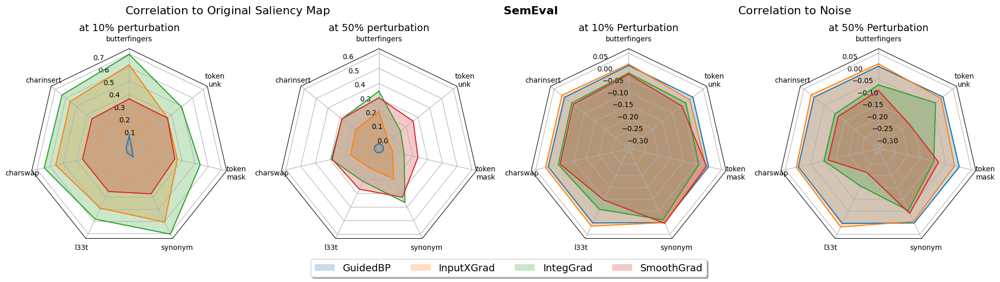

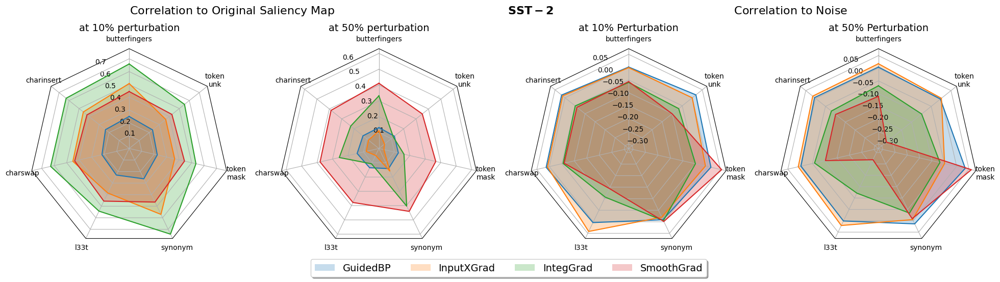

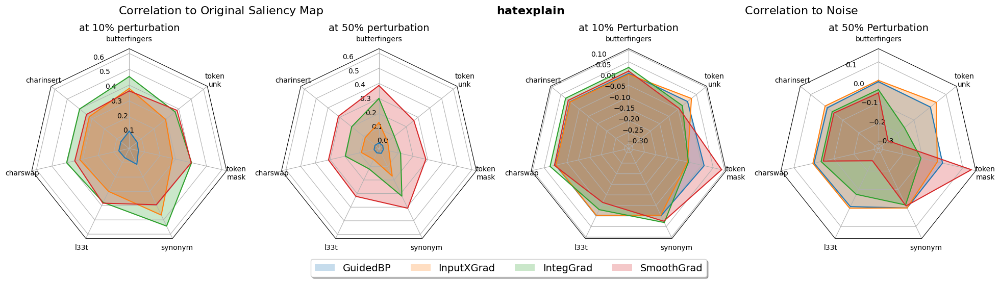

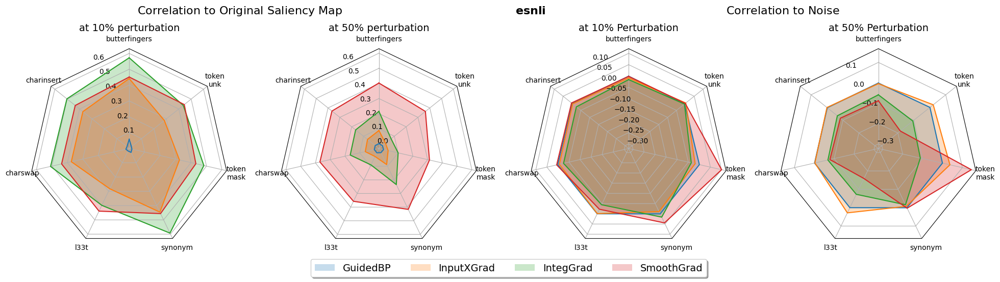

In [75]:
nks = ['token-unk', 'token-mask', 'charswap', 'synonym', 'butterfingers',  'charinsert', 'l33t'] #,'wordswap']

for DOI in datasets:

    subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']

    at50 = subset[(subset['lvl'] == 50) & (subset['perturbation'] != 'wordswap')]
    at25 = subset[(subset['lvl'] == 10) & (subset['perturbation'] != 'wordswap')]

    N = len(nks)
    theta = radar_factory(N, frame='polygon')
        
    fig, ax = plt.subplots(1,4,figsize=(24, 6), subplot_kw=dict(projection='radar'))
    fig.suptitle(f"Correlation to Original Saliency Map                                                "+ r"$\bf{"+ DOI + "}$" +"                                                  Correlation to Noise", size= 16)
    # fig.tight_layout()
    fig.subplots_adjust(wspace = 0.25, bottom=0.05, top=0.97)
    # ax.set_rgrids([0.2, 0.4, 0.6, 0.8])
    title = "at 10% perturbation"
    data = at25.groupby(["perturbation"])[['GuidedBP_og_corr',
        'InputXGrad_og_corr', 'IntegGrad_og_corr', 'SmoothGrad_og_corr']].mean()

    spoke_labels = [i if not "-" in i else i.replace("-","\n") for i in data.index.tolist()]
    theta = radar_factory(N, frame='polygon')

    ax[0].set_title(title,  position=(0.5, 1.1), ha='center', size=14)

    for d in data.columns:
        line = ax[0].plot(theta, data[d])
        ax[0].fill(theta, data[d], alpha=0.25, label=d.split('_')[0])
    ax[0].set_varlabels(spoke_labels)
    ax[0].plot(0.6, color='white')
    ax[0].plot(0.0, color='white')


    #        'GuidedBP_noise_corr', 'InputXGrad_noise_corr', 'IntegGrad_noise_corr','SmoothGrad_noise_corr', 'GuidedBP_anno_corr', 'InputXGrad_anno_corr','IntegGrad_anno_corr', 'SmoothGrad_anno_corr'



    data = at50.groupby(["perturbation"])[['GuidedBP_og_corr',
        'InputXGrad_og_corr', 'IntegGrad_og_corr', 'SmoothGrad_og_corr']].mean()

    N = data.shape[0]
    theta = radar_factory(N, frame='polygon')
    # spoke_labels = data.index.tolist()
    title = "at 50% perturbation"

    N = data.shape[0]
    theta = radar_factory(N, frame='polygon')

    # fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(projection='radar'))
    # fig.subplots_adjust(top=0.85, bottom=0.05)

    # ax.set_rgrids([0.2, 0.4, 0.6, 0.8])
    ax[1].set_title(title,  position=(0.5, 1.1), ha='center', size=14)

    for d in data.columns:
        line = ax[1].plot(theta, data[d])
        ax[1].fill(theta, data[d], alpha=0.25, label=d.split('_')[0])
    ax[1].set_varlabels(spoke_labels)
    ax[1].plot(0.6, color='white')
    ax[1].plot(0, color='white')

    data = at25.groupby(["perturbation"])[['GuidedBP_noise_corr', 'InputXGrad_noise_corr', 'IntegGrad_noise_corr','SmoothGrad_noise_corr',]].mean()

    N = data.shape[0]
    theta = radar_factory(N, frame='polygon')
    title = "at 10% Perturbation"
    # ax.set_rgrids([0.2, 0.4, 0.6, 0.8])
    ax[2].set_title(title,  position=(0.5, 1.1), ha='center', size=14)

    for d in data.columns:
        line = ax[2].plot(theta, data[d])
        ax[2].fill(theta, data[d], alpha=0.25, label=d.split('_')[0])
        
    ax[2].plot(0.05, color='white')
    ax[2].plot(-0.3, color='white')

    ax[2].set_varlabels(spoke_labels)


    data = at50.groupby(["perturbation"])[['GuidedBP_noise_corr', 'InputXGrad_noise_corr', 'IntegGrad_noise_corr','SmoothGrad_noise_corr',]].mean()

    N = data.shape[0]
    theta = radar_factory(N, frame='polygon')
    title = "at 50% Perturbation"

    # ax.set_rgrids([0.2, 0.4, 0.6, 0.8])
    ax[3].set_title(title,  position=(0.5, 1.1), ha='center', size=14)

    for d in data.columns:
        line = ax[3].plot(theta, data[d])
        ax[3].fill(theta, data[d], alpha=0.25, label=d.split('_')[0])
        
    ax[3].plot(0.05, color='white')
    ax[3].plot(-0.3, color='white')

    ax[3].set_varlabels(spoke_labels)

    ax[3].legend(loc='upper center', bbox_to_anchor=(-1.35, -0.03),ncols=4, fancybox=True, prop = { "size": 14 }, shadow=True)


    # plt.legend()
    plt.show()

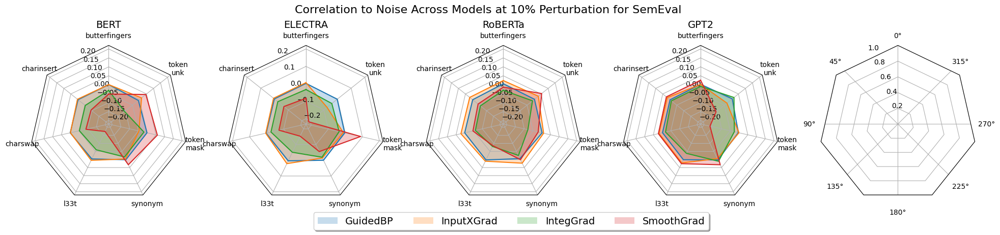

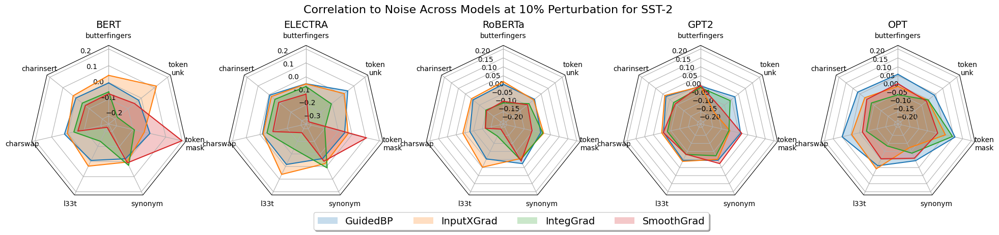

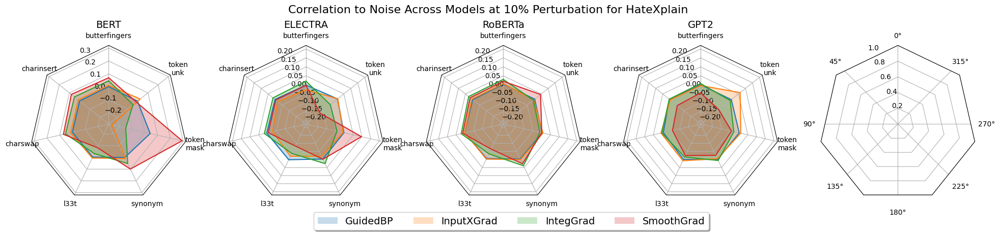

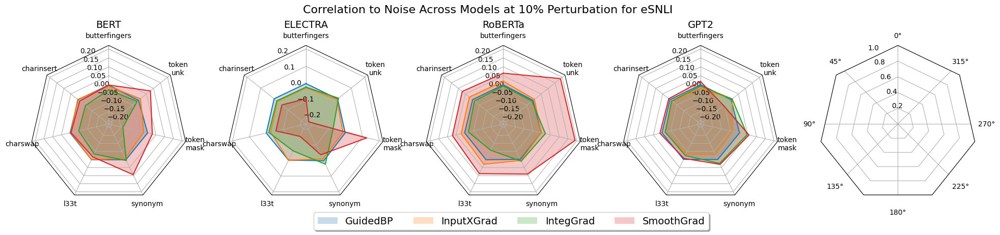

In [95]:
nks = ['token-unk', 'token-mask', 'charswap', 'synonym', 'butterfingers',  'charinsert', 'l33t'] #,'wordswap']


models = ['bert', 'electra', 'roberta', 'gpt2-medium', 'opt']
df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'ELECTRA', 'gpt2-medium': 'GPT2', 'opt': 'OPT'}

data_to_text = {'SST-2': 'SST-2', 'SemEval': 'SemEval', 'hatexplain': 'HateXplain', 'esnli': 'eSNLI'}

# plt.rcParams.update({'axes.titlesize': 'small'})

for DOI in datasets:

    subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']

    at50 = subset[(subset['lvl'] == 50) & (subset['perturbation'] != 'wordswap')]
    at25 = subset[(subset['lvl'] == 10) & (subset['perturbation'] != 'wordswap')]

    fig, ax = plt.subplots(1,5, figsize=(24, 5), subplot_kw=dict(projection='radar')) 
    fig.suptitle(f"Correlation to Noise Across Models at 10% Perturbation for {data_to_text[DOI]}", size= 16)
    # fig.tight_layout()
    fig.subplots_adjust(wspace = 0.25, bottom=0.05, top=0.97)
    # ax.set_rgrids([0.2, 0.4, 0.6, 0.8])
    title = "at 10% perturbation"
    data = at25.groupby(["perturbation"])[['GuidedBP_og_corr',
        'InputXGrad_og_corr', 'IntegGrad_og_corr', 'SmoothGrad_og_corr']].mean()

    spoke_labels = [i if not "-" in i else i.replace("-","\n") for i in data.index.tolist()]


    for i,m in enumerate(models):
        if m in subset.model.unique():
            at25 = subset[(subset['lvl'] == 10) & (subset['model'] == m)& (subset['perturbation'] != 'wordswap')]
            data = at25.groupby(["perturbation"])[['GuidedBP_noise_corr', 'InputXGrad_noise_corr', 'IntegGrad_noise_corr','SmoothGrad_noise_corr',]].mean()

            N = data.shape[0]
            theta = radar_factory(N, frame='polygon')
            spoke_labels = [i if not "-" in i else i.replace("-","\n") for i in data.index.tolist()]

            # ax.set_rgrids([0.2, 0.4, 0.6, 0.8])
            ax[i].set_title(df_to_text[m], size=14,  position=(0.5, 1.1), ha='center')

            for d in data.columns:
                line = ax[i].plot(theta, data[d])
                ax[i].fill(theta, data[d], alpha=0.25, label=d.split('_')[0])
            ax[i].set_varlabels(spoke_labels)
            ax[i].plot(0.2, color='white')
            ax[i].plot(-0.2, color='white')


        # plt.legend()
    ax[3].legend(loc='upper center', bbox_to_anchor=(-0.7, -0.03),ncols=4, fancybox=True, prop = { "size": 14 }, shadow=True)
    # plt.tight_layout()
    plt.show()

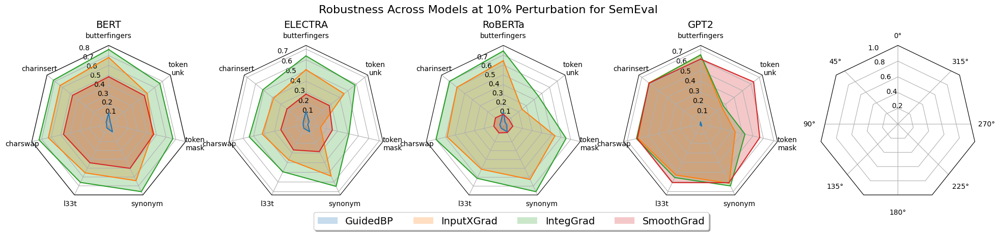

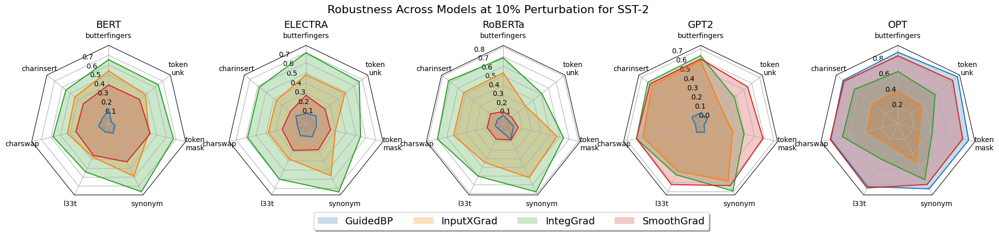

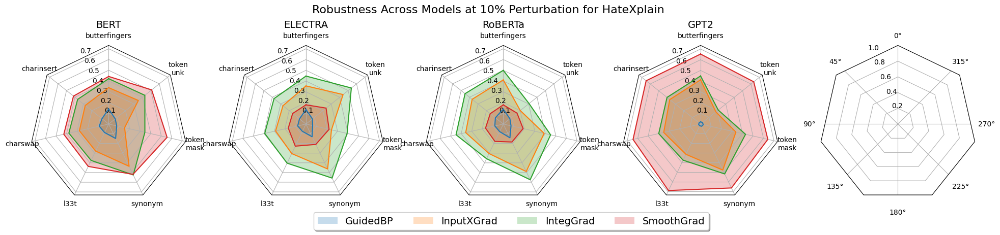

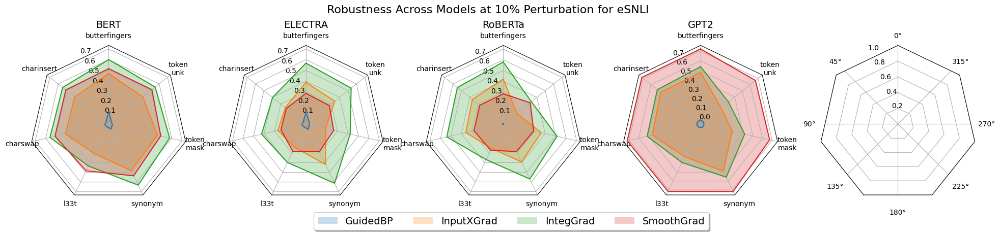

In [97]:
nks = ['token-unk', 'token-mask', 'charswap', 'synonym', 'butterfingers',  'charinsert', 'l33t'] #,'wordswap']


models = ['bert', 'electra', 'roberta', 'gpt2-medium', 'opt']
df_to_text = {'bert': 'BERT', 'roberta': 'RoBERTa', 'electra': 'ELECTRA', 'gpt2-medium': 'GPT2', 'opt': 'OPT'}

data_to_text = {'SST-2': 'SST-2', 'SemEval': 'SemEval', 'hatexplain': 'HateXplain', 'esnli': 'eSNLI'}


for DOI in datasets:

    subset = df_output[df_output['data'] == DOI] #df_output[df_output['data'] == 'hatexplain']

    at50 = subset[(subset['lvl'] == 50) & (subset['perturbation'] != 'wordswap')]
    at25 = subset[(subset['lvl'] == 10) & (subset['perturbation'] != 'wordswap')]
    
    fig, ax = plt.subplots(1,5,figsize=(24, 5), subplot_kw=dict(projection='radar'))
    fig.suptitle(f"Robustness Across Models at 10% Perturbation for {data_to_text[DOI]}", size= 16)
    # fig.tight_layout()
    fig.subplots_adjust(wspace = 0.25, bottom=0.05, top=0.97)
    # ax.set_rgrids([0.2, 0.4, 0.6, 0.8])
    title = "at 10% perturbation"


    spoke_labels = [i if not "-" in i else i.replace("-","\n") for i in data.index.tolist()]


    for i,m in enumerate(models):
        if m in subset.model.unique():
            at25 = subset[(subset['lvl'] == 10) & (subset['model'] == m)& (subset['perturbation'] != 'wordswap')]
            data = at25.groupby(["perturbation"])[['GuidedBP_og_corr',
            'InputXGrad_og_corr', 'IntegGrad_og_corr', 'SmoothGrad_og_corr']].mean()

            N = data.shape[0]
            theta = radar_factory(N, frame='polygon')
            spoke_labels = [i if not "-" in i else i.replace("-","\n") for i in data.index.tolist()]

            # ax.set_rgrids([0.2, 0.4, 0.6, 0.8])
            ax[i].set_title(df_to_text[m], size=14,  position=(0.5, 1.1), ha='center')

            for d in data.columns:
                line = ax[i].plot(theta, data[d])
                ax[i].fill(theta, data[d], alpha=0.25, label=d.split('_')[0])
            ax[i].set_varlabels(spoke_labels)
            ax[i].plot(0.7, color='white')

        # plt.legend()
    ax[3].legend(loc='upper center', bbox_to_anchor=(-0.7, -0.03),ncols=4, fancybox=True, prop = { "size": 14 }, shadow=True)

    plt.show()